<center>

<h1>Прогноз оттока клиентов. Телеком.</h1>

---
    
</center>

## Бизнес-задача.
Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его
сотрудники начнут предлагать промокоды и специальные условия всем, кто
планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей,
«ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент
договор. Команда оператора собрала персональные данные о некоторых клиентах,
информацию об их тарифах и услугах. Необходимо обучить на этих данных
модель для прогноза оттока клиентов.

## МО-задача.
Создание модели бинарной классификации, обученной "с учителем", с максимизацией метрики $ROC-AUC$, не менее $0.85$.

## Описание услуг заказчика.

Оператор предоставляет два основных типа услуг:
- Стационарную телефонную связь. <br>
Телефон можно подключить к нескольким линиям одновременно.
- Интернет. <br>
Подключение бывает двух типов:
  - через телефонную линию DSL (англ. digital subscriber line — «цифровая абонентская линия»)
  - через оптоволоконный кабель (англ. fiber optic).<br>

Также абонентам доступен ряд услуг:
- Интернет-безопасность: антивирус (Device Protection) и блокировка опасных сайтов (Online Security);
- Выделенная линия технической поддержки (Tech Support);
- Облачное хранилище файлов для резервного копирования данных (Online Backup);
- Стриминговое телевидение (Streaming TV) и каталог фильмов (Streaming Movies).<br>

За услуги клиенты могут платить ежемесячно или раз в 1–2 года. Доступны различные способы расчёта и возможность получить электронный чек.

## Описание данных.

Данные хранятся в базе данных PostgreSQL. Она состоит из нескольких таблиц:
- Таблица `telecom.contract` — информация о договорах:
  - ``customerID`` — ID абонента;
  - `BeginDate` — дата начала действия договора;
  - `EndDate` — дата окончания действия договора;
  - `Type` — тип оплаты: раз в год-два или ежемесячно;
  - `PaperlessBilling` — электронный расчётный лист;
  - `PaymentMethod` — тип платежа;
  - `MonthlyCharges` — расходы за месяц;
  - `TotalCharges` — общие расходы абонента.

- Таблица `telecom.personal` — персональные данные клиентов:
  - `customerID` — ID пользователя;
  - `gender` — пол;
  - `SeniorCitizen` — является ли абонент пенсионером;
  - `Partner` — есть ли у абонента супруг или супруга;
  - `Dependents` — есть ли у абонента дети.

- Таблица `telecom.internet`  — информация об интернет-услугах:
  - `customerID` — ID пользователя;
  - `InternetService` — тип подключения;
  - `OnlineSecurity` — блокировка опасных сайтов;
  - `OnlineBackup` — облачное хранилище файлов для резервного копирования данных;
  - `DeviceProtection` — антивирус;
  - `TechSupport` — выделенная линия технической поддержки;
  - `StreamingTV` — стриминговое телевидение;
  - `StreamingMovies` — каталог фильмов.

- Таблица `telecom.phone` — информация об услугах телефонии:
  - `customerID` — ID пользователя;
  - `MultipleLines` — подключение телефона к нескольким линиям одновременно.

<br>Информация о договорах актуальна на 1 февраля 2020.

## Информация о ноутбуке.
- Время выполнения: ~70 мин.


## Содержание.
<div class="toc"><ul class="toc-item"><li><span><a href="#Бизнес-задача." data-toc-modified-id="Бизнес-задача.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Бизнес-задача.</a></span></li><li><span><a href="#МО-задача." data-toc-modified-id="МО-задача.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>МО-задача.</a></span></li><li><span><a href="#Описание-услуг-заказчика." data-toc-modified-id="Описание-услуг-заказчика.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Описание услуг заказчика.</a></span></li><li><span><a href="#Описание-данных." data-toc-modified-id="Описание-данных.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Описание данных.</a></span></li><li><span><a href="#Информация-о-ноутбуке." data-toc-modified-id="Информация-о-ноутбуке.-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Информация о ноутбуке.</a></span></li><li><span><a href="#Содержание" data-toc-modified-id="Содержание-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Содержание</a></span></li><li><span><a href="#Загрузка-библиотек." data-toc-modified-id="Загрузка-библиотек.-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Загрузка библиотек.</a></span></li><li><span><a href="#Установка-параметров-проекта." data-toc-modified-id="Установка-параметров-проекта.-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Установка параметров проекта.</a></span></li><li><span><a href="#Загрузка-данных." data-toc-modified-id="Загрузка-данных.-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Загрузка данных.</a></span><ul class="toc-item"><li><span><a href="#Проверка-соединения-и-наличия-таблиц." data-toc-modified-id="Проверка-соединения-и-наличия-таблиц.-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Проверка соединения и наличия таблиц.</a></span><ul class="toc-item"><li><span><a href="#Функция-проверки-соединения-и-загрузки-данных." data-toc-modified-id="Функция-проверки-соединения-и-загрузки-данных.-9.1.1"><span class="toc-item-num">9.1.1&nbsp;&nbsp;</span>Функция проверки соединения и загрузки данных.</a></span></li><li><span><a href="#Проверка-соединения." data-toc-modified-id="Проверка-соединения.-9.1.2"><span class="toc-item-num">9.1.2&nbsp;&nbsp;</span>Проверка соединения.</a></span></li><li><span><a href="#Проверка-соединения-и-наличия-таблиц.-Вывод." data-toc-modified-id="Проверка-соединения-и-наличия-таблиц.-Вывод.-9.1.3"><span class="toc-item-num">9.1.3&nbsp;&nbsp;</span>Проверка соединения и наличия таблиц. Вывод.</a></span></li></ul></li><li><span><a href="#Загрузка-данных." data-toc-modified-id="Загрузка-данных.-9.2"><span class="toc-item-num">9.2&nbsp;&nbsp;</span>Загрузка данных.</a></span></li><li><span><a href="#Предварительная-обработка-данных." data-toc-modified-id="Предварительная-обработка-данных.-9.3"><span class="toc-item-num">9.3&nbsp;&nbsp;</span>Предварительная обработка данных.</a></span><ul class="toc-item"><li><span><a href="#Создание-целевого-признака." data-toc-modified-id="Создание-целевого-признака.-9.3.1"><span class="toc-item-num">9.3.1&nbsp;&nbsp;</span>Создание целевого признака.</a></span></li><li><span><a href="#Функция-изменения-индекса." data-toc-modified-id="Функция-изменения-индекса.-9.3.2"><span class="toc-item-num">9.3.2&nbsp;&nbsp;</span>Функция изменения индекса.</a></span></li><li><span><a href="#Предварительная-обработка-данных." data-toc-modified-id="Предварительная-обработка-данных.-9.3.3"><span class="toc-item-num">9.3.3&nbsp;&nbsp;</span>Предварительная обработка данных.</a></span></li><li><span><a href="#Словарь-названей-столбцов." data-toc-modified-id="Словарь-названей-столбцов.-9.3.4"><span class="toc-item-num">9.3.4&nbsp;&nbsp;</span>Словарь названей столбцов.</a></span></li></ul></li><li><span><a href="#Загрузка-данных.-Вывод." data-toc-modified-id="Загрузка-данных.-Вывод.-9.4"><span class="toc-item-num">9.4&nbsp;&nbsp;</span>Загрузка данных. Вывод.</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-данных.-Вспомогательные-функции." data-toc-modified-id="Исследовательский-анализ-данных.-Вспомогательные-функции.-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Исследовательский анализ данных. Вспомогательные функции.</a></span><ul class="toc-item"><li><span><a href="#Функция-вычисления-процента-выбросов." data-toc-modified-id="Функция-вычисления-процента-выбросов.-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span>Функция вычисления процента выбросов.</a></span></li><li><span><a href="#Функция-вывода-информации-о-корреляции-признаков." data-toc-modified-id="Функция-вывода-информации-о-корреляции-признаков.-10.2"><span class="toc-item-num">10.2&nbsp;&nbsp;</span>Функция вывода информации о корреляции признаков.</a></span></li><li><span><a href="#Функция-вывода-информации-о-данных." data-toc-modified-id="Функция-вывода-информации-о-данных.-10.3"><span class="toc-item-num">10.3&nbsp;&nbsp;</span>Функция вывода информации о данных.</a></span></li><li><span><a href="#Функция-вывода-графиков." data-toc-modified-id="Функция-вывода-графиков.-10.4"><span class="toc-item-num">10.4&nbsp;&nbsp;</span>Функция вывода графиков.</a></span></li></ul></li><li><span><a href="#Предварительный-исследовательский-анализ-данных." data-toc-modified-id="Предварительный-исследовательский-анализ-данных.-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Предварительный исследовательский анализ данных.</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Вывод-дополнительной-информации." data-toc-modified-id="Вывод-дополнительной-информации.-11.0.1"><span class="toc-item-num">11.0.1&nbsp;&nbsp;</span>Вывод дополнительной информации.</a></span></li></ul></li><li><span><a href="#Предварительный-исследовательский-анализ-данных.-Вывод." data-toc-modified-id="Предварительный-исследовательский-анализ-данных.-Вывод.-11.1"><span class="toc-item-num">11.1&nbsp;&nbsp;</span>Предварительный исследовательский анализ данных. Вывод.</a></span><ul class="toc-item"><li><span><a href="#Состав-данных." data-toc-modified-id="Состав-данных.-11.1.1"><span class="toc-item-num">11.1.1&nbsp;&nbsp;</span>Состав данных.</a></span></li><li><span><a href="#Пропуски,-дубликаты-и-аномалии." data-toc-modified-id="Пропуски,-дубликаты-и-аномалии.-11.1.2"><span class="toc-item-num">11.1.2&nbsp;&nbsp;</span>Пропуски, дубликаты и аномалии.</a></span></li><li><span><a href="#Объединение-и-заполнение-пропусков." data-toc-modified-id="Объединение-и-заполнение-пропусков.-11.1.3"><span class="toc-item-num">11.1.3&nbsp;&nbsp;</span>Объединение и заполнение пропусков.</a></span></li></ul></li></ul></li><li><span><a href="#Объединение-данных." data-toc-modified-id="Объединение-данных.-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>Объединение данных.</a></span><ul class="toc-item"><li><span><a href="#Заполнение-пропусков-в-таблице-contract." data-toc-modified-id="Заполнение-пропусков-в-таблице-contract.-12.1"><span class="toc-item-num">12.1&nbsp;&nbsp;</span>Заполнение пропусков в таблице <code>contract</code>.</a></span></li><li><span><a href="#Объединение-данных." data-toc-modified-id="Объединение-данных.-12.2"><span class="toc-item-num">12.2&nbsp;&nbsp;</span>Объединение данных.</a></span><ul class="toc-item"><li><span><a href="#Проверка-соответствия-customer_id." data-toc-modified-id="Проверка-соответствия-customer_id.-12.2.1"><span class="toc-item-num">12.2.1&nbsp;&nbsp;</span>Проверка соответствия <code>customer_id</code>.</a></span><ul class="toc-item"><li><span><a href="#Проверка-соответствия-customer_id.-Вывод." data-toc-modified-id="Проверка-соответствия-customer_id.-Вывод.-12.2.1.1"><span class="toc-item-num">12.2.1.1&nbsp;&nbsp;</span>Проверка соответствия <code>customer_id</code>. Вывод.</a></span></li></ul></li><li><span><a href="#Функция-объединения-данных." data-toc-modified-id="Функция-объединения-данных.-12.2.2"><span class="toc-item-num">12.2.2&nbsp;&nbsp;</span>Функция объединения данных.</a></span></li><li><span><a href="#Объединение-данных." data-toc-modified-id="Объединение-данных.-12.2.3"><span class="toc-item-num">12.2.3&nbsp;&nbsp;</span>Объединение данных.</a></span></li><li><span><a href="#Объединение-данных.-Вывод." data-toc-modified-id="Объединение-данных.-Вывод.-12.2.4"><span class="toc-item-num">12.2.4&nbsp;&nbsp;</span>Объединение данных. Вывод.</a></span></li></ul></li><li><span><a href="#Заполнение-пропусков." data-toc-modified-id="Заполнение-пропусков.-12.3"><span class="toc-item-num">12.3&nbsp;&nbsp;</span>Заполнение пропусков.</a></span></li><li><span><a href="#Удаления-ключа-объединения-customer_id." data-toc-modified-id="Удаления-ключа-объединения-customer_id.-12.4"><span class="toc-item-num">12.4&nbsp;&nbsp;</span>Удаления ключа объединения <code>customer_id</code>.</a></span></li><li><span><a href="#Объединение-данных.-Вывод." data-toc-modified-id="Объединение-данных.-Вывод.-12.5"><span class="toc-item-num">12.5&nbsp;&nbsp;</span>Объединение данных. Вывод.</a></span></li></ul></li><li><span><a href="#Создание-признаков." data-toc-modified-id="Создание-признаков.-13"><span class="toc-item-num">13&nbsp;&nbsp;</span>Создание признаков.</a></span><ul class="toc-item"><li><span><a href="#Создание--новых-признаков.-Вывод." data-toc-modified-id="Создание--новых-признаков.-Вывод.-13.1"><span class="toc-item-num">13.1&nbsp;&nbsp;</span>Создание  новых признаков. Вывод.</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-объединённого-датафрейма." data-toc-modified-id="Исследовательский-анализ-объединённого-датафрейма.-14"><span class="toc-item-num">14&nbsp;&nbsp;</span>Исследовательский анализ объединённого датафрейма.</a></span><ul class="toc-item"><li><span><a href="#Исследовательский-анализ-объединённого-датафрейма." data-toc-modified-id="Исследовательский-анализ-объединённого-датафрейма.-14.1"><span class="toc-item-num">14.1&nbsp;&nbsp;</span>Исследовательский анализ объединённого датафрейма.</a></span><ul class="toc-item"><li><span><a href="#Задача-моделирования." data-toc-modified-id="Задача-моделирования.-14.1.1"><span class="toc-item-num">14.1.1&nbsp;&nbsp;</span>Задача моделирования.</a></span></li><li><span><a href="#Состав-данных." data-toc-modified-id="Состав-данных.-14.1.2"><span class="toc-item-num">14.1.2&nbsp;&nbsp;</span>Состав данных.</a></span></li><li><span><a href="#Целевой-признак." data-toc-modified-id="Целевой-признак.-14.1.3"><span class="toc-item-num">14.1.3&nbsp;&nbsp;</span>Целевой признак.</a></span></li><li><span><a href="#👆-Анализ-признаков." data-toc-modified-id="👆-Анализ-признаков.-14.1.4"><span class="toc-item-num">14.1.4&nbsp;&nbsp;</span>👆 Анализ признаков.</a></span></li><li><span><a href="#Корреляционный-анализ." data-toc-modified-id="Корреляционный-анализ.-14.1.5"><span class="toc-item-num">14.1.5&nbsp;&nbsp;</span>Корреляционный анализ.</a></span></li><li><span><a href="#Пропуски,-дубликаты-и-аномалии." data-toc-modified-id="Пропуски,-дубликаты-и-аномалии.-14.1.6"><span class="toc-item-num">14.1.6&nbsp;&nbsp;</span>Пропуски, дубликаты и аномалии.</a></span></li><li><span><a href="#Формат-и-масштаб-данных." data-toc-modified-id="Формат-и-масштаб-данных.-14.1.7"><span class="toc-item-num">14.1.7&nbsp;&nbsp;</span>Формат и масштаб данных.</a></span></li><li><span><a href="#Рекомендации-заказчику." data-toc-modified-id="Рекомендации-заказчику.-14.1.8"><span class="toc-item-num">14.1.8&nbsp;&nbsp;</span>Рекомендации заказчику.</a></span></li></ul></li></ul></li><li><span><a href="#Удаление-признаков." data-toc-modified-id="Удаление-признаков.-15"><span class="toc-item-num">15&nbsp;&nbsp;</span>Удаление признаков.</a></span><ul class="toc-item"><li><span><a href="#Удаление-признаков.-Вывод." data-toc-modified-id="Удаление-признаков.-Вывод.-15.1"><span class="toc-item-num">15.1&nbsp;&nbsp;</span>Удаление признаков. Вывод.</a></span></li></ul></li><li><span><a href="#Разделение-данных-на-обучающую-и-тестовую-выборки." data-toc-modified-id="Разделение-данных-на-обучающую-и-тестовую-выборки.-16"><span class="toc-item-num">16&nbsp;&nbsp;</span>Разделение данных на обучающую и тестовую выборки.</a></span><ul class="toc-item"><li><span><a href="#Вспомогательные-функции." data-toc-modified-id="Вспомогательные-функции.-16.1"><span class="toc-item-num">16.1&nbsp;&nbsp;</span>Вспомогательные функции.</a></span><ul class="toc-item"><li><span><a href="#Функция-выделения-выборок-со-стратификацией." data-toc-modified-id="Функция-выделения-выборок-со-стратификацией.-16.1.1"><span class="toc-item-num">16.1.1&nbsp;&nbsp;</span>Функция выделения выборок со стратификацией.</a></span></li></ul></li><li><span><a href="#Разделение-данных-на-обучающую-и-тестовую-выборки." data-toc-modified-id="Разделение-данных-на-обучающую-и-тестовую-выборки.-16.2"><span class="toc-item-num">16.2&nbsp;&nbsp;</span>Разделение данных на обучающую и тестовую выборки.</a></span></li><li><span><a href="#Разделение-данных-на-обучающую-и-тестовую-выборки.-Вывод." data-toc-modified-id="Разделение-данных-на-обучающую-и-тестовую-выборки.-Вывод.-16.3"><span class="toc-item-num">16.3&nbsp;&nbsp;</span>Разделение данных на обучающую и тестовую выборки. Вывод.</a></span></li></ul></li><li><span><a href="#Подготовка-к-обучению." data-toc-modified-id="Подготовка-к-обучению.-17"><span class="toc-item-num">17&nbsp;&nbsp;</span>Подготовка к обучению.</a></span><ul class="toc-item"><li><span><a href="#Вспомогательные-функции." data-toc-modified-id="Вспомогательные-функции.-17.1"><span class="toc-item-num">17.1&nbsp;&nbsp;</span>Вспомогательные функции.</a></span><ul class="toc-item"><li><span><a href="#Функция-формирования-трансформеров-данных." data-toc-modified-id="Функция-формирования-трансформеров-данных.-17.1.1"><span class="toc-item-num">17.1.1&nbsp;&nbsp;</span>Функция формирования трансформеров данных.</a></span></li><li><span><a href="#Функции-подбора-гиперпараметров." data-toc-modified-id="Функции-подбора-гиперпараметров.-17.1.2"><span class="toc-item-num">17.1.2&nbsp;&nbsp;</span>Функции подбора гиперпараметров.</a></span></li><li><span><a href="#Функция-подбора-гиперпараметров-RandomForestClassifier." data-toc-modified-id="Функция-подбора-гиперпараметров-RandomForestClassifier.-17.1.3"><span class="toc-item-num">17.1.3&nbsp;&nbsp;</span>Функция подбора гиперпараметров <code>RandomForestClassifier</code>.</a></span></li><li><span><a href="#Функция-подбора-гиперпараметров-XGBoost." data-toc-modified-id="Функция-подбора-гиперпараметров-XGBoost.-17.1.4"><span class="toc-item-num">17.1.4&nbsp;&nbsp;</span>Функция подбора гиперпараметров <code>XGBoost</code>.</a></span></li><li><span><a href="#Функция-подбора-гиперпараметров-CatBoostClassifier." data-toc-modified-id="Функция-подбора-гиперпараметров-CatBoostClassifier.-17.1.5"><span class="toc-item-num">17.1.5&nbsp;&nbsp;</span>Функция подбора гиперпараметров <code>CatBoostClassifier</code>.</a></span></li><li><span><a href="#Функция-подбора-гиперпараметров-MLPClassifier." data-toc-modified-id="Функция-подбора-гиперпараметров-MLPClassifier.-17.1.6"><span class="toc-item-num">17.1.6&nbsp;&nbsp;</span>Функция подбора гиперпараметров <code>MLPClassifier</code>.</a></span></li><li><span><a href="#Функция---тестовый-стенд." data-toc-modified-id="Функция---тестовый-стенд.-17.1.7"><span class="toc-item-num">17.1.7&nbsp;&nbsp;</span>Функция - тестовый стенд.</a></span></li></ul></li></ul></li><li><span><a href="#Обучение-и-валидация." data-toc-modified-id="Обучение-и-валидация.-18"><span class="toc-item-num">18&nbsp;&nbsp;</span>Обучение и валидация.</a></span><ul class="toc-item"><li><span><a href="#Валидация-моделей." data-toc-modified-id="Валидация-моделей.-18.1"><span class="toc-item-num">18.1&nbsp;&nbsp;</span>Валидация моделей.</a></span></li><li><span><a href="#Обучение-и-валидация.-Вывод." data-toc-modified-id="Обучение-и-валидация.-Вывод.-18.2"><span class="toc-item-num">18.2&nbsp;&nbsp;</span>Обучение и валидация. Вывод.</a></span></li></ul></li><li><span><a href="#Тестирование-модели." data-toc-modified-id="Тестирование-модели.-19"><span class="toc-item-num">19&nbsp;&nbsp;</span>Тестирование модели.</a></span><ul class="toc-item"><li><span><a href="#Тестирование-модели.-Вывод." data-toc-modified-id="Тестирование-модели.-Вывод.-19.1"><span class="toc-item-num">19.1&nbsp;&nbsp;</span>Тестирование модели. Вывод.</a></span></li></ul></li><li><span><a href="#Зависимость-входного-признака-от-целевого." data-toc-modified-id="Зависимость-входного-признака-от-целевого.-20"><span class="toc-item-num">20&nbsp;&nbsp;</span>Зависимость входного признака от целевого.</a></span></li><li><span><a href="#Общий-вывод." data-toc-modified-id="Общий-вывод.-21"><span class="toc-item-num">21&nbsp;&nbsp;</span>Общий вывод.</a></span><ul class="toc-item"><li><span><a href="#Задача." data-toc-modified-id="Задача.-21.1"><span class="toc-item-num">21.1&nbsp;&nbsp;</span>Задача.</a></span></li><li><span><a href="#Результаты-работы." data-toc-modified-id="Результаты-работы.-21.2"><span class="toc-item-num">21.2&nbsp;&nbsp;</span>Результаты работы.</a></span></li><li><span><a href="#Ход-работы." data-toc-modified-id="Ход-работы.-21.3"><span class="toc-item-num">21.3&nbsp;&nbsp;</span>Ход работы.</a></span></li><li><span><a href="#Состав-и-анализ-данных." data-toc-modified-id="Состав-и-анализ-данных.-21.4"><span class="toc-item-num">21.4&nbsp;&nbsp;</span>Состав и анализ данных.</a></span></li><li><span><a href="#Целевой-признак." data-toc-modified-id="Целевой-признак.-21.5"><span class="toc-item-num">21.5&nbsp;&nbsp;</span>Целевой признак.</a></span></li><li><span><a href="#Пропуски,-дубликаты-и-аномалии." data-toc-modified-id="Пропуски,-дубликаты-и-аномалии.-21.6"><span class="toc-item-num">21.6&nbsp;&nbsp;</span>Пропуски, дубликаты и аномалии.</a></span></li><li><span><a href="#Рекомендации-заказчику." data-toc-modified-id="Рекомендации-заказчику.-21.7"><span class="toc-item-num">21.7&nbsp;&nbsp;</span>Рекомендации заказчику.</a></span></li></ul></li></ul></div>

## Загрузка библиотек.

---

In [1]:
# Проверим и установим пакеты, требующие установки.
for pkg in ['optuna', 'phik', 'sqlalchemy', 'psycopg2-binary', 'imblearn',
            'category_encoders', 'catboost', 'inflection', 'shap']:
    try:
        __import__(pkg)
    except:
        print(f'- Установка "{pkg}"')
        !pip install {pkg} -q

- Установка "psycopg2-binary"


In [2]:
# perf_counter для контроля времени исполнения.
from time import perf_counter
notebook_time_start = perf_counter()

# os для обращения к среде разработки, sqlalchemy для sql запросов.
import os
from sqlalchemy import create_engine, text
from sqlalchemy.orm import sessionmaker

# Работа с датафреймами, расчёты, визуализация, анализ.
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
import phik, shap
from pandas.api.types import (is_numeric_dtype,
                              is_object_dtype,
                              is_datetime64_any_dtype)
from matplotlib import rc

# Модели.
# Случайный лес, CatBoost, XGBoost  и нейросеть MLP.
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# Классы и методы для манипуляции с данными и работы с моделями.
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import (train_test_split, cross_val_predict,
                                      StratifiedKFold)
from sklearn.preprocessing import (OrdinalEncoder, StandardScaler,
                                   OneHotEncoder)
from category_encoders.cat_boost import CatBoostEncoder
# Ресемплинг.
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbPipeline

# Подбор гиперпараметров.
import optuna
from optuna.visualization.matplotlib import plot_param_importances
# # Метрики.
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,
                             roc_auc_score, auc, roc_curve, 
                             f1_score, accuracy_score, recall_score, 
                             precision_score)
# Дополнительные модули.
# Union и Optional для комментирования типов.
from typing import Union, Optional
# tqdm для контроля выполнения ячеек.
from tqdm.notebook import tqdm, trange
from tqdm.contrib.itertools import product
# inflection для коррекции названий столбцов.
from inflection import underscore
# multiprocessing для оценки кол-ва доступных потоков.
from multiprocessing import cpu_count
# Подавление предупреждений.
import warnings
# Кастомизация вывода.
from IPython.display import display_html, HTML

## Установка параметров проекта.

---

- Определим параметры соединения с базой данных.
- Установим начальное значение генератора псевдослучайных чисел как дату начала работы над проектом.
- Определим название целевого признака и другие константы.
- Определим другие параметры проекта.

In [3]:
# Соединение с базой данных.
# Определим словарь с настройками соединения.
DB_CONFIG = {
'user': 'praktikum_student',# имя пользователя,
'pwd': 'Sdf4$2;d-d30pp',# пароль,
'host': 'rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net',
'port': 6432,# порт подключения,
'db': 'data-science-final'# название базы данных,
}
# Определим строку с настройками для создания соединения.
CONN_STRING = 'postgresql://{}:{}@{}:{}/{}'.format(
    DB_CONFIG['user'],
    DB_CONFIG['pwd'],
    DB_CONFIG['host'],
    DB_CONFIG['port'],
    DB_CONFIG['db']
)

# Установим начальное значение генератора псевдослучайных чисел.
SEED = 160424
np.random.seed(SEED)

# Управление ресурсами.
# Определим кол-во доступных потоков CPU.
CPU_COUNT = cpu_count() - 1
print(f'Доступно потоков CPU: {CPU_COUNT}.')

# Константы.
# Названия таблиц.
TABLE_NAMES = ['contract', 'personal', 'internet', 'phone']
# Целевой признак.
TARGET = 'churn'
# Зададим размер тестовой выборки, установленный в задаче.
TEST_SIZE = 0.25

# Вывод.
# Заблокируем предупреждения.
warnings.filterwarnings('ignore')
# Зададим уровень логирования Optuna.
optuna.logging.set_verbosity(optuna.logging.WARNING)
# Активируем progress_apply.
tqdm.pandas()
# Зададим функцию вывода центрированного текста.
def print_h(text : str, *args, **kwargs) -> None:
    display(HTML('<div style="text-align:center; font-weight:bold; '+
                 f'font-size:20px">{text}</div>'))
# Зададим функцию вывода жирного текста.
def print_b(text : str, *args, **kwargs) -> None:
    print(f'\033[1m{text}\033[0m', *args, **kwargs)
# Зададим функцию вывода информации в режиме отладки.
def print_v(verbose : int = 1, level : int = 1, *args, **kwargs) -> None:
    if level == 1 and verbose == 1:
        print(*args, **kwargs)
    elif level <= 2 and verbose == 2:
        print(*args, **kwargs)
    elif level <= 3 and verbose == 3:
        print(*args, **kwargs)
    elif verbose > 3:
        print(*args, **kwargs)
# Функция вывода семпла датафрейма в стиле.
def display_s(df : pd.DataFrame, name : str = 'Датафрейм') -> None:
    display(df.style.set_caption(name).set_table_styles(styles))

# Визуализация.
# Установим стиль отображения заголовков таблиц.
styles = [
    dict(selector = 'caption',
         props = [('text-align', 'center'),
                  ('font-size', '130%'),
                  ('font-weight', 'bold'),
                  ('white-space', 'pre-wrap')]),
    dict(selector = 'th',
         props = [('max-width', '250px')])
    ]

# Установим отображение всех столбцов.
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
max_colwidth = pd.option_context('display.max_colwidth', None)

# Установим параметры отображения графиков.
MPL_WIDTH = 15
MPL_HEIGHT = 5
rc('font', size = 14)
sns.set_style('darkgrid')
figure_kwargs = dict(figsize = (MPL_WIDTH, MPL_HEIGHT),
                     facecolor = 'white',
                     autolayout = True,
                     titlesize = 16)
rc('figure', **figure_kwargs)

# Установим отображение графиков по центру ячейки
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
    horizontal-align: middle;
}
</style>
""")

Доступно потоков CPU: 11.


## Загрузка данных.

---

- Проверим соединение.
- Загрузим данные.
- Предобработаем данные до проведения анализа при необходимости.

### Проверка соединения и наличия таблиц.
- Создадим функцию проверки соединения и наличия таблиц и загрузки данных.
- Выведем информацию о соединении, размеры и первые строки таблиц.

#### Функция проверки соединения и загрузки данных.
- Для обеспечения закрытия соединения с базой данных, совместим проверку соединения и наличия таблиц в одной функции с загузкой таблиц.
- Создадим функцию, которая
  - принимает на вход:
    - словари с настройками соединения;
    - список названий таблиц;
    - флаг загрузки таблиц;
  - либо проверяет соединение с базой данных и наличие таблиц и выводит
    - информацию о соединении;
    - размеры и первые строки таблиц;
  - либо возвращает список загруженных таблиц.

In [4]:
# Функция проверки соединения и загрузки таблиц.
def check_or_load_tables(
        conn_string : str = CONN_STRING,
        db_config : dict[str, str] = DB_CONFIG,
        names : list[str] = TABLE_NAMES,
        load : bool = False
        ) -> Union[list[pd.DataFrame], None]:

    # Установим соединение с хостом.
    engine = create_engine(conn_string)
    Session = sessionmaker(bind=engine)
    session = Session()

    # Определим список таблиц.
    df_list = [f'telecom.{name}' for name in names]

    if not load:
        # Проверка соединения.
        try:
            print_b(f'Соединение с хостом {db_config["host"]} для '+
                  f'пользователя {db_config["user"]} установлено.\n')
        except Exception as ex:
            print_b('Соединение с базой данной не установлено из-за '+
                    f'ошибки: {ex}.')

        # Получение информации о таблицах.
        for table_name in tqdm(df_list):
            # Получение размера таблицы (в т.ч. в Кбайт).
            num_rows = (session.execute(text(
                f"SELECT COUNT(*) FROM {table_name}"
            )).scalar())
            table_size = (session.execute(text(
                "SELECT pg_size_pretty(pg_total_relation_size"+
                f"('{table_name}'))"
            )).scalar())
            head = f"SELECT * FROM {table_name} LIMIT 3;"

            print_h(f'<br>Таблица "{table_name}".')
            print_b(f'- Кол-во строк: {num_rows}')
            print_b(f'- Размер таблицы в Кбайт: {table_size}')
            display(pd.read_sql_query(text(head), session.connection()))

        # Закроем соединение.
        session.close()

    elif load:
        # Загрузим данные.
        res = []
        for table_name in tqdm(df_list):
            query = '''SELECT *
                       FROM ''' + table_name + ';'
            res.append(pd.read_sql_query(text(query), engine.connect()))

        # Закроем соединение.
        print('Данные загружены.\n')
        session.close()

        return res

#### Проверка соединения.
- Вызовем функцию и выведем информацию о соединении и первые строки таблиц.

In [5]:
check_or_load_tables()

Соединение с хостом rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net для пользователя praktikum_student установлено.



  0%|          | 0/4 [00:00<?, ?it/s]

- Кол-во строк: 7043
- Размер таблицы в Кбайт: 728 kB


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,4472-LVYGI,2020-02-01,None,Two year,Yes,Bank transfer (automatic),52.55,NaN
1,3115-CZMZD,2020-02-01,None,Two year,No,Mailed check,20.25,NaN
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15


- Кол-во строк: 7043
- Размер таблицы в Кбайт: 456 kB


,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No


- Кол-во строк: 5518
- Размер таблицы в Кбайт: 440 kB


,c1,c2,c3,c4,c5,c6,c7,c8
0,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No


- Кол-во строк: 6362
- Размер таблицы в Кбайт: 320 kB


,c1,c2
0,customerID,MultipleLines
1,5575-GNVDE,No
2,3668-QPYBK,No


#### Проверка соединения и наличия таблиц. Вывод.
- Все таблицы из описания данных в наличии.
- Размеры таблиц позволяют загрузить и работать с ними с использованием __Pandas__.
- Признак `end_date` содержит дату ухода клиента и является основанием для создания целевого признака.
- Необходимо изменить индекс солбцов таблиц `internet` и `phone` на значения первого ряда.
- Необходимо привести названия столбцов всех таблиц к "змеиному" регистру для удобства работы.
- Необходимо ввести словарь с переводом названий столбцов для визуализации.

### Загрузка данных.
- Вызовем функцию и запишем данные в переменные.
- Проверим результат.

In [6]:
# Загрузим данные.
(contract, personal,
 internet, phone) = check_or_load_tables(load=True)

# Проверим результат.
for df, name in zip([contract, personal, internet, phone],
                    TABLE_NAMES):
    print_h(f'Таблица "{name}".')
    display(df.head(2))
    print_b(f'Информация о таблице "{name}".\n')
    df.info()
    display(df.describe())
    for col in df.columns:
        if is_object_dtype(df[col]) and df[col].nunique() < 20:
            print_b(f'Уникальные значения категориального столбца "{col}".')
            display(df[col].unique())        

  0%|          | 0/4 [00:00<?, ?it/s]

Данные загружены.



,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,4472-LVYGI,2020-02-01,None,Two year,Yes,Bank transfer (automatic),52.55,NaN
1,3115-CZMZD,2020-02-01,None,Two year,No,Mailed check,20.25,NaN


Информация о таблице "contract".

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           1869 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7032 non-null   float64
dtypes: float64(2), object(6)
memory usage: 440.3+ KB


,MonthlyCharges,TotalCharges
count,7043.000000,7032.000000
mean,64.761692,2283.300441
std,30.090047,2266.771362
min,18.250000,18.800000
25%,35.500000,401.450000
50%,70.350000,1397.475000
75%,89.850000,3794.737500
max,118.750000,8684.800000


Уникальные значения категориального столбца "EndDate".


array([None, datetime.date(2019, 12, 1), datetime.date(2019, 11, 1),
       datetime.date(2019, 10, 1), datetime.date(2020, 1, 1)],
      dtype=object)

Уникальные значения категориального столбца "Type".


array(['Two year', 'Month-to-month', 'One year'], dtype=object)

Уникальные значения категориального столбца "PaperlessBilling".


array(['Yes', 'No'], dtype=object)

Уникальные значения категориального столбца "PaymentMethod".


array(['Bank transfer (automatic)', 'Mailed check', 'Electronic check',
       'Credit card (automatic)'], dtype=object)

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No


Информация о таблице "personal".

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


,SeniorCitizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


Уникальные значения категориального столбца "gender".


array(['Female', 'Male'], dtype=object)

Уникальные значения категориального столбца "Partner".


array(['Yes', 'No'], dtype=object)

Уникальные значения категориального столбца "Dependents".


array(['No', 'Yes'], dtype=object)

,c1,c2,c3,c4,c5,c6,c7,c8
0,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No


Информация о таблице "internet".

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5518 entries, 0 to 5517
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   c1      5518 non-null   object
 1   c2      5518 non-null   object
 2   c3      5518 non-null   object
 3   c4      5518 non-null   object
 4   c5      5518 non-null   object
 5   c6      5518 non-null   object
 6   c7      5518 non-null   object
 7   c8      5518 non-null   object
dtypes: object(8)
memory usage: 345.0+ KB


,c1,c2,c3,c4,c5,c6,c7,c8
count,5518,5518,5518,5518,5518,5518,5518,5518
unique,5518,3,3,3,3,3,3,3
top,customerID,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


Уникальные значения категориального столбца "c2".


array(['InternetService', 'DSL', 'Fiber optic'], dtype=object)

Уникальные значения категориального столбца "c3".


array(['OnlineSecurity', 'No', 'Yes'], dtype=object)

Уникальные значения категориального столбца "c4".


array(['OnlineBackup', 'Yes', 'No'], dtype=object)

Уникальные значения категориального столбца "c5".


array(['DeviceProtection', 'No', 'Yes'], dtype=object)

Уникальные значения категориального столбца "c6".


array(['TechSupport', 'No', 'Yes'], dtype=object)

Уникальные значения категориального столбца "c7".


array(['StreamingTV', 'No', 'Yes'], dtype=object)

Уникальные значения категориального столбца "c8".


array(['StreamingMovies', 'No', 'Yes'], dtype=object)

,c1,c2
0,customerID,MultipleLines
1,5575-GNVDE,No


Информация о таблице "phone".

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362 entries, 0 to 6361
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   c1      6362 non-null   object
 1   c2      6362 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


,c1,c2
count,6362,6362
unique,6362,3
top,customerID,No
freq,1,3390


Уникальные значения категориального столбца "c2".


array(['MultipleLines', 'No', 'Yes'], dtype=object)

### Предварительная обработка данных.
- <span style="color: blue;"> ВЕРСИЯ2: </span>Создадим бинарный целевой признак, в котором
  - 1 - клиент ушёл: даты закрытия договора в наличии;
  - 0 - клиент не ушёл: пропуски в признаке `EndDate`.

- Создадим функцию изменения индекса.
- Проверим наличие последней актуальной даты `2020-02-01` в столбце `end_date` таблицы `contract` и, при отсутствии таких дат, заполним ей пропуски в данном столбце для последующего создания признака длительности контрактов.
- Изменим индекс где необходимо и приведем названия столбцов к "змеиному" регистру.
- Приведём типы.
  - Приведём столбцы `begin_date` и `end_date` в таблице `contracts` к типу `datetime`, т.к. значения являются датами;
  - В столбце `senior_citizen` заменим $1$ на `Yes` и $0$ на `No`для удобства анализа;
  - Тип оставшихся данных соответствует содержанию (приводить `float64` нет необходимости, т.к. датасет имеет малый размер).

- Проверим результат.
- Введём словарь с переводом названий столбцов.

#### Создание целевого признака.

In [7]:
contract[TARGET] = np.where(contract.EndDate.isna(), 0, 1)
display_s(contract.head(), 'Таблица "contract"')
print_b('Информация о таблице "contract".')
contract.info()
print_b(f'Распределение целевого признака "{TARGET}".')
display(contract.value_counts(TARGET))

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,churn
0,4472-LVYGI,2020-02-01,None,Two year,Yes,Bank transfer (automatic),52.550000,nan,0
1,3115-CZMZD,2020-02-01,None,Two year,No,Mailed check,20.250000,nan,0
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.850000,108.150000,1
3,5709-LVOEQ,2020-02-01,None,Two year,No,Mailed check,80.850000,nan,0
4,9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.700000,151.650000,1


Информация о таблице "contract".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           1869 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7032 non-null   float64
 8   churn             7043 non-null   int32  
dtypes: float64(2), int32(1), object(6)
memory usage: 467.8+ KB
Распределение целевого признака "churn".


churn
0    5174
1    1869
dtype: int64

#### Функция изменения индекса.

In [8]:
# Функция изменения индексов.
def reindex_df(df_list : list[pd.DataFrame]) -> list[pd.DataFrame]:
    df_reindexed = []
    for df in df_list:
        df.columns = df.iloc[0]
        df.drop(df.index[0], inplace=True)
        df_reindexed.append(df)
    print('Индексы исправлены.\n')

    return df_reindexed

#### Предварительная обработка данных.

- Проверим `EndDate` на наличие последней актуальной даты - `2020-02-01`.

In [9]:
print_b('- Количество договоров с датой окончания 2020-02-01:',
        (contract.EndDate == '2020-02-01').sum())

- Количество договоров с датой окончания 2020-02-01: 0


In [10]:
# Изменим индекс.
internet, phone = reindex_df([internet, phone])

# Заменим названия столбцов.
for df in [contract, personal, internet, phone]:
    df.columns = [underscore(name) for name in df.columns]

# Заменим типы данных.
contract['begin_date'] = pd.to_datetime(contract.begin_date, 
                                        format='%Y-%m-%d')
contract['end_date'] = pd.to_datetime(contract.end_date, 
                                      format='%Y-%m-%d')
personal['senior_citizen'] = np.where(personal.senior_citizen == 1,
                                      'Yes', 'No')
# Заполним пропуски.
contract.end_date.fillna('2020-02-01', inplace=True)

# Проверим результат.
for df, name in zip([contract, personal, internet, phone],
                    TABLE_NAMES):
    print_h(f'Таблица "{name}".')
    print_h(f'-'*(len(name)*4))
    display(df.head(4))
    print_b(f'Информация о таблице "{name}".')
    df.info()
    print('\n')

Индексы исправлены.



,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn
0,4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,0
1,3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,0
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,1
3,5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,0


Информация о таблице "contract".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   churn              7043 non-null   int32         
dtypes: datetime64[ns](2), float64(2), int32(1), object(4)
memory usage: 467.8+ KB




,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,No,Yes,No
1,5575-GNVDE,Male,No,No,No
2,3668-QPYBK,Male,No,No,No
3,7795-CFOCW,Male,No,No,No


Информация о таблице "personal".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   object
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: object(5)
memory usage: 275.2+ KB




,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
4,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No


Информация о таблице "internet".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 1 to 5517
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB




,customer_id,multiple_lines
1,5575-GNVDE,No
2,3668-QPYBK,No
3,9237-HQITU,No
4,9305-CDSKC,Yes


Информация о таблице "phone".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 1 to 6361
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB




#### Словарь названей столбцов.
- Создадим словарь с переводом названий столбцов.

In [11]:
col_names = {
    'customer_id' : 'Id абонента',
    'begin_date' : 'Дата начала обслуживания',
    'end_date' : 'Дата окончания обслуживания',
    'type' : 'Тип оплаты',
    'paperless_billing' : 'Электронный биллинг',
    'payment_method' : 'Тип платежа',
    'monthly_charges' : 'Расходы за месяц',
    'total_charges' : 'Общие расходы',
    'gender' : 'Пол', 'senior_citizen' : 'Пенсионер',
    'partner' : 'Супруг', 'dependents' : 'Дети',
    'internet_service' : 'Тип подключения к интернету',
    'online_security' : 'Блокировка опасных сайтов',
    'online_backup' : 'Облако для резервного копирования',
    'device_protection' : 'Антивирус',
    'tech_support' : 'Выделенная тех. поддержка',
    'streaming_tv' : 'Телевидение',
    'streaming_movies' : 'Каталог фильмов',
    'multiple_lines' : 'Многоканальный телефон',
    'contract' : 'Информация о договорах',
    'personal' : 'Персональные данные клиентов',
    'internet' : 'Информация об интернет-услугах',
    'phone' : 'Информация об услугах телефонии',
    'tenure' : 'Длительность контракта в днях',
    'churn' : 'Отток',
    'num_services' : 'Количество приобретённых услуг',
    'ytitle' : 'Количество',
    'key_1' : 'Клиент ушёл',
    'key_0' : 'Клиент не ушёл',
    'tenure_left' : 'Дней после окончания контракта \nдо отчётного периода',
    'total_charges_per_month' : 'Общие расходы по месяцам',
    'overcharges' : 'Общий перерасход сверх контракта',
    'internet_service_Fiber optic' : 'Интернет с Fiber optic',
    'internet_service_DSL' : 'Интернет с DSL',
    'internet_service_No_service' : 'Интернет не используется',
    'payment_method_Credit card (auto)' : 'Автоплатёж по карте',
    'payment_method_Bank transfer (auto)' : 'Автоплатёж по банковской карте',
    'payment_method_Electronic check' :	'Оплата по электронному чеку',
    'payment_method_Mailed check' : 'Оплата по бумажному чеку',
    'total_by_monthly' : 'Отношение общих расходов \nк расходам по месяцам',
    'type_paperless_payment' : 'Тип контракта и оплаты, \nэл. биллинг',
    'type_paperless_payment_monthly' : 
    'Средний расход по типу контракта \nи оплаты, эл. биллингу',
    'monthly_charges_per_internet_service' : 
    'Cредний расход по типу интернета'   
}

### Загрузка данных. Вывод.
- Данные загружены: состав данных соответствует описанию.
- <span style="color: blue;"> ВЕРСИЯ2: </span>Создан целевой признак `churn`.
- Пропуски в столбце `end_date` заполнены последней актуальной уникальной датой - `2020-02-01`.
- Индексы и названия столбцов исправлены.
- Типы данных приведены.
- Создан словарь с переводом названий столбцов.
- Введём вспомогательные функции и проведём предварительный исследовательский анализ каждой из таблиц.

## Исследовательский анализ данных. Вспомогательные функции.

---
- Введём вспомогательные функции:
  - функцию вычисления процента выбросов;
  - функцию вывода информации о корреляции признаков;
  - функцию вывода информации о данных;
  - функцию вывода графиков ИАД.

### Функция вычисления процента выбросов.
- Функция примет
  - признак;
  - метку вывода пограничных значений;
  - коэффициент для расчёта пограничных значений<br>
  (по умолчанию коэффициент = 1.5, что соответствует "усам" диаграммы размаха и 2.7$\sigma$).
- Функция вычислит и выведет процент значений вне границ, и, при необходимости, пограничные значения.

In [12]:
# Введём функцию расчёта и вывода процентов выбросов для отобранных
# признаков.
def get_outliers_ratio(
        col: pd.Series,
        whiskers : bool = False,
        iqr_coeff : float = 1.5
        ) -> Union[tuple[float, float, float], float]:

    # Вычислим интерквартильный размах.
    distr_iqr = col.quantile(.75) - col.quantile(.25)
    # Вычислим границы.
    whisker_upp = col.quantile(.75) + iqr_coeff * distr_iqr
    whisker_low = col.quantile(.25) - iqr_coeff * distr_iqr
    # Если усы больше экстремумов, приравняем их.
    if whisker_upp >= col.max():
        whisker_upp = col.max()
    if whisker_low <= col.min():
        whisker_low = col.min()
    else:
        pass
    # Вычислим процент выбросов.
    outliers_ratio = (
        (col[col > whisker_upp].count() +
         col[col < whisker_low].count()) /
        len(col)
        )
    # Выведем границы и процент выбросов если необходимо.
    if whiskers:
        return (whisker_low, whisker_upp, outliers_ratio)
    # Выведем только процент выбросов.
    else:
        return outliers_ratio

### Функция вывода информации о корреляции признаков.

Создадим функцию вывода информации о корреляции признаков, воспользовавшись библиотекой `Phi_K`, которая 
- примет 
  - датафрейм;
  - флаг вывода стат. значимости корреляции;
  - <span style="color: blue;"> ВЕРСИЯ2: </span>опционально порог количества уникальных значений количественных признаков для формирования списка;
- создаст список количественных признаков для вычисления кореляции;
- вычислит корреляцию и статистическую значимость для каждой пары признаков;
- выведет тепловые карты:
  - матрицу корреляции с коэффициентами корреляции Пирсона для линейных зависимостей и коэффициентами $\phi_k$ (модифицированный $\chi^2$) для нелинейных зависимостей;
  - матрицу статистической значимости корреляции признаков.

In [13]:
# Введём функцию вывода информации о корреляции.
def get_phik_data(data: pd.DataFrame(),
                  significance : bool = False,
                  num_values_nunique_min : Optional[list[str]] = 11,
                  translate : bool = False,
                  annot_size : float = 10, 
                  target : str = TARGET) -> None:
    
    # Определим непрерывные признаки.
    interval_cols = []
    for col in data.columns:
        if num_values_nunique_min:
            if data[col].nunique() >= num_values_nunique_min and\
            is_numeric_dtype(data[col]):
                interval_cols.append(col)

    # Установим цвета графиков.
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    
    # Переведём названия признаков на русский язык при необходимости.
    if translate:
        cols = [col_names[col] for col in data.columns]
    else:
        cols = data.columns

    # Матрица корреляции модифицированных коэфф. Хи^2.
    phik_correlation = data.phik_matrix(interval_cols=interval_cols, 
                                        verbose=False)
    mask_corr = np.triu(np.ones_like(phik_correlation, dtype=bool))
    
    # Построим графики.
    plt.figure(figsize=(MPL_WIDTH, MPL_HEIGHT*2.5))
    ax1 = plt.gca()
    sns.heatmap(phik_correlation, annot=True, fmt='.2f',
                annot_kws={"size": annot_size},
                mask=mask_corr, cmap=cmap, vmax=1.0, center=0,
                square=True,
                linewidths=.7, cbar_kws={"shrink": .5})
    ax1.set_title('Матрица корреляции. \nКоэффициенты Пирсона и '+
                      '$\phi_K$  (модифицированный $\u03C7^2$).')
    ax1.set_xticklabels(cols, rotation=45, ha='right', fontsize=annot_size+2,
                        rotation_mode='anchor')
    ax1.set_yticklabels(cols, fontsize=annot_size+2)
  
    # Выделим столбец и ряд с целевым признаком.
    target_row_idx = phik_correlation.index.get_loc(target)
    x_start = target_row_idx - 0.0
    x_end = target_row_idx + 1
    y_start = 0
    y_end = len(phik_correlation.columns)
    target_col_idx = phik_correlation.columns.get_loc(target)
    plt.gca().add_patch(plt.Rectangle((x_start, y_start), x_end - x_start, 
                                      y_end - y_start, fill=False, 
                                      edgecolor='red', linewidth=2))
    target_col_idx = phik_correlation.columns.get_loc(target)
    x_start = 0
    x_end = len(phik_correlation.index)
    y_start = target_col_idx - 0
    y_end = target_col_idx + 1
    plt.gca().add_patch(plt.Rectangle((x_start, y_start), x_end - x_start, 
                                      y_end - y_start, fill=False, 
                                      edgecolor='red', linewidth=2))
    plt.tight_layout()
    plt.show();

    if significance:
        # Матрица статистической значимости корреляции.
        phik_significance = data.significance_matrix(
            interval_cols=interval_cols, 
            verbose=False)
        mask_sign = np.triu(np.ones_like(phik_significance, dtype=bool))
        # Построим графики.
        plt.figure(figsize=(MPL_WIDTH, MPL_HEIGHT*2.5))
        ax2 = plt.gca()
        sns.heatmap(phik_significance, annot=True, fmt='.2f',
                    annot_kws={"size": annot_size},
                    mask=mask_sign, cmap=cmap, vmax=1.0, center=0,
                    square=True,
                    linewidths=.7, cbar_kws={"shrink": .5})
        ax2.set_title('Матрица статистической\n значимости корреляции '+
                        'признаков.')
        ax2.set_xticklabels(cols,
                            rotation=45, ha='right',
                            fontsize=annot_size+2,
                            rotation_mode='anchor')
        ax2.set_yticklabels(cols,
                            fontsize=annot_size+2)
        plt.tight_layout()
        plt.show();

### Функция вывода информации о данных.
    
Создадим функцию, которая:
  - примет датафрейм;
  - название датафрейма (опционально);
  - выведет:
    - первые 20 строк и информацию о датафрейме;
    - информацию о дубликатах, пропусках и уникальных значениях в датафрейме;
    - распределения числовых и информацию о строковых значениях в цифрах.

In [14]:
# Введём функцию вывода информации о датафрейме.
def get_eda_data(data : pd.DataFrame,
                 target : Optional[str] = None,
                 name : str = 'Датафрейм') -> None:

    # Отделим численные признаки.
    cols_to_analyze = [col for col in data if is_numeric_dtype(data[col])]

    # Выведем первые строки датафрейма.
    print_h(f'{name}.')
    print_h(f'-'*(len(name)*2))
    print()
    display(
        data.head(20)
        .style
        .set_caption(f'{name}.' +
                     '\nПервые 20 строк.')
        .set_table_styles(styles)
        )
    print('\n')

    # Вычислим и занесём в таблицу кол-во нулевых значений в датафрйеме.
    zeros = [len([el for el in data[col] if el == 0]) for col in data]
    zeros = pd.Series(zeros, index=list(data.columns))

    # Выведем информацию о дубликатах, уникальных значениях
    # и пропусках в датафрейме.
    display(
        pd.DataFrame([
            data.isna().sum(),
            round(data.isna().sum() / len(data), 4).map('{:.2%}'.format),
            len(data) - data.nunique(),
            (
                round((len(data) - data.nunique()) / len(data), 4)
                .map('{:.2%}'.format)
            ),
            data.nunique(),
            zeros,
                 ],
            index=['Кол-во пропусков:', 'Процент пропусков:',
                   'Кол-во дубликатов:', 'Процент дубликатов:',
                   'Кол-во уникальных значений:', 'Кол-во нулевых значений:']
                   )
        .style
        .set_caption('Пропуски, уникальные значения и дубликаты в ' +
                    'датафрейме.\n Количество явных дубликатов:  ' +
                    f'{data.duplicated().sum()}. \n')
        .set_table_styles(styles)
        )
    print('\n')

    # Выведем распределение признаков.
    skewness = pd.DataFrame(data[cols_to_analyze].skew().map('{:.2f}'.format),
                            columns=['Асимметрия распределения:']).transpose()
    display(
        pd.concat(
            [skewness,
             pd.DataFrame(data.describe([.05,.1,.25,.50,.75,.90,.95],
                                        include='all'))]
            )
        .style
        .format(precision=2)
        .set_caption(f'Распределение признаков.')
        .set_table_styles(styles)
        )
    print('\n')

    # Выведем информацию о составе датафрейма.
    print('\033[1m \n Информация о составе датафрейма. \033[0m')
    data.info()
    print('\n')

    if target:
        # Выведем соотношение классов.
        display(
            pd.DataFrame(
                data={
                    f'Положительный класс в %. ({col_names["key_1"]})' :
                    f'{data[target].value_counts(normalize=True)[1]:.1%}',
                    f'Отрицательный класс в %. ({col_names["key_0"]})' :
                    f'{data[target].value_counts(normalize=True)[0]:.1%}',
                    'Уникальные значения.' :
                    str(list(data[target].unique())).strip("'[]")
                    },
                index=['Значение:']
                )
            .style
            .set_caption('Информация о целевом признаке.')
            .set_table_styles(styles)
            )
        print('\n')

### Функция вывода графиков.
Создадим функцию вывода графиков, которая
  - примет датафрейм и целевой признак;
  - выведет соответствующие графики для каждой группы признаков.

In [15]:
# Введём функцию вывода графиков.
def get_eda_plots(data: pd.DataFrame,
                  drop : Optional[list[str]] = None,
                  target : Optional[str] = None,
                  jointplot_list : Optional[list[str]] = None,
                  iqr_coeff : float = 1.5) -> None:

    # Отделим признаки различного типа.
    cols = list(data.columns)
    if target and target in cols: cols.remove(target)
    num_cols = []
    cat_cols = []
    if drop:
        cols = [col for col in cols if col not in drop]
    for col in cols:
        if (is_object_dtype(data[col]) or data[col].nunique() <= 10 and not\
            is_datetime64_any_dtype(data[col])):
            cat_cols.append(col)
        elif is_numeric_dtype(data[col]) or is_datetime64_any_dtype(data[col]):
            num_cols.append(col)
        else:
            raise ValueError(f'Проверьте тип признака "{col}".')

    if len(num_cols) > 0:
        # Построим гистограммы, диаграммы размаха и скрипичные диаграммы
        # для численных признаков.
        for col in num_cols:
            _data = data[[col, target]] if target else data
            if is_datetime64_any_dtype(_data[col]):
                sns.histplot(data=_data, x=col, hue=target,
                             multiple='stack', alpha=1)
                plt.title(f'Гистограмма признака "{col}" '+
                          f'("{col_names[col]}").', fontweight='bold')
                if target:
                    plt.legend([col_names['key_1'], col_names['key_0']])
                plt.xlabel(f'{col_names[col]}.')
                plt.ylabel(f'{col_names["ytitle"]}.')
                plt.show();
                print()
                continue
            # Рассчитаем кол-во корзин и смещение столбцов гистограммы.
            bin_shift = _data[col].max()*.01
            bin_shift = (bin_shift * .5 if _data[col].min() == 0 \
                         else bin_shift)
            bins = np.arange(_data[col].min(),
                             _data[col].max(),
                             _data[col].max()*.01) - bin_shift
            # Рассчитаем процент выбросов.
            out_perc = get_outliers_ratio(col=_data[col],
                                          iqr_coeff=iqr_coeff)
            # Определим размер графика и сетки.
            gs_num = 0 # номер ряда.
            if col == 'tenure' and 'type' in cols: #  специальный случай
                fig = plt.figure(constrained_layout=True,
                                 figsize=(MPL_WIDTH, MPL_HEIGHT*1.8))
                gs = fig.add_gridspec(4, 1, height_ratios=[5, 2, 2, 5])
            else:
                fig = plt.figure(constrained_layout=True,
                                 figsize=(MPL_WIDTH, MPL_HEIGHT*1.4))
                gs = fig.add_gridspec(3, 1, height_ratios=[5, 2, 2])

            fig.suptitle(f'Признак "{col}" ("{col_names[col]}").' +
                         '\nОбщий процент "аномальных" значений' +
                         f' ≈ {out_perc:.2%}',
                         fontsize=18, fontweight='bold', x=.52, y=1.1)
            # Гистограмма.
            f_ax1 = fig.add_subplot(gs[gs_num])
            sns.histplot(data=_data, x=col, bins=bins, hue=target,
                         multiple='stack', alpha=1)
            f_ax1.set_title('Гистограмма.')
            if target:
                f_ax1.legend([col_names['key_1'], col_names['key_0']])
            f_ax1.set_xlabel(f'{col_names[col]}.')
            f_ax1.set_ylabel(f'{col_names["ytitle"]}.')
            # Диаграмма размаха.'
            gs_num+=1
            f_ax2 = fig.add_subplot(gs[gs_num], sharex=f_ax1)
            sns.boxplot(data=_data, x=col, hue=target)
            f_ax2.set_title('Диаграмма размаха.')
            if target:
                f_ax2.legend([])
            f_ax2.set_xlabel(f'{col_names[col]}.')
            # Скрипичная диаграмма.
            gs_num+=1
            f_ax3 = fig.add_subplot(gs[gs_num], sharex=f_ax1)
            sns.violinplot(data=_data, x=col, hue=target)
            f_ax3.set_title('Скрипичная диаграмма.')
            if target:
                f_ax3.legend([])
            f_ax3.set_xlabel(f'{col_names[col]}.')
            if col == 'tenure' and 'type' in cols:
                # Выведем отдельный график распределения длительности
                # контрактов по типу.
                gs_num+=1
                fig_ax_extra = fig.add_subplot(gs[gs_num])
                sns.histplot(data=df_final, x='tenure', hue='type')
                fig_ax_extra.set_title('Длительность контрактов по типу оплаты.')
                fig_ax_extra.set_xlabel(col_names['tenure']+'.')
                fig_ax_extra.set_ylabel(col_names['ytitle']+'.')
                plt.legend(title=col_names['type'], labels=['Two year',
                                                            'Month-to-month',
                                                            'One year'])
            plt.show();
            print('\n')

    if len(cat_cols) > 0 and not target:
        # Построим столбчатые диаграммы для подходящих признаков.
        for col in cat_cols:
            # Построим графики.
            fig, ax = plt.subplots(1, 1)
            fig.suptitle(f'Признак "{col}" ("{col_names[col]}").',
                         fontsize=16, fontweight='bold', x=.52, y=.95)
            # Столбчатая диаграмма.
            data[col].value_counts(ascending=True).plot.barh()
            ax.set_title('Распределение категорий.')
            ax.set_xlabel(f'{col_names["ytitle"]}.', fontsize=12)
            ax.set_ylabel(f'{col_names[col]}.')
            plt.show();
            print()

    elif len(cat_cols) > 0 and target:
        # Построим столбчатые диаграммы относительно целевого признака
        # для подходящих признаков.
        for col in cat_cols:
            fig, axes = plt.subplots(1,2, figsize=(MPL_WIDTH, MPL_HEIGHT*1.2))
            fig.suptitle(f'Признак "{col}".', fontweight='bold')
            if any(n in data[col].unique() for n in col_names.keys()):
                names = []
                for name, trl in zip(data[col].unique(),
                    [col_names[name] for name in data[col].unique()]):
                    names.append(f'{name} - {trl}\n')

            # Столбчатая диаграмма.
            pd.crosstab(data[col], data[target]).plot(kind="bar",
                                                      stacked=True,
                                                      rot=0, ax=axes[0])
            if data[col].nunique() > 3 and not is_numeric_dtype(data[col]):
                axes[0].set_xticklabels(axes[0].get_xticklabels(),
                                        rotation=45, ha='right',
                                        rotation_mode='anchor')
            if any(n in data[col].unique() for n in col_names.keys()):
                axes[0].legend([col_names['key_0'], col_names['key_1']],
                                title=''.join(names))
            else:
                axes[0].legend([col_names['key_0'], col_names['key_1']])
            axes[0].set_xlabel(col_names[col])
            axes[0].set_ylabel('Количество')

            # Отношение полож. к отриц. классу.
            col_per_class = (pd.crosstab(data[col], data[target])
                .reset_index()
                .rename(columns={0 : col_names['key_0'],
                                1 : col_names['key_1'],
                                col : col_names[col]}))
            col_per_class['Отношение полож. к отриц. классу.'] = (
                col_per_class[col_names['key_1']] / \
                col_per_class[col_names['key_0']]
                )
            col_per_class.drop([col_names['key_0'],
                                col_names['key_1']],
                                axis=1, inplace=True)
            # Построим графики.
            # Столбчатая диаграмма.
            sns.barplot(data=col_per_class, x=col_names[col],
                        y='Отношение полож. к отриц. классу.',
                        ax=axes[1])
            if any(n in data[col].unique() for n in col_names.keys()):
                axes[1].legend([], title=''.join(names))
            if data[col].nunique() >= 40:
                axes[1].set_xticks([])
            elif (data[col].nunique() > 3 and\
                  data[col].nunique() < 40 and not\
                  is_numeric_dtype(data[col])):
                axes[1].set_xticks(axes[1].get_xticks())
                axes[1].set_xticklabels(axes[1].get_xticklabels(),
                    rotation=45, ha='right', rotation_mode='anchor')
            if col == 'type_paperless_payment':
                plt.show();
                print('\n\n')
                continue
                
            if jointplot_list is not None:
                # Добавим диаграмму рассеяния.
                fig1 = sns.jointplot(x=jointplot_list[0],
                                     y=jointplot_list[1],
                                     data=data, hue=col, ratio=2)
                fig1.fig.set_figwidth(MPL_WIDTH)
                fig1.fig.set_figheight(MPL_HEIGHT * 1.3)
                fig1.fig.suptitle(f'Распределение признака "{col}" по '+
                                  f'"{jointplot_list[0]}" и '+
                                  f'"{jointplot_list[1]}".')
                fig1.ax_joint.set_xlabel(col_names[jointplot_list[0]])
                fig1.ax_joint.set_ylabel(col_names[jointplot_list[1]])
                fig1.ax_joint.legend(title=col_names[col])
            plt.show();
            print('\n\n')

## Предварительный исследовательский анализ данных.

---
- Вызовем функцию и выведем данные для каждой из четырёх таблиц.
- Вызовем функцию и выведем графики для каждой из четырёх таблиц без признака `customer_id`, который не требует визуализации.

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn
0,4472-LVYGI,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,Yes,Bank transfer (automatic),52.550000,nan,0
1,3115-CZMZD,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,20.250000,nan,0
2,3668-QPYBK,2018-08-09 00:00:00,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.850000,108.150000,1
3,5709-LVOEQ,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,80.850000,nan,0
4,9237-HQITU,2019-01-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.700000,151.650000,1
5,9305-CDSKC,2018-12-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,99.650000,820.500000,1
6,4367-NUYAO,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,25.750000,nan,0
7,1371-DWPAZ,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Credit card (automatic),56.050000,nan,0
8,7892-POOKP,2019-04-27 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,104.800000,3046.050000,1
9,3213-VVOLG,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,25.350000,nan,0


,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn
Кол-во пропусков:,0,0,0,0,0,0,0,11,0
Процент пропусков:,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.16%,0.00%
Кол-во дубликатов:,0,6528,7038,7040,7041,7039,5458,513,7041
Процент дубликатов:,0.00%,92.69%,99.93%,99.96%,99.97%,99.94%,77.50%,7.28%,99.97%
Кол-во уникальных значений:,7043,515,5,3,2,4,1585,6530,2
Кол-во нулевых значений:,0,0,0,0,0,0,0,0,5174


,monthly_charges,total_charges,churn,customer_id,begin_date,end_date,type,paperless_billing,payment_method
Асимметрия распределения:,-0.22,0.96,1.06,nan,nan,nan,nan,nan,nan
count,7043.00,7032.00,7043.00,7043,7043,7043,7043,7043,7043
unique,nan,nan,nan,7043,515,5,3,2,4
top,nan,nan,nan,4472-LVYGI,2019-03-24 00:00:00,2020-02-01 00:00:00,Month-to-month,Yes,Electronic check
freq,nan,nan,nan,1,43,5174,3875,4171,2365
first,nan,nan,nan,nan,2018-04-17 00:00:00,2019-10-01 00:00:00,nan,nan,nan
last,nan,nan,nan,nan,2020-02-01 00:00:00,2020-02-01 00:00:00,nan,nan,nan
mean,64.76,2283.30,0.27,nan,nan,nan,nan,nan,nan
std,30.09,2266.77,0.44,nan,nan,nan,nan,nan,nan
min,18.25,18.80,0.00,nan,nan,nan,nan,nan,nan




 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   churn              7043 non-null   int32         
dtypes: datetime64[ns](2), float64(2), int32(1), object(4)
memory usage: 467.8+ KB




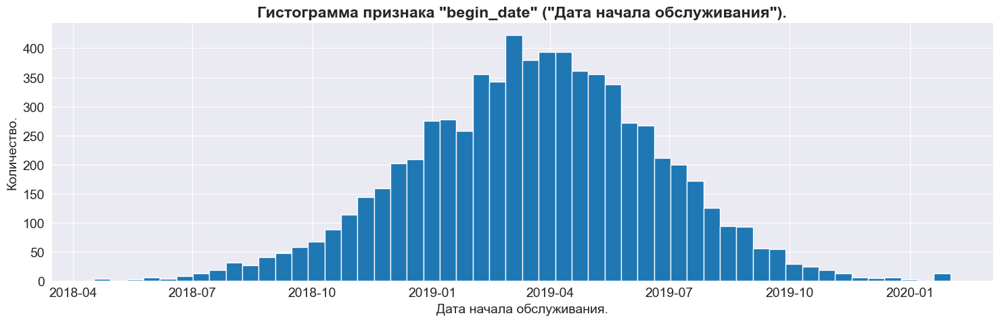

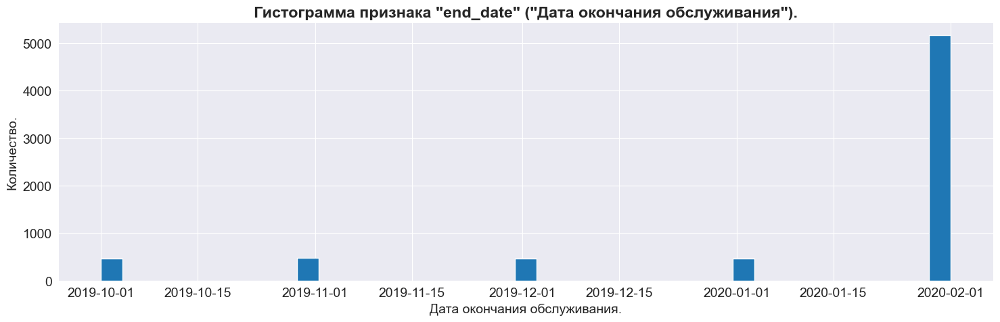

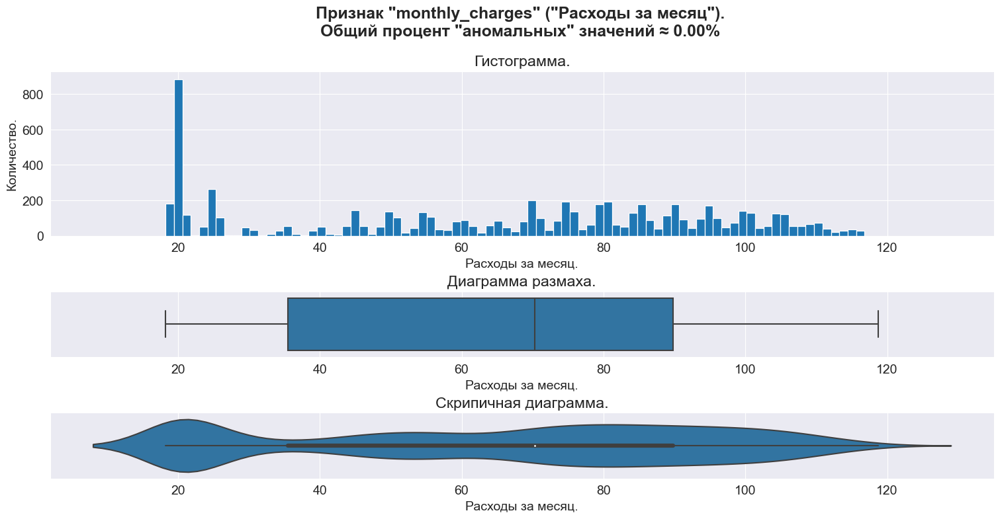

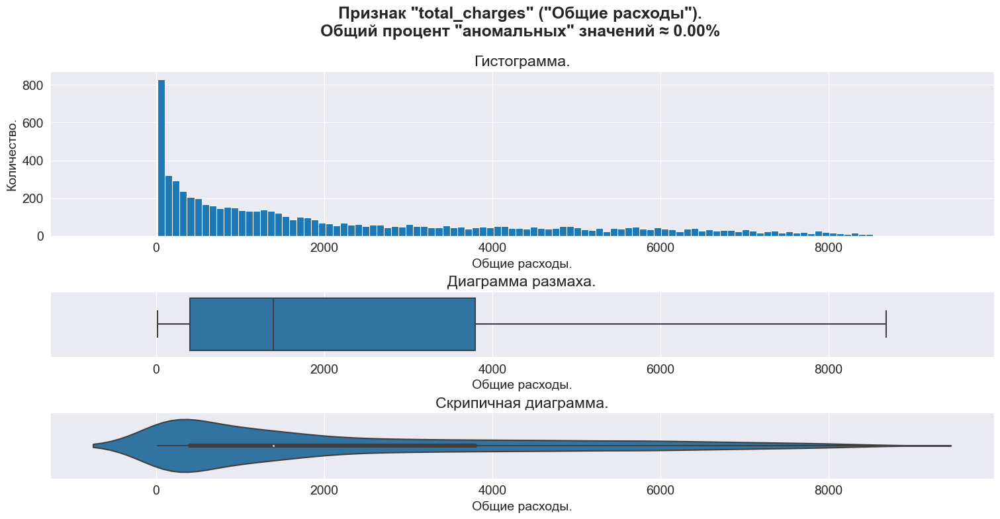

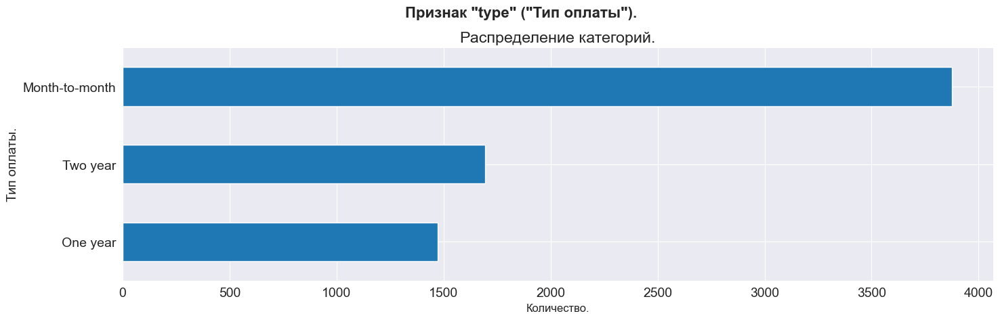

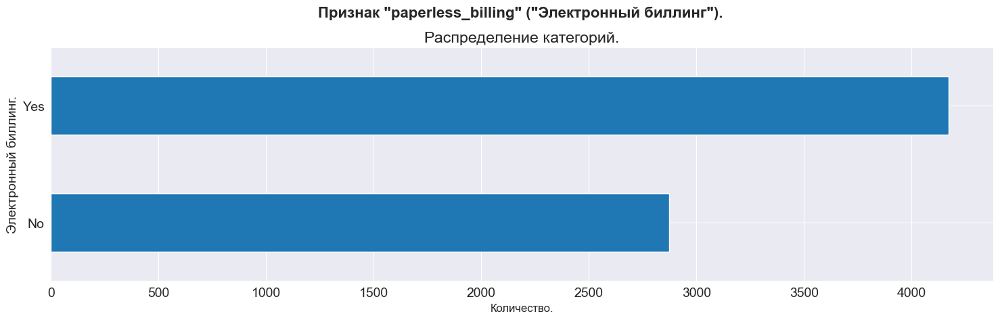

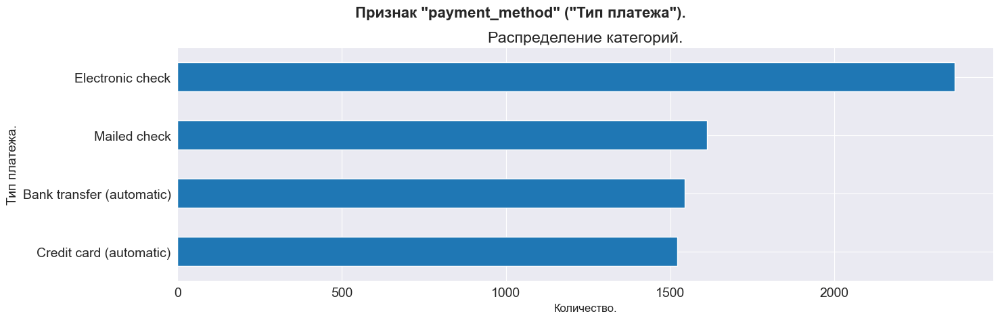

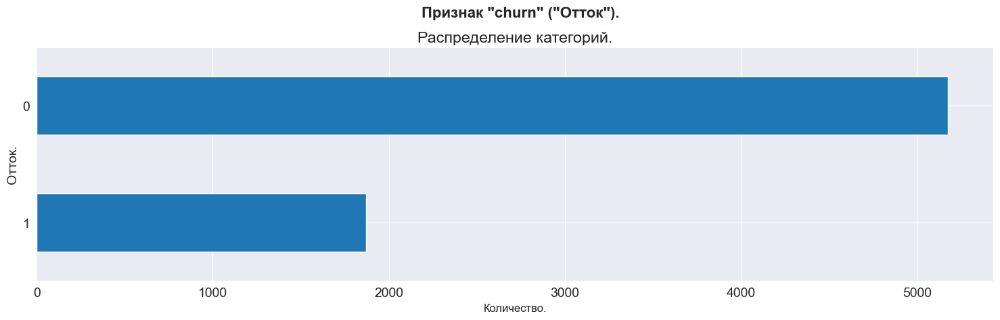



 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 



,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,No,Yes,No
1,5575-GNVDE,Male,No,No,No
2,3668-QPYBK,Male,No,No,No
3,7795-CFOCW,Male,No,No,No
4,9237-HQITU,Female,No,No,No
5,9305-CDSKC,Female,No,No,No
6,1452-KIOVK,Male,No,No,Yes
7,6713-OKOMC,Female,No,No,No
8,7892-POOKP,Female,No,Yes,No
9,6388-TABGU,Male,No,No,Yes


,customer_id,gender,senior_citizen,partner,dependents
Кол-во пропусков:,0,0,0,0,0
Процент пропусков:,0.00%,0.00%,0.00%,0.00%,0.00%
Кол-во дубликатов:,0,7041,7041,7041,7041
Процент дубликатов:,0.00%,99.97%,99.97%,99.97%,99.97%
Кол-во уникальных значений:,7043,2,2,2,2
Кол-во нулевых значений:,0,0,0,0,0


,customer_id,gender,senior_citizen,partner,dependents
Асимметрия распределения:,nan,nan,nan,nan,nan
count,7043,7043,7043,7043,7043
unique,7043,2,2,2,2
top,7590-VHVEG,Male,No,No,No
freq,1,3555,5901,3641,4933




 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   object
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: object(5)
memory usage: 275.2+ KB




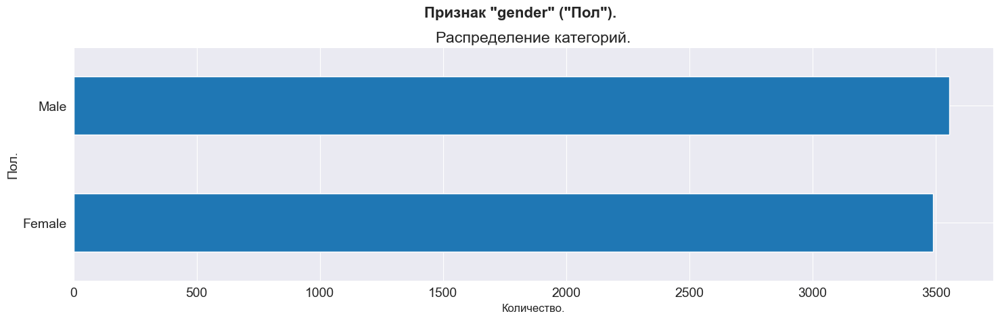

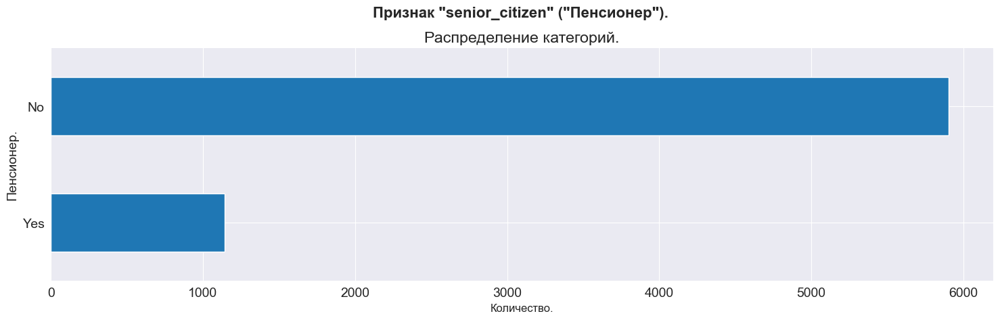

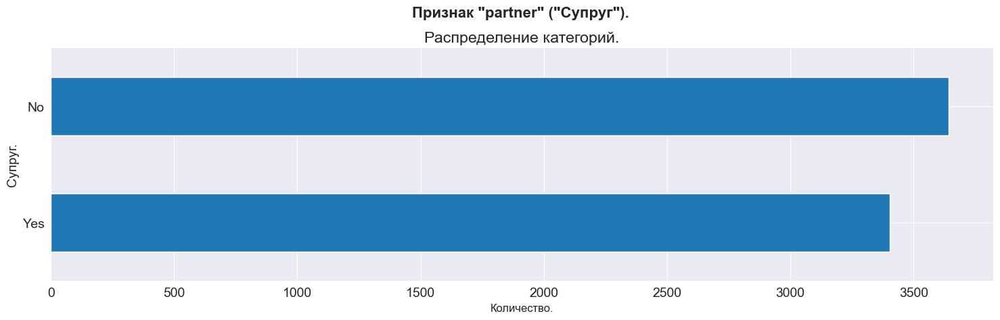

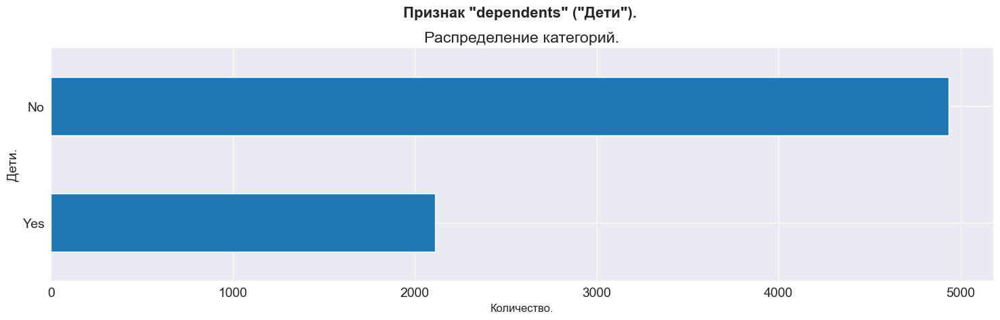



 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 



,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
4,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
5,9237-HQITU,Fiber optic,No,No,No,No,No,No
6,9305-CDSKC,Fiber optic,No,No,Yes,No,Yes,Yes
7,1452-KIOVK,Fiber optic,No,Yes,No,No,Yes,No
8,6713-OKOMC,DSL,Yes,No,No,No,No,No
9,7892-POOKP,Fiber optic,No,No,Yes,Yes,Yes,Yes
10,6388-TABGU,DSL,Yes,Yes,No,No,No,No


,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
Кол-во пропусков:,0,0,0,0,0,0,0,0
Процент пропусков:,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%
Кол-во дубликатов:,0,5515,5515,5515,5515,5515,5515,5515
Процент дубликатов:,0.00%,99.96%,99.96%,99.96%,99.96%,99.96%,99.96%,99.96%
Кол-во уникальных значений:,5517,2,2,2,2,2,2,2
Кол-во нулевых значений:,0,0,0,0,0,0,0,0


,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
Асимметрия распределения:,nan,nan,nan,nan,nan,nan,nan,nan
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785




 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 1 to 5517
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB




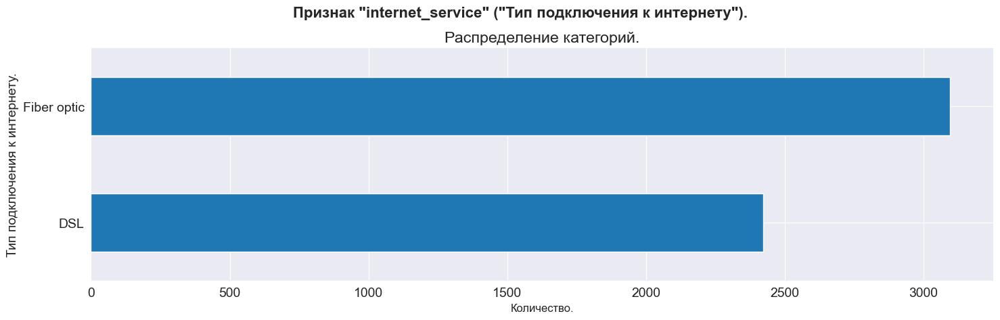

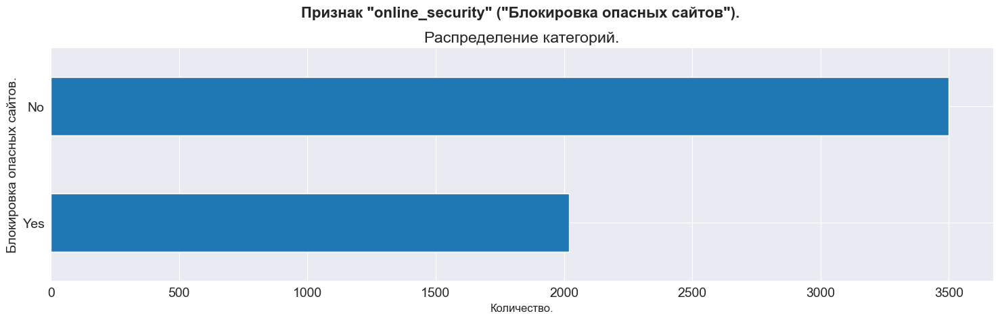

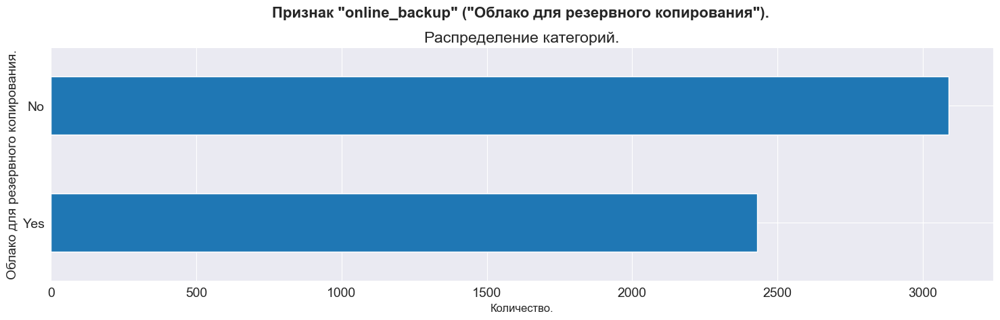

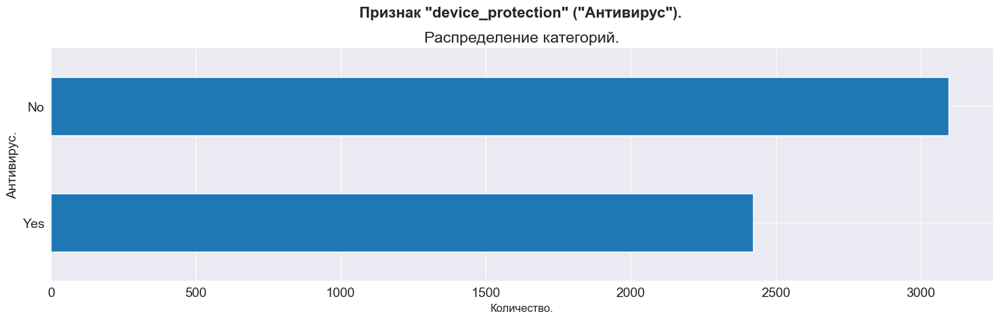

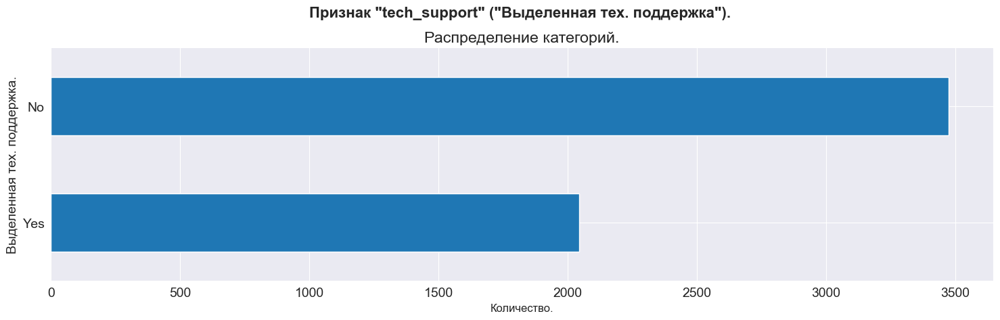

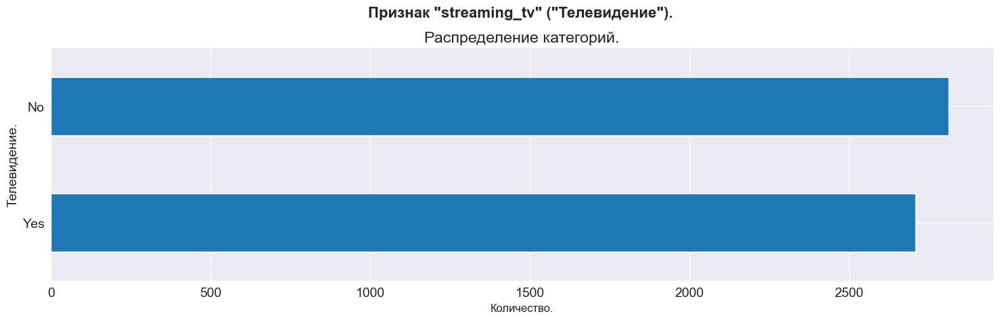

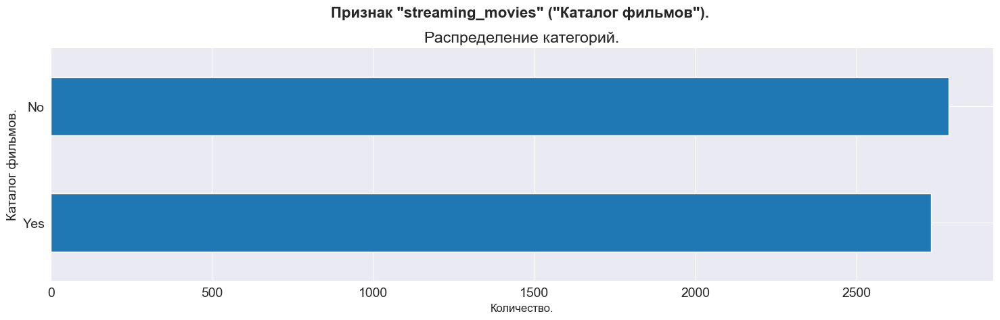



 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 



,customer_id,multiple_lines
1,5575-GNVDE,No
2,3668-QPYBK,No
3,9237-HQITU,No
4,9305-CDSKC,Yes
5,1452-KIOVK,Yes
6,7892-POOKP,Yes
7,6388-TABGU,No
8,9763-GRSKD,No
9,7469-LKBCI,No
10,8091-TTVAX,Yes


,customer_id,multiple_lines
Кол-во пропусков:,0,0
Процент пропусков:,0.00%,0.00%
Кол-во дубликатов:,0,6359
Процент дубликатов:,0.00%,99.97%
Кол-во уникальных значений:,6361,2
Кол-во нулевых значений:,0,0


,customer_id,multiple_lines
Асимметрия распределения:,nan,nan
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390




 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 1 to 6361
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB




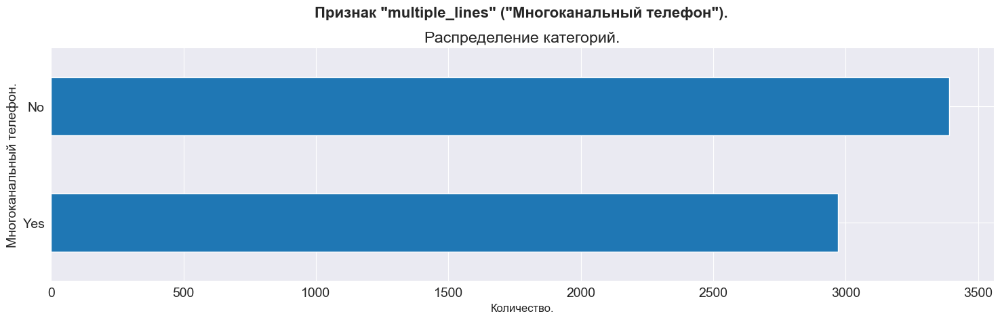



 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 



In [16]:
for df, name in zip([contract, personal, internet, phone],
                    [col_names[name] for name in TABLE_NAMES]):
    get_eda_data(df, name=name)
    get_eda_plots(df, drop=['customer_id'])
    print('\n', '~'*70, '\n')

#### Вывод дополнительной информации.
- Проверим пропуски признака `total_charges` таблицы `contract`.
- Проверим, во всех ли объектах значения `monthly_charges` меньше `total_charges`.

In [17]:
# Проверка пропусков в total_charges.
contract[contract.total_charges.isna()]

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn
0,4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,0
1,3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,0
3,5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,0
6,4367-NUYAO,2020-02-01,2020-02-01,Two year,No,Mailed check,25.75,NaN,0
7,1371-DWPAZ,2020-02-01,2020-02-01,Two year,No,Credit card (automatic),56.05,NaN,0
9,3213-VVOLG,2020-02-01,2020-02-01,Two year,No,Mailed check,25.35,NaN,0
10,2923-ARZLG,2020-02-01,2020-02-01,One year,Yes,Mailed check,19.70,NaN,0
11,2775-SEFEE,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),61.90,NaN,0
4408,7644-OMVMY,2020-02-01,2020-02-01,Two year,No,Mailed check,19.85,NaN,0
5160,2520-SGTTA,2020-02-01,2020-02-01,Two year,No,Mailed check,20.00,NaN,0


In [18]:
# Проверка сумм расходов.
if (sum((contract.total_charges // contract.monthly_charges) >= 0) ==\
    contract.total_charges.notna().sum()):
    print_b('Расходы за месяц меньше общих расходов для всех записей без '+
            'пропусков.')
else:
    print_b('Расходы за месяц более общих расходов для некоторых записей.')

Расходы за месяц меньше общих расходов для всех записей без пропусков.


### Предварительный исследовательский анализ данных. Вывод.

#### Состав данных.
Данные представлены четырьмя таблицами.
- <details open><summary style="cursor: pointer; display: list-item">👆
<b>Таблица `contract` - информация о контрактах:</b><br>
размер таблицы 7043 объектов и 8 столбцов, один из которых является целевым.</summary>

  - `customer_id` - уникальный идентификатор абонента:
    - ключ для объединения таблиц;    
  - `begin_date` - дата начала обслуживания:
    - распределение близко к нормальному, что может быть обусловлено
      - методом сбора данных;
      - накоплением максимального кол-ва абонентов;
      - проблемами, останавливающими новых абонентов;
  - `end_date`- дата окончания обслуживания, основа для создания целевого признака:
    - признак указан в формате даты и имеет пропуски;
    - распределение равномерно;
    - наличие даты означают, что договор расторгнут - искомый положительный класс;
    - пропуски в признаке означает, что договор не расторгнут - отрицательный класс;
    - отток абонентов начался незадого до даты сбора и формирования таблиц (01.10.2019) и равномерен от месяца к месяцу;
    - дата начала оттока клиентов приближенно совпадает с периодом спада кол-ва новых договоров, что может говорить об одной причине двух явлений;
  - `type`- тип контракта:
    - типы контрактов соответствуют описанию;
    - наиболее распространённым является `Month-to-Month` (месячный контракт);
  - `paperless_billing` - электронный чек:
    - электронный чек является основным способом получения счетов;
  - `payment_method` - тип платежа:
    - типы платежей соответствуют описанию;
    - наиболее распространённым является `Electronic check` (электронный чек);
  - `monthly_charges` - ежемесячные расходы:
    - распределение бимодально или мультимодально;
    - наблюдаются скопления значений в районах 20 и 90;
    - необходимо проверить возможность создания признаков, отражающих данные группы;
  - `total_charges` - общие расходы:
    - распределение приближенно экспоненциально;
    - большое количество абонентов с суммой платежей менее 100, что логично: большее кол-во абонентов с меньшей суммой платежей;
    - присутствует 11 пропусков - абонентов, ещё не успевших совершить оплату: данные пропуски необходимо заполнить нулями.
  - `churn` - целевой признак ухода клиента: 
    - 1 - клиент ушёл: даты закрытия договора в наличии;
    - 0 - клиент не ушёл: пропуски в признаке `end_date`.</details><br>


- <details open><summary style="cursor: pointer; display: list-item">👆
<b>Таблица `personal` - информация об абонентах:</b><br>
размер таблицы 7043 объекта и 5 столбцов.</summary>

  - `customer_id` - уникальный идентификатор абонента:
    - ключ для объединения таблиц;
  - `gender` - пол:
    - пол распределён практически поровну;
  - `senior_citizen` - является ли абонент пенсионером:
    - подавляющее большинство абонентов не являются пенсионерами;
  - `partner` - партнер:
    - кол-во абонентов имеющих супругов практически равно кол-ву не имеющих;
  - `dependents` - наличие детей:
    - абонентов, имеющих детей, больше более чем в 2 раза.
</details><br>


- <details open><summary style="cursor: pointer; display: list-item">👆
<b>Таблица `internet` - информация о интернет-услугах:</b><br>
размер таблицы 5517 объекта и 8 столбцов.</summary>

  - данные представлены не по всем абонентам, что, вместе с отсутствием категории типа подключения (`internet_service`) - "нет подключения", означает, что абоненты с идентификаторами, не указанными в данной таблице, не были подключены к интернету;
  - `customer_id` - уникальный идентификатор абонента:
    - ключ для объединения таблиц;
  - `internet_service` - тип подключения к интернету:
    - наиболее распространённым является `Fiber optic` (оптоволокно);
  - `online_security` - блокировка опасных сайтов:
    - две трети аобонентов предпочитают не приобретать данную услугу;
  - `online_backup` - резервное копирование:
    - абонентов, пользующихся данной услугой, меньше других;
  - `device_protection` - антивирус:
    - абонентов, пользующихся данной услугой, меньше других;
  - `tech_support` - выделенная техподдержка:
    - абонентов, пользующихся данной услугой, в два раза меньше других;
  - `streaming_tv` / `streaming_movies` - телевидение / фильмы:
    - приблизительно половина абонентов подключает данные услуги.
</details><br>


- <details open><summary style="cursor: pointer; display: list-item">👆
<b>Таблица `phone` - информация об услугах телефонии:</b><br>
размер таблицы 6361 объекта и 2 столбцов.</summary>

  - абоненты с идентификаторами, не указанными в данной таблице, не были подключены к телефонии;
  - `customer_id` - уникальный идентификатор абонента:
    - ключ для объединения таблиц;
  - `multiple_lines` - несколько линий связи:
    - абонентов, пользующихся данной услугой, ненамного меньше других.
</details><br>


#### Пропуски, дубликаты и аномалии.
  - Помимо упомянутых выше, пропусков в данных не обнаружено.
  - Явных дубликатов в данных не обнаружено.
  - Данные месячных расходов, общих расходов и длительность использования услуг не соответствуют друг-другу, что может быть связано с предоставлением дополнительных услуг или скидок.
  - Помимо упомянутых выше, аномалий в данных не обнаружено.

#### Объединение и заполнение пропусков.
  - До объединения, заполним пропуски в признаке `total_charges` нулями, указав на то, что новый клиент ещё не оплачивал услуги;
  - После объединения таблиц по общему ключу `customer_id`, заполним пропуски, пришедшие из таблиц `internet` и `phone`, значением `No_service`, чтобы отличать эти значения от значений `No`, т.к. клиенты, не вошедшие в эти таблицы не пользовались услугами интернета и телефонии соответственно.

## Объединение данных.

---

- Заполним 11 пропусков значений в столбце `total_charges` в таблице `contract` нулями.
- Объединим данные по общему ключу `customer_id`.
- Заполним пропуски, появившиеся после объединения из таблиц `internet` и `phone`, значением `No_service`.
- Сбросим ключ объединения `customer_id`, который не несёт информации и более не понадобится.

### Заполнение пропусков в таблице `contract`.
- Заполним пропуски в таблице `contract`.
- Проверим результат.

In [19]:
# Удалим пропуски в "contract".
contract.total_charges.fillna(0, inplace=True)

# Проверим результат.
print_b('- Пропусков в признаке "total_charges" таблицы ""contract" после '+
        f'заполнения: {contract.total_charges.isna().sum()}.')
print_b('\n- Информация о таблице "contract".')
contract.info()

- Пропусков в признаке "total_charges" таблицы ""contract" после заполнения: 0.

- Информация о таблице "contract".
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   churn              7043 non-null   int32         
dtypes: datetime64[ns](2), float64(2), int32(1), object(4)
memory usage: 467.8+ KB


### Объединение данных.
- Проверим соответствие значений признаков идентификатора пользователя `customer_id` во всех таблицах.
- Объединим таблицы по ключу `customer_id`, пооочерёдно присоеднинив таблицы `personal`, `internet` и `phone` к `contract`.
- Проверим результат.

#### Проверка соответствия `customer_id`.

- Проверим соответствие значений признака `customer_id` во всех таблицах.<br>
Т.к. таблица `contract` должна содержать все персональные данные и разновидности услуг, проверим вхождение уникальных значений признака `customer_id` во всех таблицах в набор уникальных значений данного признака таблицы `contract`.


In [20]:
# Проверка соответствия ID.
contract_unique = set(contract.customer_id.unique())
for df, name in zip([personal, internet, phone],
                    [name for name in TABLE_NAMES if name != 'contract']):
    id_unique = set(df.customer_id.unique())
    if id_unique.issubset(contract_unique):
        print_b(f'- Все ID клиенто в таблице "{name}" вприсутствуют '+
                'в таблице "contract".')
    else:
        print_b(f'- В таблице "{name}" присутствуют ID клиентов, не '+
                'присутствующие в таблице "contract".')

- Все ID клиенто в таблице "personal" вприсутствуют в таблице "contract".
- Все ID клиенто в таблице "internet" вприсутствуют в таблице "contract".
- Все ID клиенто в таблице "phone" вприсутствуют в таблице "contract".


#####  Проверка соответствия `customer_id`. Вывод.

- Все `customer_id` клиентов в остальных таблицах входят в `customer_id` клиентов в таблице `contract`.
- Присоеденим все таблицы к таблице `contract` по `customer_id`.

#### Функция объединения данных.
Создадим функцию, которая скопирует исходную таблицу, добаит к ней таблицы из заданного списка и вернёт результат.

In [21]:
def merge_df(df_main : pd.DataFrame = contract,
             df_list : list[pd.DataFrame] = [personal, internet, phone],
             on : str = 'customer_id',
             how : str = 'left') -> pd.DataFrame:
    # Создадим копию таблицы.
    df_main = df_main.copy()
    # Объединим таблицы.
    for df in df_list:
        df_main = df_main.merge(df, on=on, how=how)

    return df_main

#### Объединение данных.
- Вызовем функцию и объединим таблицы.
- Проверим результат.

In [22]:
# Объединим таблицы.
df_final = merge_df()

# Проверим результат.
display_s(df_final.head(), 'Объединённая таблица "df_final".')
print_b('\n- Информация об объединённой таблице "df_final".')
df_final.info()
print()

if df_final.customer_id.nunique() == df_final.shape[0]:
    print_b('- Все идентификаторы клиента "customer_id" уникальны.')
else:
    print_b('- Повторяющиеся идентификаторы клиента:')
    display(df_final.customer_id.duplicated())

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
0,4472-LVYGI,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,Yes,Bank transfer (automatic),52.550000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,nan
1,3115-CZMZD,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,20.250000,0.000000,0,Male,No,No,Yes,nan,nan,nan,nan,nan,nan,nan,No
2,3668-QPYBK,2018-08-09 00:00:00,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.850000,108.150000,1,Male,No,No,No,DSL,Yes,Yes,No,No,No,No,No
3,5709-LVOEQ,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,80.850000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No
4,9237-HQITU,2019-01-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.700000,151.650000,1,Female,No,No,No,Fiber optic,No,No,No,No,No,No,No



- Информация об объединённой таблице "df_final".
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   churn              7043 non-null   int32         
 9   gender             7043 non-null   object        
 10  senior_citizen     7043 non-null   object        
 11  partner            7043 non-null   object        
 12  dependents         7043 non-null   object        
 13  internet_serv

#### Объединение данных. Вывод.

- Таблицы объединены.
- Каждому клиенту соответствует одно наблюдение.
- Количество записей без пропусков соответствует количеству записей в оригинальных таблицах.

### Заполнение пропусков.
Заполним пропуски в объединённом датафрейме по определённой ранее стратегии: значением `No_service` для всех пропусков, появившихся в результате объединения из добавленных таблиц.

In [23]:
# Заполним пропуски.
df_final.loc[:, df_final.columns != 'end_date'] = \
df_final.loc[:, df_final.columns != 'end_date'].fillna('No_service')

# Проверим результат.
display_s(df_final.head(), name='Объединённый датафрейм')
print_b('\n- Инфмормация о датафрейме:')
df_final.info()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
0,4472-LVYGI,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,Yes,Bank transfer (automatic),52.550000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,No_service
1,3115-CZMZD,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,20.250000,0.000000,0,Male,No,No,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,No
2,3668-QPYBK,2018-08-09 00:00:00,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.850000,108.150000,1,Male,No,No,No,DSL,Yes,Yes,No,No,No,No,No
3,5709-LVOEQ,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,80.850000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No
4,9237-HQITU,2019-01-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.700000,151.650000,1,Female,No,No,No,Fiber optic,No,No,No,No,No,No,No



- Инфмормация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   churn              7043 non-null   int32         
 9   gender             7043 non-null   object        
 10  senior_citizen     7043 non-null   object        
 11  partner            7043 non-null   object        
 12  dependents         7043 non-null   object        
 13  internet_service   7043 non-null  

### Удаления ключа объединения `customer_id`.

In [24]:
df_final.drop(columns=['customer_id'], inplace=True)
print_b('Информация о датафрейме после удаления "customer_id":')
df_final.info()

Информация о датафрейме после удаления "customer_id":
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   begin_date         7043 non-null   datetime64[ns]
 1   end_date           7043 non-null   datetime64[ns]
 2   type               7043 non-null   object        
 3   paperless_billing  7043 non-null   object        
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_charges      7043 non-null   float64       
 7   churn              7043 non-null   int32         
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   object        
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   7043 non-null   object        
 13  online_se

###  Объединение данных. Вывод.
- Данные успешно объединены в один датафрейм по ключу `customer_id`.
- Пропуски привнесённые присоединёнными таблицами заполнены значением `No_service`.
- Удалён столбец `customer_id`, который более не понадобится.

## Создание признаков.


- Создадим признаки:
  - `tenure` - длительность обслуживания в днях, т.к. более длительные отношения с клиентом могут снижать вероятность оттока;
  
  - `tenure_month` - временный признак длительности обслуживания в месяцах для вычисления общих расходов по месяцам;
  - `tenure_left` - количество дней до возможости перезаключения контракта на тех же условиях периодичности оплаты (или кол-во дней после окончания контракта до отчётного периода с той же периодичностью);
  - `num_services` - количество услуг кроме телефонии, приобретённых клиентом, т.к. клиенты с бо́льшим числом услуг могут быть надёжнее (значение `0` соответствует приобретениею клиентом только телефонии без каких-либо дополнительных услуг);
  - `total_charges_per_month` - признак общих расходов, взвешенных по длительности контракта в месяцах;
  - `total_by_monthly` - признак отношения общих расходов к месячным для освещения разделения сумм платежей;
  - `type_paperless_payment` - признак совмещённых типов контракта и оплаты и электронного биллинга;
  - `type_paperless_payment_monthly` - cредний расход по совмещённым типам контракта и оплаты и электронного биллинга для освещения разделения сумм месячных платежей;
  - `monthly_charges_per_internet_service` - cредний расход по типу интернета. <br>
  
  
- Удалим временный признак `tenure_month`, который дублирует длительность в днях и более не понадобится.


- Также при создании кодировщика признаков в <a href="#Функция-формирования-трансформеров-данных.">разделе формирования трансформеров данных</a>, если основное кодирование - порядковое, закодируем признаки `internet_service` и `payment_method` прямым кодированием, чтобы выделить основные категории: `Fiber optic` и `Electronic check` соответственно.

In [25]:
# Добавим признаки.
all_services = ['internet_service', 'online_security', 'online_backup', 
                'device_protection', 'tech_support','streaming_tv', 
                'streaming_movies', 'multiple_lines']

# Признак длительности контракта в днях.
df_final['tenure'] = (df_final.end_date - df_final.begin_date).dt.days
# Временный признак длительности контракта в месяцах.
df_final['tenure_month'] = (
    df_final.end_date.dt.to_period('M').view(dtype='int64') -\
    df_final.begin_date.dt.to_period('M').view(dtype='int64')
    )

# Признак кол-ва дней до перезаключения контракта после его окончания.
def get_type_in_days(row):
    if row == 'Month-to-month':
        return 30
    elif row == 'One year':
        return 365
    elif row == 'Two year':
        return 730
df_final['tenure_left'] = (df_final.tenure -\
                           (df_final.tenure //\
                            df_final.type.apply(get_type_in_days)))

# Признак количества услуг.
df_final['num_services'] = (df_final[all_services]
                            .replace({'Yes': 1, 
                                      'No_service': 0,
                                      'No': 0}).sum(axis=1))

# Общие расходы, взвешенные по длительности контракта в месяцах.
df_final['total_charges_per_month'] = np.where(
    df_final.tenure != 0,
    df_final.total_charges / df_final.tenure_month,
    df_final.total_charges
)

# Отношение общих расходов к месячным.
df_final['total_by_monthly'] = (
    df_final['total_charges'] / df_final['monthly_charges']
)

# Совмещённые типы счетов и оплаты.
df_final['type_paperless_payment'] = (df_final.type + '_' +\
                                      df_final.paperless_billing +\
                                      '_' + df_final.payment_method)

# Средний расход по типу оплаты и счета.
df_final['type_paperless_payment_monthly'] = round(
    df_final
    .groupby('type_paperless_payment')['monthly_charges']
    .transform('mean')
)

# Средний расход по типу интернета.
df_final['monthly_charges_per_internet_service'] = round(
    df_final
    .groupby('internet_service')['monthly_charges']
    .transform('mean')
)

# Удалим временный признак 'tenure_month'.
df_final.drop('tenure_month', axis=1, inplace=True)

# Проверим результат.
display_s(df_final.head(), name='Объединённый датафрейм')
print_b('\n- Информация о датафрейме:')
df_final.info()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,tenure,tenure_left,num_services,total_charges_per_month,total_by_monthly,type_paperless_payment,type_paperless_payment_monthly,monthly_charges_per_internet_service
0,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,Yes,Bank transfer (automatic),52.550000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,No_service,0,0,4,0.000000,0.000000,Two year_Yes_Bank transfer (automatic),76.000000,58.000000
1,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,20.250000,0.000000,0,Male,No,No,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,No,0,0,0,0.000000,0.000000,Two year_No_Mailed check,35.000000,21.000000
2,2018-08-09 00:00:00,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.850000,108.150000,1,Male,No,No,No,DSL,Yes,Yes,No,No,No,No,No,479,464,2,6.759375,2.008357,Month-to-month_Yes_Mailed check,54.000000,58.000000
3,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,80.850000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No,0,0,5,0.000000,0.000000,Two year_No_Mailed check,35.000000,58.000000
4,2019-01-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.700000,151.650000,1,Female,No,No,No,Fiber optic,No,No,No,No,No,No,No,279,270,0,15.165000,2.144979,Month-to-month_Yes_Electronic check,78.000000,92.000000



- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   begin_date                            7043 non-null   datetime64[ns]
 1   end_date                              7043 non-null   datetime64[ns]
 2   type                                  7043 non-null   object        
 3   paperless_billing                     7043 non-null   object        
 4   payment_method                        7043 non-null   object        
 5   monthly_charges                       7043 non-null   float64       
 6   total_charges                         7043 non-null   float64       
 7   churn                                 7043 non-null   int32         
 8   gender                                7043 non-null   object        
 9   senior_citizen                        7043 non

### Создание  новых признаков. Вывод.
- Создано 9 новых признаков.
- Перейдём к их анализу.

## Исследовательский анализ объединённого датафрейма.

- Вызовем функции и выведем данные и графики по объединённому датафрейму.

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,tenure,tenure_left,num_services,total_charges_per_month,total_by_monthly,type_paperless_payment,type_paperless_payment_monthly,monthly_charges_per_internet_service
0,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,Yes,Bank transfer (automatic),52.550000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,No_service,0,0,4,0.000000,0.000000,Two year_Yes_Bank transfer (automatic),76.000000,58.000000
1,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,20.250000,0.000000,0,Male,No,No,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,No,0,0,0,0.000000,0.000000,Two year_No_Mailed check,35.000000,21.000000
2,2018-08-09 00:00:00,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.850000,108.150000,1,Male,No,No,No,DSL,Yes,Yes,No,No,No,No,No,479,464,2,6.759375,2.008357,Month-to-month_Yes_Mailed check,54.000000,58.000000
3,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,80.850000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No,0,0,5,0.000000,0.000000,Two year_No_Mailed check,35.000000,58.000000
4,2019-01-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.700000,151.650000,1,Female,No,No,No,Fiber optic,No,No,No,No,No,No,No,279,270,0,15.165000,2.144979,Month-to-month_Yes_Electronic check,78.000000,92.000000
5,2018-12-26 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,99.650000,820.500000,1,Female,No,No,No,Fiber optic,No,No,Yes,No,Yes,Yes,Yes,310,300,4,74.590909,8.233818,Month-to-month_Yes_Electronic check,78.000000,92.000000
6,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,25.750000,0.000000,0,Male,No,Yes,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,Yes,0,0,1,0.000000,0.000000,Two year_No_Mailed check,35.000000,21.000000
7,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Credit card (automatic),56.050000,0.000000,0,Female,No,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,No,No_service,0,0,5,0.000000,0.000000,Two year_No_Credit card (automatic),54.000000,58.000000
8,2019-04-27 00:00:00,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,104.800000,3046.050000,1,Female,No,Yes,No,Fiber optic,No,No,Yes,Yes,Yes,Yes,Yes,188,182,5,435.150000,29.065363,Month-to-month_Yes_Electronic check,78.000000,92.000000
9,2020-02-01 00:00:00,2020-02-01 00:00:00,Two year,No,Mailed check,25.350000,0.000000,0,Male,No,Yes,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,Yes,0,0,1,0.000000,0.000000,Two year_No_Mailed check,35.000000,21.000000


,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,tenure,tenure_left,num_services,total_charges_per_month,total_by_monthly,type_paperless_payment,type_paperless_payment_monthly,monthly_charges_per_internet_service
Кол-во пропусков:,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Процент пропусков:,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%
Кол-во дубликатов:,6528,7038,7040,7041,7039,5458,512,7041,7041,7041,7041,7041,7040,7040,7040,7040,7040,7040,7040,7040,6567,6571,7035,120,622,7019,7026,7040
Процент дубликатов:,92.69%,99.93%,99.96%,99.97%,99.94%,77.50%,7.27%,99.97%,99.97%,99.97%,99.97%,99.97%,99.96%,99.96%,99.96%,99.96%,99.96%,99.96%,99.96%,99.96%,93.24%,93.30%,99.89%,1.70%,8.83%,99.66%,99.76%,99.96%
Кол-во уникальных значений:,515,5,3,2,4,1585,6531,2,2,2,2,2,3,3,3,3,3,3,3,3,476,472,8,6923,6421,24,17,3
Кол-во нулевых значений:,0,0,0,0,0,0,11,5174,0,0,0,0,0,0,0,0,0,0,0,0,11,11,1667,11,11,0,0,0


,monthly_charges,total_charges,churn,tenure,tenure_left,num_services,total_charges_per_month,total_by_monthly,type_paperless_payment_monthly,monthly_charges_per_internet_service,begin_date,end_date,type,paperless_billing,payment_method,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,type_paperless_payment
Асимметрия распределения:,-0.22,0.96,1.06,-0.03,-0.02,0.41,2.73,0.25,-0.57,-0.47,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
count,7043.00,7043.00,7043.00,7043.00,7043.00,7043.00,7043.00,7043.00,7043.00,7043.00,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,515,5,3,2,4,2,2,2,2,3,3,3,3,3,3,3,3,24
top,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,2019-03-24 00:00:00,2020-02-01 00:00:00,Month-to-month,Yes,Electronic check,Male,No,No,No,Fiber optic,No,No,No,No,No,No,No,Month-to-month_Yes_Electronic check
freq,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,43,5174,3875,4171,2365,3555,5901,3641,4933,3096,3498,3088,3095,3473,2810,2785,3390,1397
first,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,2018-04-17 00:00:00,2019-10-01 00:00:00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
last,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,2020-02-01 00:00:00,2020-02-01 00:00:00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
mean,64.76,2279.73,0.27,297.38,292.14,2.46,246.07,32.37,64.88,64.93,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
std,30.09,2266.79,0.44,83.87,82.40,2.05,287.02,24.60,14.77,27.51,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
min,18.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,35.00,21.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan




 
 Информация о составе датафрейма. 
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   begin_date                            7043 non-null   datetime64[ns]
 1   end_date                              7043 non-null   datetime64[ns]
 2   type                                  7043 non-null   object        
 3   paperless_billing                     7043 non-null   object        
 4   payment_method                        7043 non-null   object        
 5   monthly_charges                       7043 non-null   float64       
 6   total_charges                         7043 non-null   float64       
 7   churn                                 7043 non-null   int32         
 8   gender                                7043 non-null   object        
 9   senior_citizen                     

,Положительный класс в %. (Клиент ушёл),Отрицательный класс в %. (Клиент не ушёл),Уникальные значения.
Значение:,26.5%,73.5%,"0, 1"


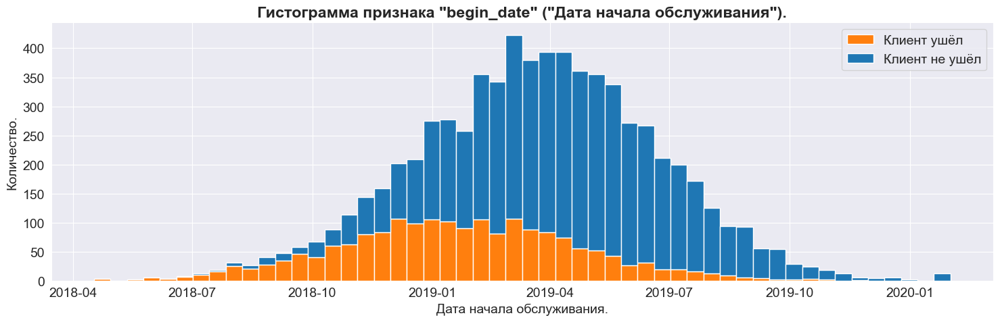

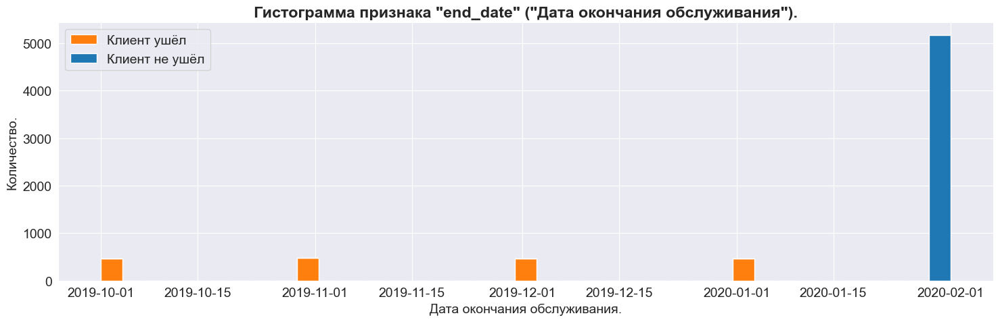

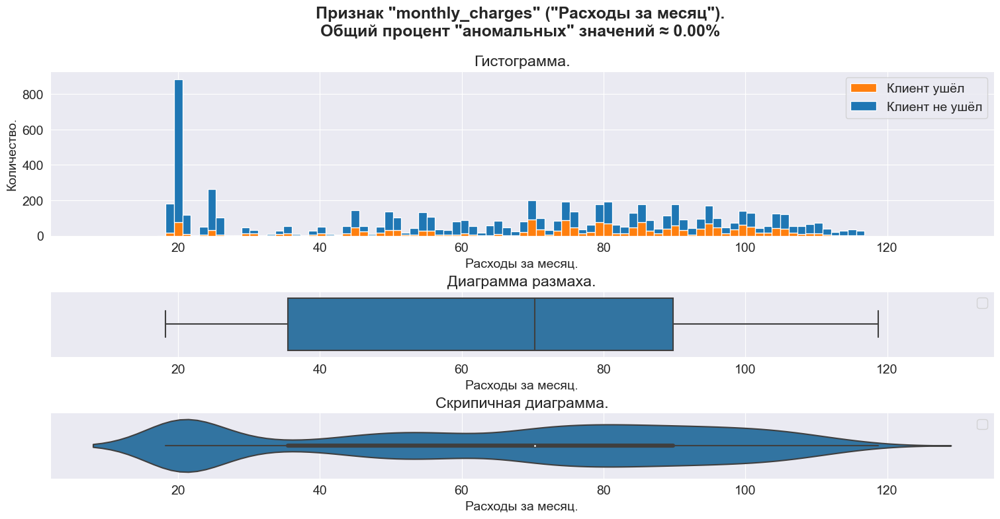

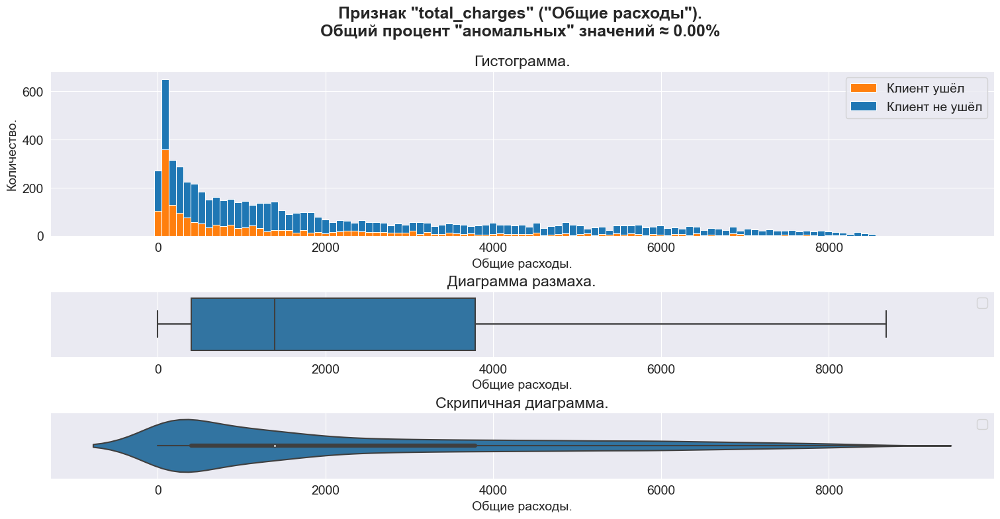

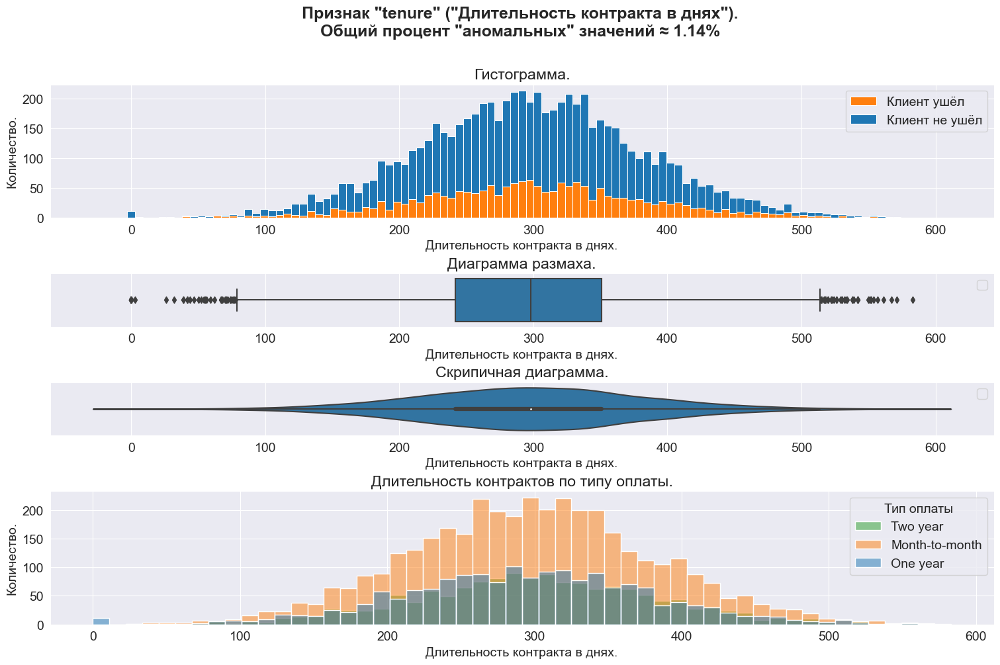

...

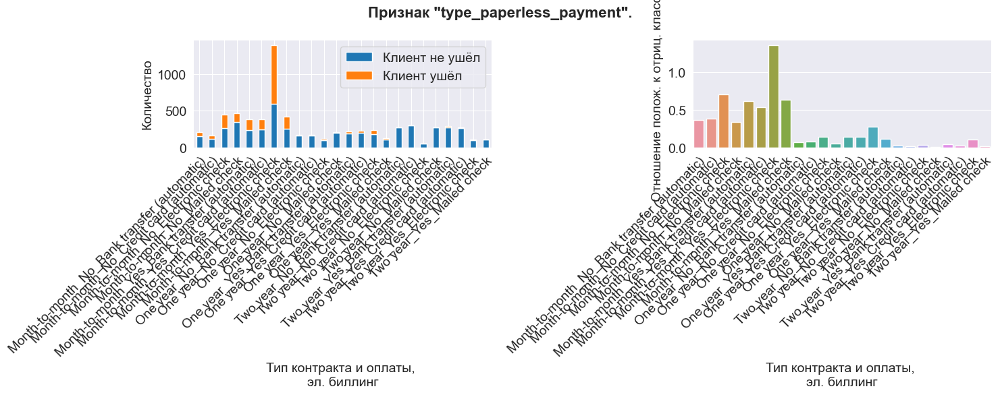

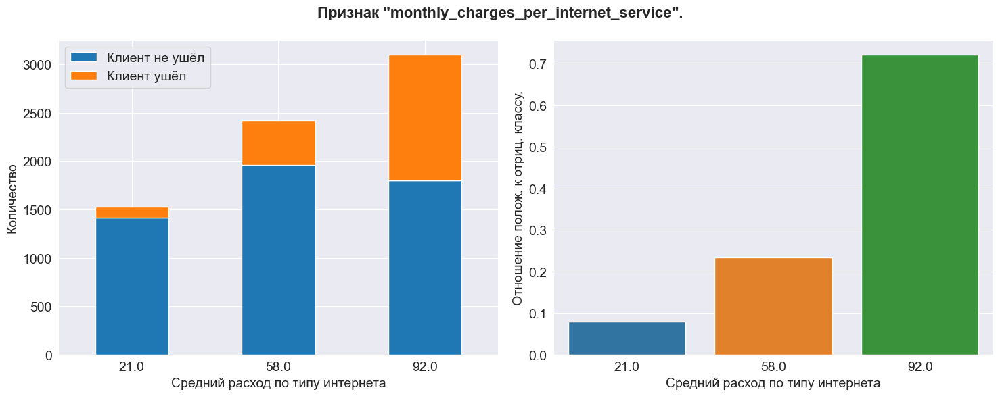

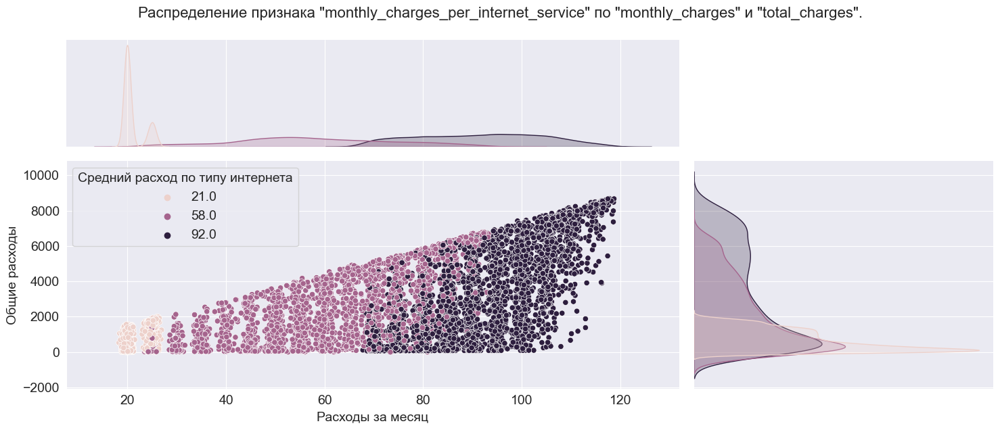

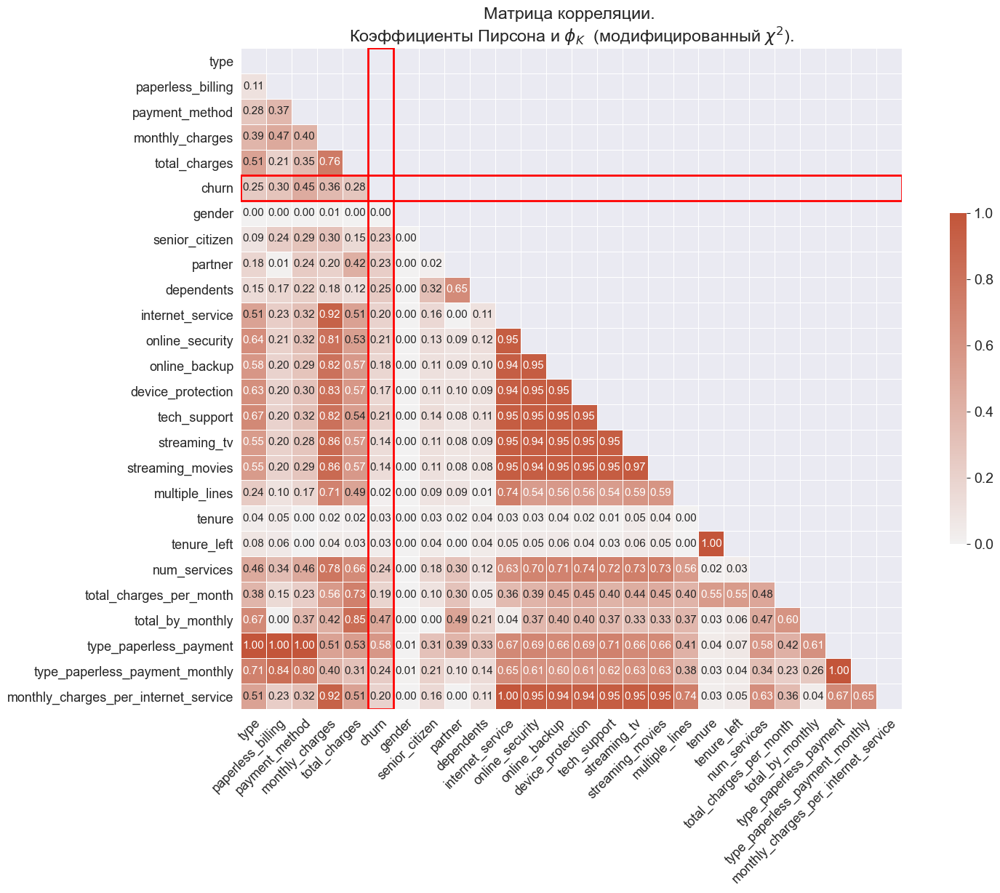

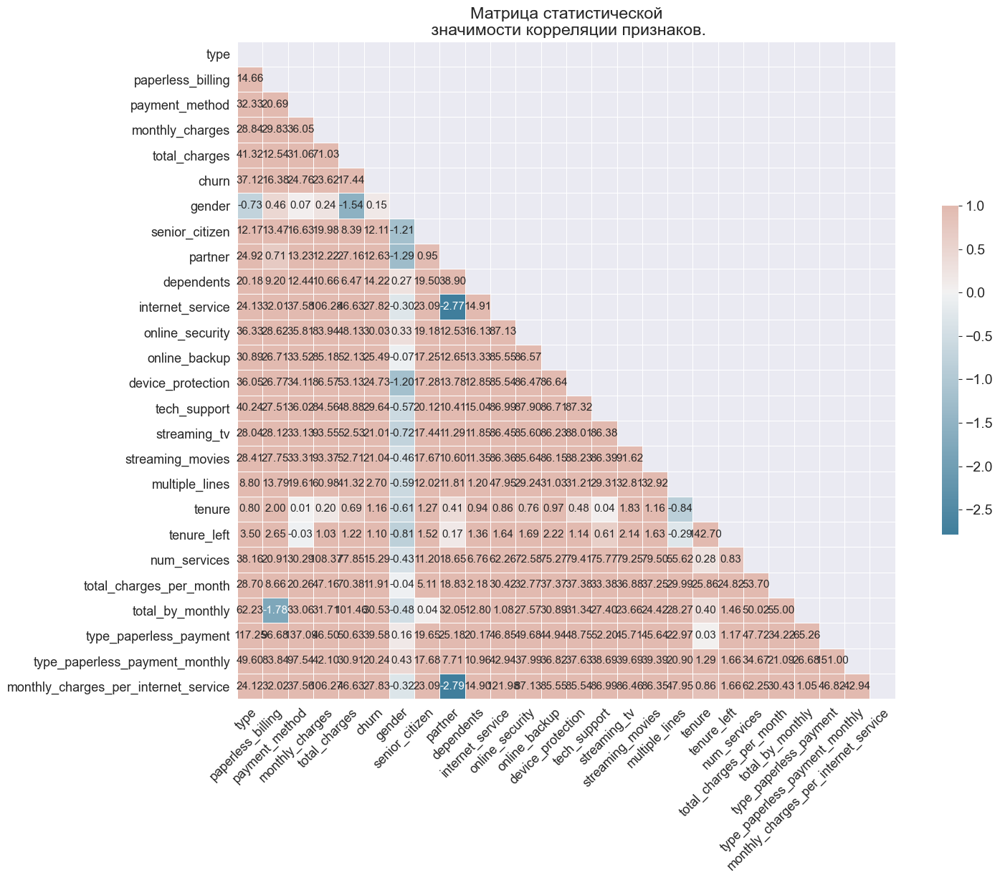

In [26]:
# Выведем данные.
get_eda_data(data=df_final, target=TARGET, name='Объединённый датафрейм')
# Выведем графики.
get_eda_plots(data=df_final, target=TARGET,
              jointplot_list=['monthly_charges', 'total_charges'])

# Выведем корреляционную матрицу.
get_phik_data(
    df_final.drop(columns=['begin_date', 'end_date']), 
    num_values_nunique_min=11, 
    significance=True, 
    annot_size=11
)

### Исследовательский анализ объединённого датафрейма.

#### Задача моделирования.
- __Так как целевой признак определён и бинарен, задача моделирования сводится к бинарной классификации, обучению с учителем.__

#### Состав данных.

- Размер объединённого датафрейма с вновь созданными признаками: 7043 объектов и 29 признаков, один из которых, `churn`, является целевым. <br><br>

#### Целевой признак.
- Целевой признак `churn` - бинарный.
- Классы несбалансированы, в связи с этим проведём разделение выборок со стратификацией и укажем балансировку классов как гиперпараметр.

<details open><summary style="cursor: pointer; display: list-item">
<h4>👆 Анализ признаков.</h4></summary>

  - `begin_date` и `end_date` - дата начала и окончания обслуживания:
    - распределение начала обслуживания ушедших абонентов повторяет общий рисунок со сдвигом на три месяца влево;
    - возможные причины приблизительной нормальности распределения: специфика сбора данных и явление, оказавшее влияние на снижение количества заключаемых контрактов и начало оттока 01.10.2019;
    - также, возможной причиной является синтетическая природа данных;
    - признаки будут удалены во избежание утечки данных;
  - `monthly_charges` - ежемесячные расходы:
    - распределение би- или мультимодально;
    - чаще уходят клиенты с большей суммой месячных платежей;
  - `total_charges` - общие расходы:
    - распределение приближенно экспоненциально;
    - клиенты с меньшей суммой общих платежей уходят чуть чаще, что может говорить об их меньшей вовлеченности;
  - `tenure` - длительность договора в днях:
    - распределение приближенно нормально;
    - количество выбросов незначительно;
    - распределение длительности договоров для целевых групп практически 
	одинаково;
    - эффективности признаку добавляет разделение одно- и двухгодичных контрактов против месячных контрактов, которых гораздо больше;
  - `tenure_left` - дней после окончания контракта до отчётного периода:
    - признак распределён аналогично длительности контракта;
  - `total_charges_per_month` - общие расходы по месяцам:
    - признак распределён приближенно экспоненциально;
	- картина ухода повторяет рисунок `toal_charges`;
  - `total_by_monthly` - отношение общих расходов к расходам по месяцам:
    - признак освещает разделение групп абонентов по суммам платежей;
	- чаще уходят клиенты с меньшим соотношением;
  - `type_paperless_payment_monthly` - признак связан с `type_paperless_payment` и призван, чтобы описать группы месячных платежей;  
  - `type`- тип контракта:
    - наиболее распространённый контракт - `Month-to-Month` (месячный контракт), одновременно имеет наибольший отток;
    - наименьший отток у двухгодичных контрактов;
  - `paperless_billing` - электронный счёт:
    - тип чека с наименьшим оттоком - бумажный, что может говорить о  большей консервативности клиентов с таким типом чека и меньшей склонности к смене провайдера;
  - `payment_method` - тип платежа:
    - наименьший отток, как ни странно, наблюдается у клиентов платящих кредитной картой;
    - наибольший - у наиболее распространённого типа платежа - электронный чек;
  - `gender` - пол:
    - пол не влияет на отток;
  - `senior_citizen` - пенсионер:
    - пенсионеры в относительных величинах уходят чаще и их количество не велико;
  - `partner` - наличие супруга:
    - наличие супруга снижает отток почти вдвое в относительных величинах;
  - `dependents` - наличие детей:
    - наличие детей так же снижает отток вдвое в относительных величинах, но клиентов имеющих детей более чем в 2 раза меньше;
  - `internet_service` - интернет:
    - клиенты, использующие оптоволокно, больше всего уходят, но и больше всего платят, как помесячно так и в общем, и составляют самую многочисленную группу;
    - признаки услуг, связанных с интернетом, отражают группы в мультимодальном распределении месячных платежей (`monthly_charges`);
    - возможно введение специальных предложений и программ скидок для клиентов с оптоволоконами;
    - клиенты, не пользующиеся услугами интернета, уходят реже всего;
  - `online_security` - блокировка опасных сайтов:
    - клиенты, пользующиеся защитой, уходят меньше, но платят в общем больше;
    - возможно проведение маркетнговых мероприятий для увеличения интереса клиентов к защите;
  - `online_backup` - резервное копирование:
    - ситуация аналогична предыдущей: клиенты пользующиеся резервным копированием, уходят меньше, но платят в общем больше;
  - `device_protection` / `tech_support` - антивирус:
    - аналогично `online_security` и `online_backup`;
  - `streaming_tv` / `streaming_movies` - телевидение и каталог фильмов:
    - относительные показатели оттока практически одинаковы, но клиенты, пользующиеся услугами стриминга видео, платят заметно больше;
  - `multiple_lines` - многканальная связь:
    - относительные велчины оттока практически одинаковы, а абсолбтные показывают, что клиенты, использующие многоканальную связь, уходят чаще;
  - `num_services` - количество услуг:
    - наибольшее количество надёжных клиентов не покупают дополнительные услуги;
    - для количества доп. услуг более 2 с увеличением кол-ва услуг уменьшается вероятность оттока, что подтверждает необходимость рекомендации направить маркетинговые усилия на продвижение дополнительных услуг;
  - `type_paperless_payment` - признак совмещённых типа платежа и счёта и оплаты:
    - чаще всего уходят абоненты с месячной оплатой, электронным счётом и оплачивающие электронным чеком;
  - `monthly_charges_per_internet_service` - средний расход по категории подключения к интернету (признак дополняет `internet_service`).
  
</details><br>

#### Корреляционный анализ.
- За высокую корреляцию возьмём коеффициент корреляции от  $0.8$ и выше.
- Мультиколлинеарные количественные признаки к удалению для линейных моделей при более низкой корреляции с целевым по сравнению с парным:

|Удаляемый признак:|Остающийся признак:|
|:--|:--|
|`monthly_charges_per_internet_service`|`monthly_charges`|
|`total_charges`|`total_by_monthly`, `monthly_charges`|
|`tenure_left`|`tenure`|

- Признаки к удалению с низкой корреляцией с целевым:
  - `gender`, т.к. имееет нулевую корреляцию с целевым признаком;
  - `multiple_lines`, т.к. имееет практически нулевую корреляцию с целевым признаком.

#### Пропуски, дубликаты и аномалии.
  - Пропуски в объединённом датафрейме обработаны и отсутствуют.
  - Явных дубликатов в объединённом датафрейме не обнаружено.
  - Аномалии в объединённом датафрейме не обнаружены.

#### Формат и масштаб данных.
  - Все строковые признаки необходимо закодировать.
  - Т.к. деревянные алгоритмы не чувствительны к масштабу значений, воспользуемся 
    - методом порядкового кодирования `OrdinalEncoder` библиотекки __Scikit-Learn__ для бинарных категориальных признаков, 
    - `CatBoostEncoder` - модификацию целевого кодирования - для многклассовых признаков 
    -  и приведём масштаб количественных методом`RobustScaler`, для нейронной сети и моделей, измеряющих расстояние..

#### Рекомендации заказчику.
- Рекомендуем заказчику сконцентрировать маркетинговые усилия на услугах, сопровождающих подключение к интернет и стриминг-услугам:
  - `internet_service`, `online_security`, `online_backup`, `device_protection`, `tech_support`,
  - `streaming_tv`, `streaming_movies`.

In [27]:
# Удалим столбцы begin_date и end_date.
df_final.drop(columns=['begin_date', 'end_date', 'gender', 'multiple_lines'],
              inplace=True)
display_s(df_final.head(), name='Объединённый датафрейм.')
print_b('\n- Информация о датафрейме:')
df_final.info()

,type,paperless_billing,payment_method,monthly_charges,total_charges,churn,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,tenure,tenure_left,num_services,total_charges_per_month,total_by_monthly,type_paperless_payment,type_paperless_payment_monthly,monthly_charges_per_internet_service
0,Two year,Yes,Bank transfer (automatic),52.550000,0.000000,0,No,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,0,0,4,0.000000,0.000000,Two year_Yes_Bank transfer (automatic),76.000000,58.000000
1,Two year,No,Mailed check,20.250000,0.000000,0,No,No,Yes,No_service,No_service,No_service,No_service,No_service,No_service,No_service,0,0,0,0.000000,0.000000,Two year_No_Mailed check,35.000000,21.000000
2,Month-to-month,Yes,Mailed check,53.850000,108.150000,1,No,No,No,DSL,Yes,Yes,No,No,No,No,479,464,2,6.759375,2.008357,Month-to-month_Yes_Mailed check,54.000000,58.000000
3,Two year,No,Mailed check,80.850000,0.000000,0,No,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,0,0,5,0.000000,0.000000,Two year_No_Mailed check,35.000000,58.000000
4,Month-to-month,Yes,Electronic check,70.700000,151.650000,1,No,No,No,Fiber optic,No,No,No,No,No,No,279,270,0,15.165000,2.144979,Month-to-month_Yes_Electronic check,78.000000,92.000000



- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   type                                  7043 non-null   object 
 1   paperless_billing                     7043 non-null   object 
 2   payment_method                        7043 non-null   object 
 3   monthly_charges                       7043 non-null   float64
 4   total_charges                         7043 non-null   float64
 5   churn                                 7043 non-null   int32  
 6   senior_citizen                        7043 non-null   object 
 7   partner                               7043 non-null   object 
 8   dependents                            7043 non-null   object 
 9   internet_service                      7043 non-null   object 
 10  online_security                       7043 non-null   ob

### Удаление признаков. Вывод.

Финальный набор для обучения - 23 признака и целевой.

## Разделение данных на обучающую и тестовую выборки.

---

- Создадим функцию разделения данных на обучающую и тестовую выборки.
- Разделим выборки на обучающую и тестовую со стратификацией.
- Проверим  результат.

### Вспомогательные функции.

#### Функция выделения выборок со стратификацией.
- Функция примет на вход
  - выборку;
  - доли для разделения;
  - название признака для стратификации;
  - опциональные параметры.
- Функция выделит выборки со стратификацией.
- Функция вернёт обучающую, тестовую и, опционально, валидационную валидационную выборки.

In [28]:
def tts(df : pd.DataFrame,
        target : Union[str, pd.Series] = TARGET,
        test_size : float = TEST_SIZE,
        val_size : Optional[float] = None,
        seed : any = SEED,
        stratify_by : str = TARGET,
        verbose : int = 0
       ) -> tuple[pd.DataFrame, pd.Series, pd.DataFrame, pd.Series]:

    # Разделим данные.
    if isinstance(target, str):
        _X = df.drop(target, axis=1)
        y = df[target]
        target_name = target

    elif isinstance(target, pd.Series):
        _X = df
        y = target
        target_name = target.name

    # Создадим обучающую и тестовую выборки.
    stratify = y if stratify_by == target_name else df[stratify_by]
    (X_train, X_test,
     y_train, y_test) = train_test_split(_X, y, test_size = .25,
                                         random_state = seed,
                                         stratify = stratify)

    if val_size:
        # Выделим и выведем размерности валидационной выборки.
        stratify = y_train if stratify_by == target_name else X_train[stratify_by]
        (X_train, X_val,
         y_train, y_val) = train_test_split(
             X_train, y_train,
             test_size = (val_size/(1-test_size)),
             random_state = seed,
             stratify = stratify
             )

    # Выведем информацию о разделении.
    print_v(verbose,1, 'Разделение выборок.\n- Оригинальное соотношение '+
            'классов:')
    if verbose > 0: display(round(y.value_counts(normalize=True), 2))
    print_v(verbose,1,'~' * 50)
    print_v(verbose,1, '- Размерность обучающей выборки: \n'+
          f'  Предикторы: {X_train.shape};'+
          f'  Целевой признак: {y_train.shape};'+
          f'  Процент от общей: {X_train.shape[0] / df.shape[0]:.2%};'+
              f'\n  Соотношения классов:', end='')
    if verbose > 0: display(round(y_train.value_counts(normalize=True), 2))

    if val_size:
        print_v(verbose,1,'~' * 50)
        print_v(verbose,1, '- Размерность валидационной выборки:\n'+
              f'  Предикторы: {X_val.shape};'+
              f'  Целевой признак: {y_val.shape};'+
              f'  Процент от общей: {X_val.shape[0] / df.shape[0]:.2%};'+
              f'\n  Соотношения классов:')
        display(round(y_val.value_counts(normalize=True), 2))
    print_v(verbose,1,'~' * 50)
    print_v(verbose,1, '- Размерность тестовой выборки:\n'+
          f'  Предикторы: {X_test.shape};'+
          f'  Целевой признак: {y_test.shape};'+
          f'  Процент от общей: {X_test.shape[0] / df.shape[0]:.2%}.'+
              f'\n  Соотношения классов:')
    if verbose > 0: display(round(y.value_counts(normalize=True), 2))

    # Сформируем вывод.
    res = (X_train, y_train)
    if val_size: res += (X_val, y_val)
    res += (X_test, y_test)

    return res

### Разделение данных на обучающую и тестовую выборки.

- Вызовем функцию и разделим данные на обучающую и тестовую выборки со стратификацией и долей объектов тестовой выборки - $0.25$.

In [29]:
X_train, y_train, X_test, y_test = tts(df_final, verbose=1)

Разделение выборок.
- Оригинальное соотношение классов:


0    0.73
1    0.27
Name: churn, dtype: float64

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Размерность обучающей выборки: 
  Предикторы: (5282, 23);  Целевой признак: (5282,);  Процент от общей: 75.00%;
  Соотношения классов:

0    0.73
1    0.27
Name: churn, dtype: float64

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Размерность тестовой выборки:
  Предикторы: (1761, 23);  Целевой признак: (1761,);  Процент от общей: 25.00%.
  Соотношения классов:


0    0.73
1    0.27
Name: churn, dtype: float64

### Разделение данных на обучающую и тестовую выборки. Вывод.
- Данные разделены со стратификацией.

## Подготовка к обучению.

---
- Используемые модели:
  - Случайный лес `RandomForestClassifier`;
  - Градиентные бустинги `CatBoostClassifier` и `XGBClassifier`;
  - Нейросеть `MLPClassifier`.
- Метрики: 
  - основная - __ROC-AUC__;
  - дополнительная - доля правильных ответов - __accuracy__.
- Введём вспомогательные функции.
  - функцию формирования пайплайна трансформации данных;
  - функции подбора гиперпараметров и перебора признаков с использованием библиотеки __Optuna__ и кросс-валидации для каждой модели;
  - общую функцию запуска обучения и вывода сводных результатов.


### Вспомогательные функции.

#### Функция формирования трансформеров данных.

Введём функцию, которая
- примет на вход
  - набор данных;
  - объекты классов кодирования и масштабирования признаков;
- если основное кодирование - порядковое, закодирует признаки `internet_service` и `payment_method` прямым кодированием для выделения категорий абонентов;
- создаст и вернёт трансформер __Scikit-Learn__ с заданнымми шагами кодирования и масштабирования признаков.


In [30]:
def get_col_transfomer(
    X : pd.DataFrame,
    encoder_binary : BaseEstimator = OrdinalEncoder,
    encoder_multi : BaseEstimator = CatBoostEncoder,
    scaler : BaseEstimator = StandardScaler,
    num_threshold : int = 11,
    verbose : int = 0,
    cpus : int = CPU_COUNT
        ) -> ColumnTransformer:
   
    # Соберём списки признаков по типу.
    cat_cols_multi = []
    cat_cols_binary = []
    num_cols = []
    for col in X.columns:
        #  Бинарные.
        if X[col].dtype == 'object' and X[col].nunique() > 2:
            cat_cols_multi.append(col)
        #  Многоклассовые.
        if X[col].dtype == 'object' and X[col].nunique() <= 2:
            cat_cols_binary.append(col)
        #  Категориальные числовые c количеством уникальных значений 
        # менее порога.
        if X[col].dtype != 'object' and\
        X[col].nunique() <= num_threshold and\
        X[col].unique().sum() <= (num_threshold*(num_threshold+1)/2):
            cat_cols_multi.append(col)
        #  Числовые c кол-вом уникальных значений более порога или с 
        # большими значениями.
        if X[col].dtype != 'object' and (X[col].nunique() > num_threshold or\
        X[col].unique().sum() > (num_threshold*(num_threshold+1)/2)):
            num_cols.append(col)
        # Проверка остатков.
        if col not in cat_cols_multi and\
        col not in cat_cols_binary and X[col].dtype == 'object':
            raise ValueError(f'{col} не был закодирован.')
            
    # Зададим трансформер.
    col_trans = ColumnTransformer([], remainder='passthrough', n_jobs=cpus)
    
    # Закодируем internet_service и payment_method c помощью OHE.
    for f in ['internet_service', 'payment_method']:
        if (encoder_multi == CatBoostEncoder or\
            encoder_multi == OrdinalEncoder) and\
        f in cat_cols_multi:
            cat_cols_multi.remove(f)
            col_trans.transformers.append(
                (f'ohe_{f}', 
                 OneHotEncoder(sparse_output=False, drop='first'), 
                 [f])
            )
    # Сформируем трансформер.
    if len(cat_cols_multi) > 0:
        col_trans.transformers.append(
            ('encoder_multi', encoder_multi(), cat_cols_multi)
            )
    if len(cat_cols_binary) > 0:
        col_trans.transformers.append(
            ('encoder_binary', encoder_binary(), cat_cols_binary)
            )
    if len(num_cols) > 0 and scaler is not None:
        col_trans.transformers.append(('scaler', scaler(), num_cols))
        
        
    # Установим параметры прямого кодирования.
    if encoder_binary == OneHotEncoder and len(cat_cols_binary) > 0:
        col_trans.set_params(**{'encoder_binary__drop' : 'first', 
                                'encoder_binary__sparse_output' : False})
    if encoder_multi == OneHotEncoder and len(cat_cols_multi) > 0:
        col_trans.set_params(**{'encoder_multi__drop' : 'first', 
                                'encoder_multi__sparse_output' : False})

    print_v(verbose, 3,'\n', cat_cols_multi, '\n', cat_cols_binary, '\n',
          num_cols, '\n', col_trans)

    return col_trans

#### Функции подбора гиперпараметров.

- Используем следующие алгоритмы:
  - `RandomForestClassifier` ансамбль деревьев;
  - `CatBoostClassifier` градиентный бустинг;
  - `MLPClassifier` нейронная сеть.
- Для каждого алгоритма создадим функцию, в которой
  - определим маску и признаковое пространство для оптимизации в формате __Optuna__ для перебора признаков с учётом разных способов кодирования;
  - создадим словарь гиперпараметров для перебора;
  - для отобранных признаков динамически сформируем трансформер и пайплайн;
  - подберём гиперпараметры с кросс-валидацией на стратифицированных фолдах;
  - оптимизируем и вернём лучшую оценку __ROC AUC__ с подобранными гиперпараметрами и признаками.

#### Функция подбора гиперпараметров `RandomForestClassifier`.

In [31]:
def objective_rfc(trial,
                  X_train : pd.DataFrame, 
                  y_train : pd.Series,
                  cv : BaseEstimator,
                  encoder_binary : BaseEstimator,
                  encoder_multi : BaseEstimator,
                  scaler : BaseEstimator,
                  smote : bool,
                  num_threshold : int = 11,
                  all_feats : bool = False,
                  seed : any = SEED,
                  verbose : int = 0):
    # Определим маски и пространство перебора признаков в формате Optuna
    # c учётом разных способов кодирования признаков.
    col_trans = get_col_transfomer(X_train,
                                   encoder_binary=encoder_binary,
                                   encoder_multi=encoder_multi,
                                   scaler=scaler,
                                   num_threshold=num_threshold,
                                   verbose=verbose)
    if not all_feats:
        if encoder_binary == OneHotEncoder or encoder_multi == OneHotEncoder:
            all_features = [el[2] for el in col_trans.transformers][0]
        else:
            all_features = X_train.columns.tolist()
        n_features = len(all_features)
        max_features = min(n_features, trial.number + 1)
        feature_mask = trial.suggest_int('feature_mask',
                                         2**max_features - 1, 2**n_features - 1)
        binary_mask = [int(bit) for bit in bin(feature_mask)[2:].zfill(n_features)]

    # Зададим список гиперпараметров для случайного леса.
    hyperparams_rfc = {
        'rfc__max_depth' : trial.suggest_int('max_depth', 2, 50),
        'rfc__n_estimators': trial.suggest_int('n_estimators', 50, 1000, 50),
        'rfc__min_samples_split' : trial.suggest_int('min_samples_split', 2, 20),
        'rfc__min_samples_leaf'  : trial.suggest_int('min_samples_leaf', 1, 20),
        'rfc__max_features'      : trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'rfc__class_weight': trial.suggest_categorical('class_weight',['balanced', None]),
    }
    if not all_feats:
        # Отберём признаки для кросс-валидации с помощью маски.
        X_selected = X_train.iloc[:, [i for i, bit in enumerate(binary_mask)\
                                      if bit == 1]]
        print(X_selected.shape[1])
        # Сформируем трансформер признаков.
        col_trans = get_col_transfomer(X_selected,
                                       encoder_binary=encoder_binary,
                                       encoder_multi=encoder_multi,
                                       scaler=scaler,
                                       verbose=verbose)
    else:
        X_selected = X_train
    # Создадим пайплайн случайного леса.
    rfc_pipe = Pipeline([('col_trans', col_trans),
                         ('rfc', RandomForestClassifier(random_state=seed))])

    # Подберём гиперпараметры для минимизации ROC AUC.
    rfc_pipe.set_params(**hyperparams_rfc)
    proba = cross_val_predict(rfc_pipe, 
                              X_selected, 
                              y_train,
                              cv=cv, method='predict_proba')
    roc_auc = roc_auc_score(y_train, proba[:, 1])

    return roc_auc

#### Функция подбора гиперпараметров `XGBoost`.

In [32]:
def objective_xgb(trial,
                  X_train : pd.DataFrame, 
                  y_train : pd.Series,
                  cv : BaseEstimator,
                  encoder_binary : BaseEstimator,
                  encoder_multi : BaseEstimator,
                  scaler : BaseEstimator,
                  smote : bool,
                  num_threshold : int = 11,
                  all_feats : bool = False,
                  seed : any = SEED,
                  verbose : int = 0):
    # Определим маски и пространство перебора признаков в формате Optuna
    # c учётом разных способов кодирования признаков.
    col_trans = get_col_transfomer(X_train,
                                   encoder_binary=encoder_binary,
                                   encoder_multi=encoder_multi,
                                   scaler=scaler,
                                   num_threshold=num_threshold,
                                   verbose=verbose)
    
    if not all_feats:
        if encoder_binary == OneHotEncoder or encoder_multi == OneHotEncoder:
            all_features = [el[2] for el in col_trans.transformers][0]
        else:
            all_features = X_train.columns.tolist()
        n_features = len(all_features)
        max_features = min(n_features, trial.number + 1)
        feature_mask = trial.suggest_int('feature_mask',
                                         2**max_features - 1, 2**n_features - 1)
        binary_mask = [int(bit) for bit in bin(feature_mask)[2:].zfill(n_features)]

    # Зададим список гиперпараметров для бустинга.
    hyperparams_xgb = {
        'xgb__n_estimators': trial.suggest_int('n_estimators', 50, 1000, 50),
        'xgb__max_depth': trial.suggest_int('max_depth', 1, 30),
        'xgb__learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'xgb__subsample': trial.suggest_uniform('subsample', 0.1, 1.0),
        'xgb__colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.1, 1.0),
        'xgb__gamma': trial.suggest_uniform('gamma', 0, 1),
        'xgb__reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-4, 1e1),
        'xgb__reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-4, 1e1),
        'xgb__class_weight': trial.suggest_categorical('class_weight',['balanced', None]),
        'xgb__objective': trial.suggest_categorical('objective', ['binary:logistic'])
      }

    if not all_feats:
        # Отберём признаки для кросс-валидации с помощью маски.
        X_selected = X_train.iloc[:, [i for i, bit in enumerate(binary_mask)\
                                      if bit == 1]]
        # Сформируем трансформер признаков.
        col_trans = get_col_transfomer(X_selected,
                                       encoder_binary=encoder_binary,
                                       encoder_multi=encoder_multi,
                                       scaler=scaler,
                                       verbose=verbose)
    else:
        X_selected = X_train
    # Создадим пайплайн случайного леса.
    xgb_pipe = Pipeline([('col_trans', col_trans),
                         ('xgb', XGBClassifier(random_state=seed))])
 
    # Подберём гиперпараметры для минимизации ROC AUC.
    xgb_pipe.set_params(**hyperparams_xgb)
    proba = cross_val_predict(xgb_pipe, 
                              X_selected, 
                              y_train,
                              cv=cv, method='predict_proba')
    roc_auc = roc_auc_score(y_train, proba[:, 1])
    return roc_auc

#### Функция подбора гиперпараметров `CatBoostClassifier`.

In [33]:
def objective_cbc(trial,
                  X_train : pd.DataFrame, 
                  y_train : pd.Series,
                  cv : BaseEstimator,
                  encoder_binary : BaseEstimator,
                  encoder_multi : BaseEstimator,
                  scaler : BaseEstimator,
                  smote : bool,
                  num_threshold : int = 11,
                  all_feats : bool = False,
                  seed : any = SEED,
                  verbose : int = 0):
    # Определим маски и пространство перебора признаков в формате Optuna
    # c учётом разных способов кодирования признаков.
    col_trans = get_col_transfomer(X_train,
                                   encoder_binary=encoder_binary,
                                   encoder_multi=encoder_multi,
                                   scaler=scaler,
                                   num_threshold=num_threshold,
                                   verbose=verbose)
    
    if not all_feats:
        if encoder_binary == OneHotEncoder or encoder_multi == OneHotEncoder:
            all_features = [el[2] for el in col_trans.transformers][0]
        else:
            all_features = X_train.columns.tolist()
        n_features = len(all_features)
        max_features = min(n_features, trial.number + 1)
        feature_mask = trial.suggest_int('feature_mask',
                                         2**max_features - 1, 2**n_features - 1)
        binary_mask = [int(bit) for bit in bin(feature_mask)[2:].zfill(n_features)]

    # Зададим список гиперпараметров для бустинга.
    hyperparams_cbc = {
        'cbc__iterations': trial.suggest_int('iterations',  50, 1100, 50),
        'cbc__loss_function': trial.suggest_categorical('loss_function', ['Logloss']),
        'cbc__bootstrap_type': trial.suggest_categorical(
            'bootstrap_type', ['Bayesian','Bernoulli','MVS']
        ),
        'cbc__depth': trial.suggest_int('depth', 2, 10),
        'cbc__logging_level': trial.suggest_categorical('logging_level', ['Silent']),
        'cbc__learning_rate'   : trial.suggest_float('learning_rate', 1e-4, 5e-1, log = True),
        'cbc__random_strength' : trial.suggest_float('random_strength', 1e-3, 1e3, log = True),
        'cbc__class_weights': trial.suggest_categorical('class_weights', [[1,1], [73, 27]])
      }

    if not all_feats:
        # Отберём признаки для кросс-валидации с помощью маски.
        X_selected = X_train.iloc[:, [i for i, bit in enumerate(binary_mask)\
                                      if bit == 1]]
        # Сформируем трансформер признаков.
        col_trans = get_col_transfomer(X_selected,
                                       encoder_binary=encoder_binary,
                                       encoder_multi=encoder_multi,
                                       scaler=scaler,
                                       verbose=verbose)
    else:
        X_selected = X_train
    # Создадим пайплайн случайного леса.
    cbc_pipe = Pipeline([('col_trans', col_trans),
                            ('cbc', CatBoostClassifier(random_state=seed))])
  
    # Подберём гиперпараметры для минимизации ROC AUC.
    cbc_pipe.set_params(**hyperparams_cbc)
    proba = cross_val_predict(cbc_pipe, 
                              X_selected, 
                              y_train,
                              cv=cv, method='predict_proba')
    roc_auc = roc_auc_score(y_train, proba[:, 1])
    return roc_auc

#### Функция подбора гиперпараметров `MLPClassifier`.

In [34]:
def objective_mlp(trial,
                  X_train : pd.DataFrame, 
                  y_train : pd.Series,
                  cv : BaseEstimator,
                  encoder_binary : OneHotEncoder,
                  encoder_multi : OneHotEncoder,
                  scaler : BaseEstimator,
                  smote : bool = True,
                  num_threshold : int = 11,
                  all_feats : bool = False,
                  seed : any = SEED, 
                  verbose : int = 0):
    # Определим маски и пространство перебора признаков в формате Optuna
    # c учётом разных способов кодирования признаков.
    col_trans = get_col_transfomer(X_train,
                                   encoder_binary=encoder_binary,
                                   encoder_multi=encoder_multi,
                                   scaler=scaler,
                                   num_threshold=num_threshold,
                                   verbose=verbose)
    if not all_feats:
        if encoder_binary == OneHotEncoder or encoder_multi == OneHotEncoder:
            all_features = [el[2] for el in col_trans.transformers][0]
        else:
            all_features = X_train.columns.tolist()
        n_features = len(all_features)
        max_features = min(n_features, trial.number + 1)
        feature_mask = trial.suggest_int('feature_mask',
                                         2**max_features - 1, 2**n_features - 1)
        binary_mask = [int(bit) for bit in bin(feature_mask)[2:].zfill(n_features)]

    # Зададим список гиперпараметров для нейронной сети.
    hyperparams_mlp = {        
        'mlp__hidden_layer_sizes':  trial.suggest_categorical(
            'hidden_layer_sizes',
            [(50, 50), (100, 100), (50, 50, 50), (100, 100, 100)]
        ),
        'mlp__activation':  trial.suggest_categorical('activation',['relu']),
        'mlp__solver':  trial.suggest_categorical('solver', ['sgd', 'adam', 
                                                             'lbfgs']),
        'mlp__learning_rate':  trial.suggest_categorical(
            'learning_rate', ['constant', 'invscaling', 'adaptive']),
        'mlp__learning_rate_init': trial.suggest_categorical(
            'learning_rate_init', [0.001, 0.01, 0.1]
        ),
        'mlp__max_iter': trial.suggest_int('max_iter', 100, 1000, 100),
        'mlp__batch_size':  trial.suggest_categorical('batch_size', ['auto']),
        'mlp__shuffle':  trial.suggest_categorical('shuffle', [True])
    }

    if not all_feats:
         # Отберём признаки для кросс-валидации с помощью маски.
        X_selected = X_train.iloc[:, [i for i, bit in enumerate(binary_mask)\
                                      if bit == 1]]

        # Сформируем трансформер признаков.
        col_trans = get_col_transfomer(X_selected,
                                       encoder_binary=encoder_binary,
                                       encoder_multi=encoder_multi,
                                       scaler=scaler,
                                       verbose=verbose)
    else:
        X_selected = X_train
    # Создадим пайплайн нейронной сети.
    mlp_pipe = imbPipeline([('col_trans', col_trans),
                            ('mlp', MLPClassifier(random_state=seed))])
    if smote:
        mlp_pipe.steps.insert(1, ('smote', 
                                  SMOTE(random_state=seed, n_jobs=-1)))

    # Подберём гиперпараметры для минимизации ROC AUC.
    mlp_pipe.set_params(**hyperparams_mlp)
    proba = cross_val_predict(mlp_pipe, 
                              X_selected, 
                              y_train,
                              cv=cv, method='predict_proba')
    roc_auc = roc_auc_score(y_train, proba[:, 1])
    return roc_auc

#### Функция - тестовый стенд.

Создадим функцию, которая
- примет на вход:
  - список обозначений моделей;
  - выборки;
  - количество фолдов;
  - параметры кодирования и масштабирования;
- удалит мультиколлинеарные признаки для нейросети;
- проведёт подбор подбор гиперпараметров и перебор признаков;
- выведет результаты.

In [35]:
def test_stand(
    models= ['rfc', 'cbc', 'xgb', 'mlp'],
    n_trials : int = 10,
    X : pd.DataFrame = X_train,
    y : pd.Series = y_train,
    n_splits : int = 5,
    encoder_binary : BaseEstimator = OrdinalEncoder,
    encoder_multi : BaseEstimator = OrdinalEncoder,
    scaler : Optional[BaseEstimator] = StandardScaler,
    smote : bool = False,
    num_threshold : int = 11,
    all_feats : bool = False,
    seed : any = SEED,
    verbose : int = 0
) -> dict:

    # Определим стратифицированный делитель данных.
    skf = StratifiedKFold(n_splits = n_splits,
                  shuffle = True,
                  random_state = seed)
    # Фукнция возврата модели по строке.
    def get_model(x):
        if x == 'rfc':
            return RandomForestClassifier
        elif x == 'cbc':
            return CatBoostClassifier
        elif x == 'xgb':
            return XGBClassifier
        elif x == 'mlp':
            return MLPClassifier
             

    # Проведём оптимизацию гиперпараметров.
    study = {}
    roc_auc_best = 0
    for _model in tqdm(models):
        
        # Удалим мультиколлинеарные признаки для нейросети.
        if _model == 'mlp':
            multicolls = ['monthly_charges_per_internet_service', 
                          'total_charges', 'tenure_left']
            multicolls_present = [col for col in X.columns\
                                  if col in multicolls]
            if len(multicolls_present) > 0:
                X = X.drop(multicolls_present, axis=1)
        
        # Зададим параметры исследования.
        print()
        print_h(f'Модель {get_model(_model).__name__}.')
        print_h('-'*60, '\n')
        sampler = optuna.samplers.TPESampler(seed=seed)
        study[_model] = optuna.create_study(direction='maximize',
                                            study_name=_model, 
                                            sampler=sampler)
        (study[_model]
         .optimize(lambda trial: globals()[f'objective_{_model}'](
             trial,
             X_train = X, 
             y_train = y,
             cv=skf,
             encoder_binary=encoder_binary,
             encoder_multi=encoder_multi,
             scaler=scaler,
             smote=smote,
             num_threshold=num_threshold,
             all_feats=all_feats,
             verbose=verbose
             ), n_trials=n_trials, show_progress_bar=True))
        print_b(f'Маскимальное значение ROC AUC: '+
                f'{round(study[_model].best_value, 4)}')

        # Получим признаки, отобранные в исследовании.
        best_params = study[_model].best_params
        print(best_params)
        if all_feats:
            best_feature_names = X.columns
        else:
            best_feature_mask = study[_model].best_params['feature_mask']
            binary_mask = [int(bit) for bit in (bin(best_feature_mask)[2:]
                                                .zfill(len(X.columns)))]
            best_feature_names = [X.columns[i] for i, bit in\
                                  enumerate(binary_mask) if bit == 1]
            best_params.pop('feature_mask')

        # Разделим обучающую выборку в соотношении одинаковым с 
        # кросс-валидацией и стратификацией для сбора данных по лучшей модели.
        (X_train_eval, y_train_eval,
         X_val_eval, y_val_eval) = tts(X[best_feature_names], y,
                                       test_size = 1/n_splits, verbose=0)

        # Для визуализации важности признаков обучим пайплайн.
        # Сформируем трансформер признаков c отобранными признаками.
        col_trans = get_col_transfomer(X_train_eval,
                                       encoder_binary=encoder_binary,
                                       encoder_multi=encoder_multi,
                                       scaler=scaler,
                                       num_threshold = num_threshold,
                                       verbose=0)
        # Создадим и обучим пайплайн с отобранными признаками и гиперпараметрами.
        test_pipe = imbPipeline([
            ('col_trans', col_trans),
            ('model', get_model(_model)())
        ])
        if smote:
            test_pipe.steps.insert(1, ('smote', 
                                       SMOTE(random_state=seed, n_jobs=-1)))
            
        # Трансформируем признаки валидационной выборки.
        col_trans.fit(X_train_eval, y_train_eval)
        X_val_eval_ = pd.DataFrame(col_trans.transform(X_val_eval),
                                  columns=col_trans.get_feature_names_out())

        # Установим лучшие гиперпараметры для модели.
        params = {'model__' + k : v for k, v in best_params.items()}
        test_pipe.set_params(**params)
        # Обучим модель
        train_time = perf_counter()
        test_pipe.fit(X_train_eval, y_train_eval)
        train_time = perf_counter() - train_time
        
        # Выведем информацию по лучшей модели для одного исследования.
        print_b('Гиперпараметры лучшей модели:')
        display(params)
        print_b('Отобранные признаки:')
        display(best_feature_names)
        print_b('Неотобранные признаки:')
        display([col for col in X.columns if col not in best_feature_names])
        print_h('<br>Важность гиперпараметров.')
        ax = plot_param_importances(study[_model])
        ax.set_xlabel('Важность.')
        ax.set_ylabel('Гиперпараметры')
        ax.get_legend().remove()
        plt.show();

        # Запишем лучшую модель.
        if roc_auc_best < study[_model].best_value:
            roc_auc_best = study[_model].best_value
            total_best_params = params
            total_best_feature_names = best_feature_names
            total_best_pipe = test_pipe
            best_model = get_model(_model)
            best_model_name = _model
            best_train_time = train_time
            best_study = study

        # Вычислим и выведем влияния признаков.
        # Зададим эксплейнер.
        if _model in ['rfc', 'cbc', 'xgb']:
            explainer = shap.TreeExplainer(test_pipe['model'])
            # Вычислим значения SHAP.
            if _model == 'rfc':
                shap_values = explainer.shap_values(X_val_eval_)[:, :, 0]
            elif _model in ['cbc', 'xgb']:
                shap_values = explainer.shap_values(X_val_eval_)

            # Визуализируем значения SHAP.
            print_h('<br>Важность признаков.')
            shap.summary_plot(
                shap_values, X_val_eval_,
                max_display=X_val_eval_.shape[1],
                plot_size=(
                    MPL_WIDTH,
                    np.log(
                        round(
                            len(test_pipe[:-1].get_feature_names_out()
                               )
                        )
                    )*MPL_HEIGHT*.5
                ),
                class_names=['0', '1'])
        print('~'*70)


    # Выведем значения ROC AUC для всех моделей.
    print_h('<br>Лучшая модель на валидации.')
    print_h('-'*60, '\n')
    res = []
    for k, v in best_study.items():
        res.append([get_model(k).__name__, round(v.best_value, 4)])
    res = pd.DataFrame(res, columns=['Модель', 'ROC AUC'])


    palette = np.append(['#4b79c4'], ['#929cad' for _ in range(res.shape[0] - 1)])
    ax = sns.barplot(x=res['ROC AUC'], y=res['Модель'], palette = palette)
    ax.set_title('Результаты валидации моделей.\nЦелевая метрика - ROC AUC.')
    ax.set_xlabel('ROC AUC - площадь под кривой.', fontsize = 14)
    ax.yaxis.set_tick_params(labelsize=14)
    for p in ax.patches:
            ax.annotate(p.get_width(), 
                        (p.get_x() + p.get_width() + .01, p.get_y() + .5), 
                        fontsize = 12)
    plt.axvline(.85, linestyle = '--', color='brown')
    plt.text(.835, 0.5, s = 'Минимальный порог ROC AUC', fontsize=16, 
             color='brown', rotation = 'vertical',
             horizontalalignment = 'left', verticalalignment = 'center')
    plt.show();

    # Зададим пайплайн с лучшими гиперпараметрами по всем тестам и 
    # получим предсказания.
    (X_train_eval, y_train_eval,
         X_val_eval, y_val_eval) = tts(X[total_best_feature_names], y,
                                       test_size = 1/n_splits, verbose=0)
    best_pipe = total_best_pipe
    best_pipe.fit(X_train_eval, y_train_eval)
    predict_time = perf_counter()
    proba_one = best_pipe.predict_proba(X_val_eval)
    predict_time = perf_counter() - predict_time
    
    # Вычислим метрики и выведем оценки и графики.
    # Рассчитаем ошибки классификации.
    proba_one_threshold = (proba_one[:,1] > .5)
    fpr, tpr, _ = roc_curve(y_val_eval, proba_one[:, 1], pos_label=1)
    conf_matrix = confusion_matrix(y_val_eval, proba_one_threshold)
    r_test = recall_score(y_val_eval, proba_one_threshold, pos_label=1)
    p_test = precision_score(y_val_eval, proba_one_threshold, pos_label=1)
    a_test = accuracy_score(y_val_eval, proba_one_threshold)
    f1_test = f1_score(y_val_eval, proba_one_threshold, pos_label=1)

    display_s(
        pd.DataFrame(
            [test_pipe['model'].__class__.__name__, roc_auc_best, f1_test, 
             a_test, r_test, p_test, train_time, predict_time],
            index = ['Модель', 'ROC AUC', 'f1 мера',  
                     'Доля верных ответов (accuracy)', 'Точность', 'Полнота', 
                     'Время обучения', 'Время предсказания']
            ).T, 'Лучшая модель на валидации.'
        )
    
    # Выведем матрицы ошибок и кривую ROC для лучшей модели.
    print_h('<br>Матрица ошибок и кривая ROC для лучшей модели.')
    print_h('-'*70, '\n')
    fig = plt.figure(figsize=(MPL_WIDTH, MPL_HEIGHT))
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 7])
    ax1 = fig.add_subplot(gs[0])
    (
        ConfusionMatrixDisplay(confusion_matrix=conf_matrix,
                               display_labels=best_pipe['model'].classes_)
    ).plot(ax=ax1)
    ax1.set_title('Матрица ошибок.')
    ax1.set_xlabel('Предсказанные значения.')
    ax1.set_ylabel('Истинные значения.')
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(fpr, tpr, 'o-')
    ax2.set_xlim(0.0, 1.0)
    ax2.set_ylim(0.0, 1.0)
    ax2.set_xlabel('Доля ложных срабатываний, FPR.')
    ax2.set_ylabel('Полнота, TPR.')
    ax2.set_title(f'ROC кривая. Площадь (AUC):{roc_auc_best:.4f}.')
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.show();

    return (best_study[best_model_name], get_model(best_model_name), 
            best_pipe.named_steps['col_trans'])

## Обучение и валидация.

- Протестируем следующие алгоритмы:
  - `RandomForestClassifier` ансамбль деревьев;
  - `CatBoostClassifier`, `XGBClassifier` градиентные бустинги;
  - `MLPClassifier` нейронная сеть.

### Валидация моделей.

Подберём гиперпараметры алгоритмов и признаки, наиболее позитивно влияющие на модель.
- Для моделей `RandomForestClassifier`, `CatBoostClassifier` и `XGBClassifier`
  - используем все признаки;
  - используем порядковое кодирование `OrdinalEncoder` для бинарных переменных и `CatBoostEncoder` целевое кодирование с оптимизацией утечки таргета для многклассовых;
  - используем прямое кодирование `OneHotEncoder`для признаков `internet_service` и `payment_type`;
  - используем масштабирование `StandardScaler` для количественных переменных, т.к. их масштаб сильно разнится.
- Для нейросети `MLPClassifier` 
  - сократим количество итераций подбора до 30 для сокращения времени исполнения ноутбука и т.к. модель не выдаёт искомого результата даже при большем количестве итераций; 
  - проведём апсемплинг минорного класса методом __SMOTE__ библиотеки __ImbalancedLearn__;
  - переберём признаки, кроме мультиколлинеарных, т.к. при порядковом кодировании образуется юольшое количество признаков;
  - используем прямое кодирование `OneHotEncoder` для категориальных признаков;
  - используем  масштабирование `StandardScaler` для количественных признаков.
  
>Время валидации: ~1 ч.

- Проведём валидацию `RandomForestClassifier`, `XGBClassifier` и `CatBoostClassifier`.

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Маскимальное значение ROC AUC: 0.8471
{'max_depth': 26, 'n_estimators': 600, 'min_samples_split': 7, 'min_samples_leaf': 20, 'max_features': 'log2', 'class_weight': 'balanced'}
Гиперпараметры лучшей модели:


{'model__max_depth': 26,
 'model__n_estimators': 600,
 'model__min_samples_split': 7,
 'model__min_samples_leaf': 20,
 'model__max_features': 'log2',
 'model__class_weight': 'balanced'}

Отобранные признаки:


Index(['type', 'paperless_billing', 'payment_method', 'monthly_charges',
       'total_charges', 'senior_citizen', 'partner', 'dependents',
       'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'tenure', 'tenure_left', 'num_services', 'total_charges_per_month',
       'total_by_monthly', 'type_paperless_payment',
       'type_paperless_payment_monthly',
       'monthly_charges_per_internet_service'],
      dtype='object')

Неотобранные признаки:


[]

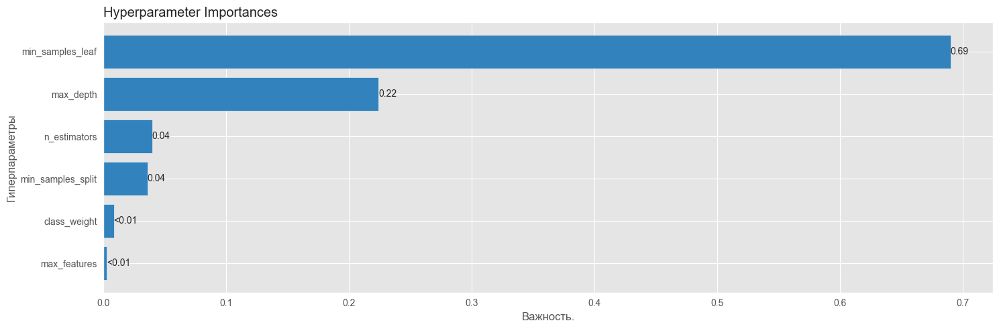

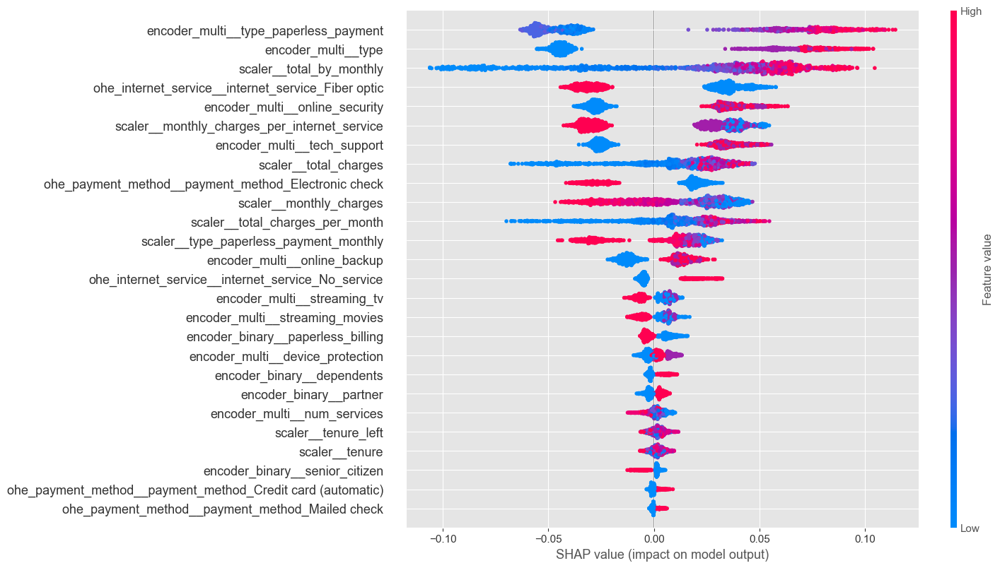

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~



  0%|          | 0/100 [00:00<?, ?it/s]

Маскимальное значение ROC AUC: 0.8508
{'n_estimators': 550, 'max_depth': 1, 'learning_rate': 0.029947109826599417, 'subsample': 0.49247953714053816, 'colsample_bytree': 0.38563613527218704, 'gamma': 0.8056574744906226, 'reg_lambda': 0.2301952270212348, 'reg_alpha': 0.12616411358965546, 'class_weight': None, 'objective': 'binary:logistic'}
Гиперпараметры лучшей модели:


{'model__n_estimators': 550,
 'model__max_depth': 1,
 'model__learning_rate': 0.029947109826599417,
 'model__subsample': 0.49247953714053816,
 'model__colsample_bytree': 0.38563613527218704,
 'model__gamma': 0.8056574744906226,
 'model__reg_lambda': 0.2301952270212348,
 'model__reg_alpha': 0.12616411358965546,
 'model__class_weight': None,
 'model__objective': 'binary:logistic'}

Отобранные признаки:


Index(['type', 'paperless_billing', 'payment_method', 'monthly_charges',
       'total_charges', 'senior_citizen', 'partner', 'dependents',
       'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'tenure', 'tenure_left', 'num_services', 'total_charges_per_month',
       'total_by_monthly', 'type_paperless_payment',
       'type_paperless_payment_monthly',
       'monthly_charges_per_internet_service'],
      dtype='object')

Неотобранные признаки:


[]

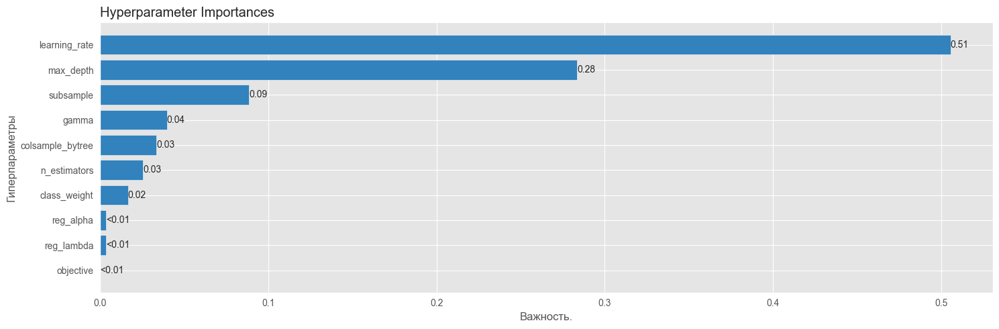

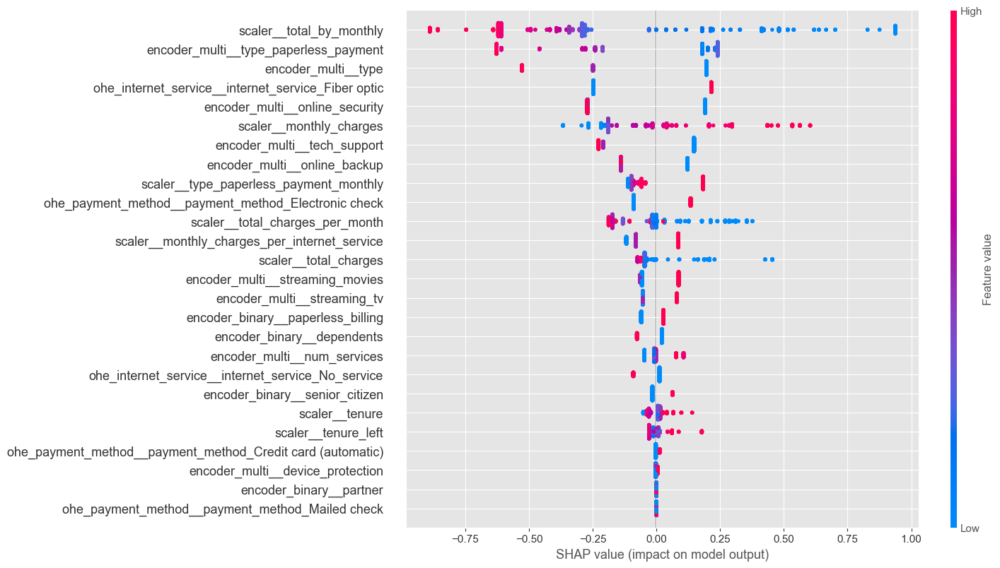

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~



  0%|          | 0/100 [00:00<?, ?it/s]

Маскимальное значение ROC AUC: 0.8518
{'iterations': 300, 'loss_function': 'Logloss', 'bootstrap_type': 'Bayesian', 'depth': 2, 'logging_level': 'Silent', 'learning_rate': 0.06505991352481552, 'random_strength': 0.37293637380534517, 'class_weights': [73, 27]}
Гиперпараметры лучшей модели:


{'model__iterations': 300,
 'model__loss_function': 'Logloss',
 'model__bootstrap_type': 'Bayesian',
 'model__depth': 2,
 'model__logging_level': 'Silent',
 'model__learning_rate': 0.06505991352481552,
 'model__random_strength': 0.37293637380534517,
 'model__class_weights': [73, 27]}

Отобранные признаки:


Index(['type', 'paperless_billing', 'payment_method', 'monthly_charges',
       'total_charges', 'senior_citizen', 'partner', 'dependents',
       'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'tenure', 'tenure_left', 'num_services', 'total_charges_per_month',
       'total_by_monthly', 'type_paperless_payment',
       'type_paperless_payment_monthly',
       'monthly_charges_per_internet_service'],
      dtype='object')

Неотобранные признаки:


[]

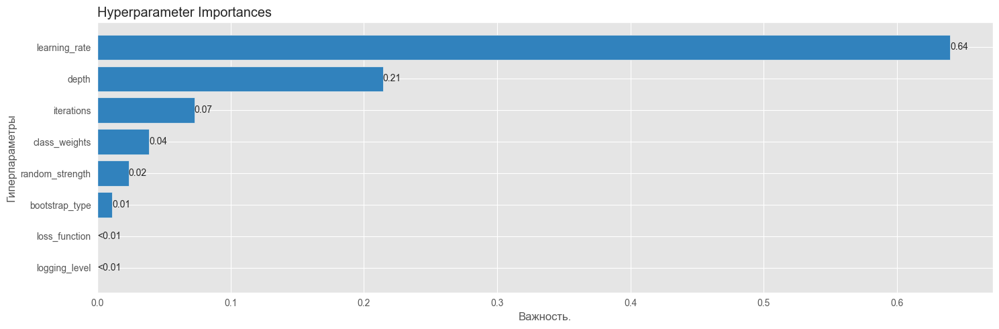

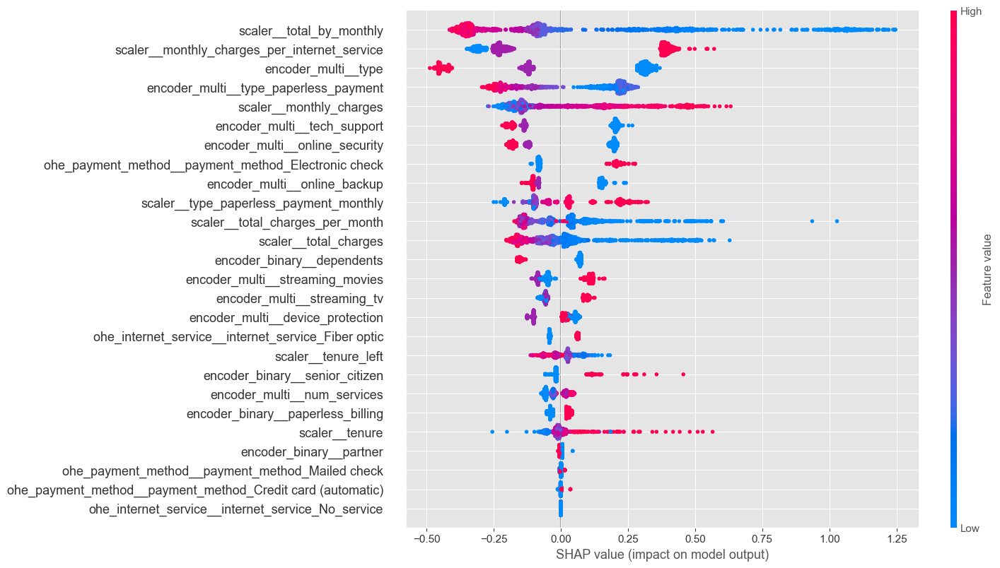

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


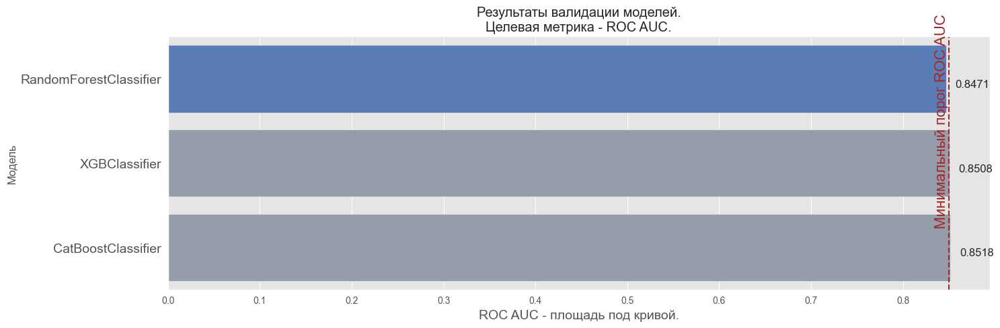

,Модель,ROC AUC,f1 мера,Доля верных ответов (accuracy),Точность,Полнота,Время обучения,Время предсказания
0,CatBoostClassifier,0.851792,0.380531,0.788039,0.245014,0.851485,0.585385,0.028960


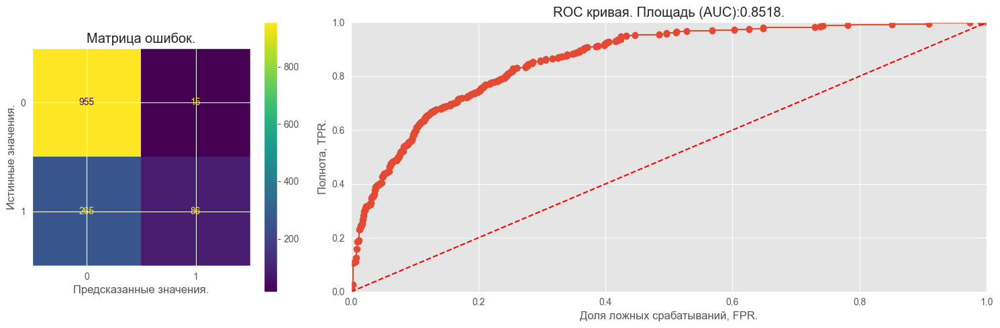

CPU times: total: 2h 6min 27s
Wall time: 37min 18s


In [36]:
%%time
(study_tree, model_tree, 
 col_transformer_tree) = test_stand(['rfc', 'xgb', 'cbc'], n_trials=100,
                                    X=X_train, y=y_train,
                                    all_feats=True)

- Проведём валидацию `MLPClassifier`.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Маскимальное значение ROC AUC: 0.8221
{'feature_mask': 2047, 'hidden_layer_sizes': (100, 100), 'activation': 'relu', 'solver': 'sgd', 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 200, 'batch_size': 'auto', 'shuffle': True}
Гиперпараметры лучшей модели:


{'model__hidden_layer_sizes': (100, 100),
 'model__activation': 'relu',
 'model__solver': 'sgd',
 'model__learning_rate': 'constant',
 'model__learning_rate_init': 0.001,
 'model__max_iter': 200,
 'model__batch_size': 'auto',
 'model__shuffle': True}

Отобранные признаки:


['online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'tenure',
 'num_services',
 'total_charges_per_month',
 'total_by_monthly',
 'type_paperless_payment',
 'type_paperless_payment_monthly']

Неотобранные признаки:


['type',
 'paperless_billing',
 'payment_method',
 'monthly_charges',
 'senior_citizen',
 'partner',
 'dependents',
 'internet_service',
 'online_security']

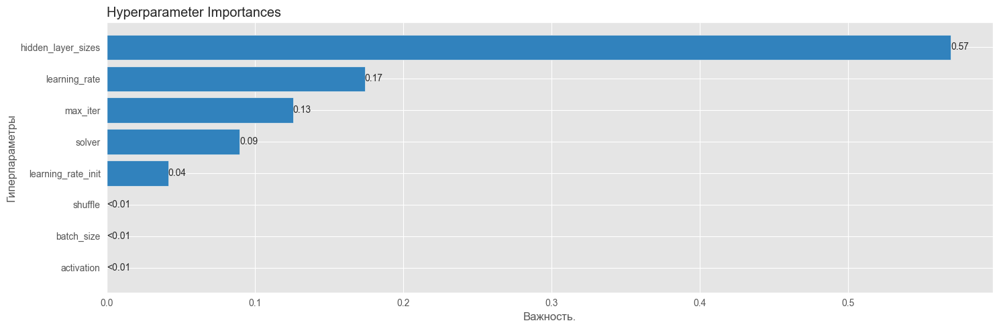

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


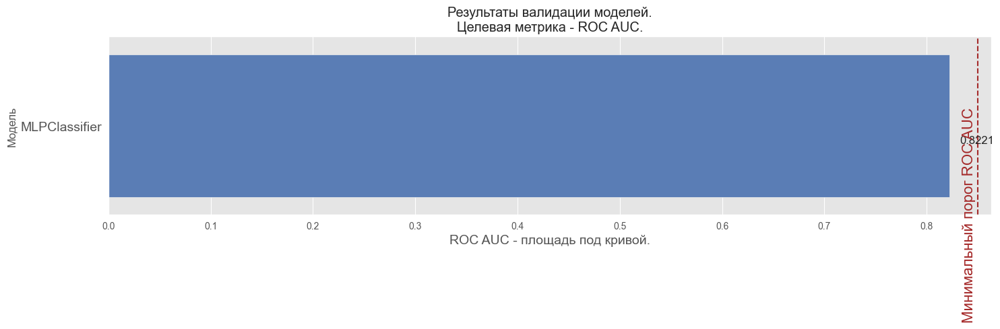

,Модель,ROC AUC,f1 мера,Доля верных ответов (accuracy),Точность,Полнота,Время обучения,Время предсказания
0,MLPClassifier,0.822140,0.618391,0.748675,0.766382,0.518304,10.371311,0.021867


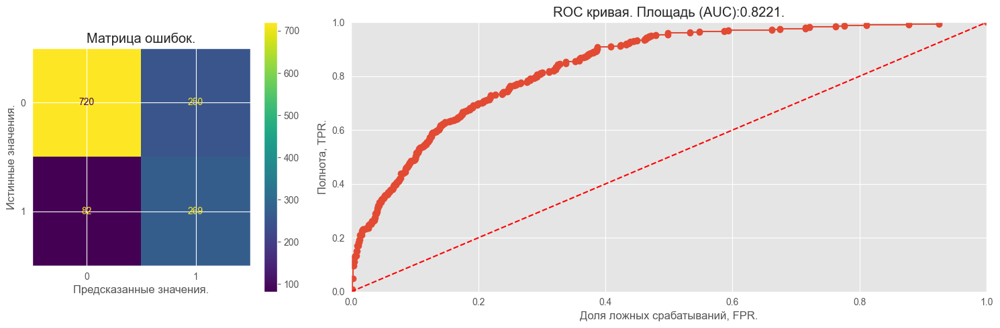

CPU times: total: 1h 38min 2s
Wall time: 27min 59s


In [37]:
%%time
(study_mlp, model_mlp, 
 col_transformer_mlp) = test_stand(['mlp'], n_trials=30,
                                    X=X_train, y=y_train,
                                    encoder_binary=OneHotEncoder,
                                    encoder_multi=OneHotEncoder,
                                    smote=True,
                                    all_feats=False)

### Обучение и валидация. Вывод.

- Была проведена валидация моделей с подбором гиперпараметров и наиболее полезных признаков.
- Наиболее важные признаки для лучшей модели `CatBoostClassifier`:
  - отношение общей и месячной сумм оплат `total_by_monthly`, что, скорее всего, говорит об успешном разделении абонентов по суммам оплаты;
  - средний расход по категориям подключения к инетернету `monthly_charges_per_internet_service`: модель нашла полезным яркое разделение между оптоволоконным подключением, где самый большой отток, и другими типами;
  - тип контракта `type`, модель обнаружила высокий отток пользователей с месячным типок контракта;
  - совмещённый признак типа контракта и счёта и типа платежа  `type_paperless_payment`, отражающий приверженность компании абонентов с долгим контрактом и бумажными счетами с одной стороны и месячным подклоючением и электронными счетами с другой;
  - `monthly_charges` - модель обнаружила разделение между большими и маленькими суммами оплат;
  - `tech_support`, `online_security` и др., так же отражающие вовлечённость клиента и планирование пользоваться услугами компании длительное время.
  

- Проверим результаты на тестовой выборке.

## Тестирование модели.

- Соаздадим функцию вывода данных и проверим лучшую модель на тестовой выборке.

In [38]:
# Зададим признаки  и гиперпараметры для тестовой выборки.
def final_test(model : callable, 
               study : 'Optuna Study', 
               col_transformer : ColumnTransformer, 
               X_train : pd.DataFrame, 
               y_train : pd.Series, 
               X_test : pd.DataFrame, 
               y_test : pd.Series) -> None:
    params = study.best_params
    if 'feature_mask' in study.best_params:
        feature_mask = study.best_params['feature_mask']
        binary_mask = [int(bit) for bit in (bin(feature_mask)[2:].zfill(len(X_train.columns)))]
        features = [X_train.columns[i] for i, bit in enumerate(binary_mask) if bit == 1]
        params.pop('feature_mask')
    else:
        features = X_train.columns
    model = model
    X_train_final = X_train[features]
    X_test_final = X_test[features]
    y_train_final = y_train

    # Построим и обучим финальный тестовый пайплайн.
    col_trans = col_transformer
    col_trans.fit(X_train_final, y_train_final)
    test_pipe = Pipeline([('col_trans', col_trans),
                          ('model', model(random_state=SEED))])
    test_pipe.set_params(**{'model__' + k : v for k, v in params.items()})
    train_time = perf_counter()
    test_pipe.fit(X_train_final, y_train_final)
    train_time = perf_counter() - train_time

    print_h('Результат тестирования.')
    print_h('-'*70, '\n')
    # Вычисление метрик ы вывод оценок и графиков.
    # Рассчитаем ошибки классификации.
    proba_one = test_pipe.predict_proba(X_test_final)
    auc_roc_test = roc_auc_score(y_test, proba_one[:, 1])
    predict_time = perf_counter()
    proba_one_threshold = (proba_one[:,1] > .5)
    predict_time = perf_counter() - predict_time
    fpr, tpr, _ = roc_curve(y_test, proba_one[:, 1], pos_label=1)
    conf_matrix = confusion_matrix(y_test, proba_one_threshold)
    recall_test = recall_score(y_test, proba_one_threshold, pos_label=1)
    precis_test = precision_score(y_test, proba_one_threshold, pos_label=1)
    accuracy_test = accuracy_score(y_test, proba_one_threshold)
    f1_test = f1_score(y_test, proba_one_threshold, pos_label=1)

    display_s(
        pd.DataFrame(
            [test_pipe['model'].__class__.__name__, auc_roc_test, f1_test, 
             accuracy_test, recall_test, precis_test, train_time, predict_time],
            index = ['Модель', 'ROC AUC', 'f1 мера',  
                     'Доля верных ответов (accuracy)', 'Точность', 'Полнота', 
                     'Время обучения', 'Время предсказания']
            ).T, 'Модель на тестовой выборке.'
        )

    # Вычислим и выведем влияния признаков.
    # Зададим эксплейнер.
    if model in [RandomForestClassifier, CatBoostClassifier, XGBClassifier]:
        explainer = shap.TreeExplainer(test_pipe['model'])
        # Вычислим значения SHAP.
        if model == RandomForestClassifier:
            shap_values = explainer.shap_values(col_trans.transform(X_test_final))[:, :, 0]
        elif model in [CatBoostClassifier, XGBClassifier]:
            shap_values = explainer.shap_values(col_trans.transform(X_test_final))

        # Визуализируем значения SHAP.
        print_h('<br>Важность признаков.')
        shap.summary_plot(
            shap_values, 
            _data:=pd.DataFrame(col_trans.transform(X_test_final), 
                         columns=test_pipe[:-1].get_feature_names_out()), 
            max_display=_data.shape[1],
            plot_size=(MPL_WIDTH,
                       np.log(round(len(test_pipe[:-1].get_feature_names_out())))*MPL_HEIGHT*.5),
            class_names=['0', '1'])
    print('~'*70)

    # Вывод матрицы ошибок и кривой ROC для лучшей модели.
    print_h('<br>Матрица ошибок и кривая ROC <br>для лучшей модели на тестовой выборке.')
    print_h('-'*70, '\n')
    fig = plt.figure(figsize=(MPL_WIDTH, MPL_HEIGHT))
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 7])
    ax1 = fig.add_subplot(gs[0])
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix,
                           display_labels=test_pipe['model'].classes_).plot(ax=ax1)
    ax1.set_title('Матрица ошибок.')
    ax1.set_xlabel('Предсказанные значения.')
    ax1.set_ylabel('Истинные значения.')
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(fpr, tpr, 'o-')
    ax2.set_xlim(0.0, 1.0)
    ax2.set_ylim(0.0, 1.0)
    ax2.set_xlabel('Доля ложных срабатываний, FPR.')
    ax2.set_ylabel('Полнота, TPR.')
    ax2.set_title(f'ROC кривая. Площадь (AUC):{auc(fpr, tpr):.4f}.')
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.show();

,Модель,ROC AUC,f1 мера,Доля верных ответов (accuracy),Точность,Полнота,Время обучения,Время предсказания
0,CatBoostClassifier,0.842012,0.330000,0.771721,0.211991,0.744361,0.634676,0.000006


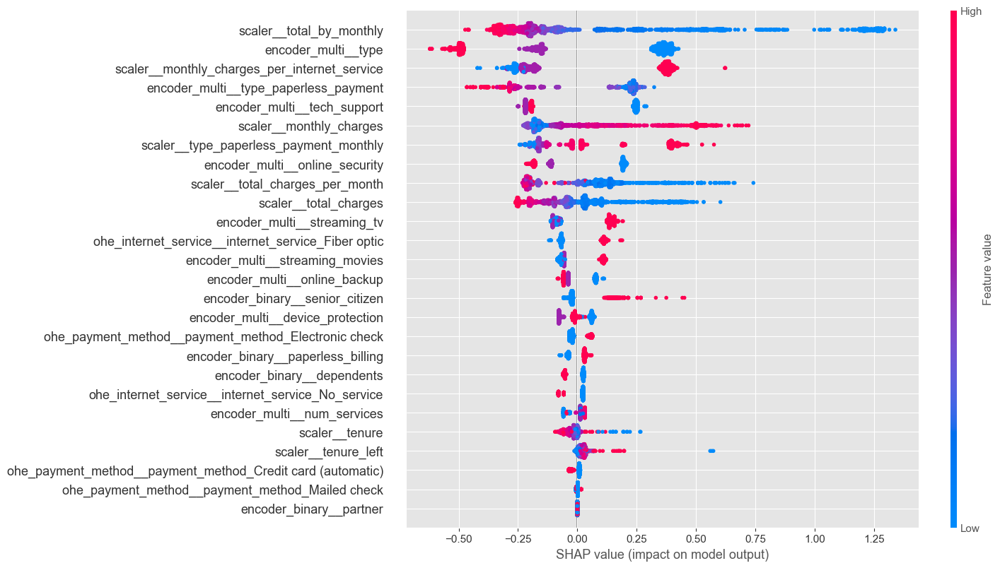

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


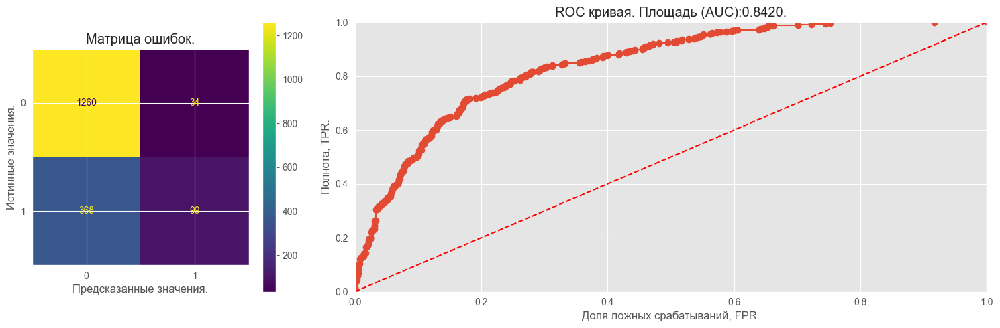

In [39]:
final_test(model_tree, study_tree, col_transformer_tree, 
           X_train, y_train, X_test, y_test)

### Тестирование модели. Вывод.
- Лучшая модель обладает следующими характеристиками:
  - ROC AUC = 0.84 - модель адеватна;
  - __accuracy__ модели - 0.77.<br>
  При рассмотрении матрицы ошибок видно, что эта невысокая точность достигнута благодаря дисбалансу классов - высокому количеству истинноотрицательных ответов. 
  - Важность признаков соответствует валидационной:
    - отношение общей и месячной сумм оплат `total_by_monthly`;
    - тип контракта `type`;
    - средний расход по категориям подключения к интернету `monthly_charges_per_internet_service`;
    - совмещённый признак типа контракта и счёта и типа платежа  `type_paperless_payment`;
    - `tech_support` - техническа поддержка;
    - `monthly_charges` - месячные расходы.

## Зависимость входного признака от целевого.

Построим график зависимости одного их самых важных входных признаков `type` от целевого. 

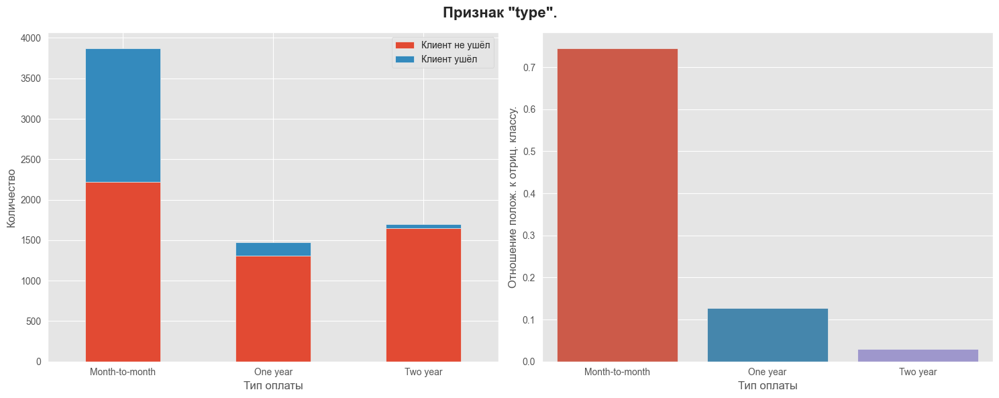

In [40]:
get_eda_plots(df_final[['type', 'churn']], target=TARGET)

- Один из наиболее важных признаков `type` - тип контракта, производная которого `type_paperless_payment` также вошла топ-5 признаков, показывает, что при оплате помесячно уходят больше всего абонентов.
- Стоить направить усилия на привлечение клиентов к более длительным контрактам.

In [41]:
notebook_time = perf_counter() - notebook_time_start
print(f'Время выполнения ноутбука: {notebook_time//60} мин.')

Время выполнения ноутбука: 67.0 мин.


## Общий вывод.

### Задача.
Создание модели бинарной классификации, обученной "с учителем", с максимизацией метрики $ROC-AUC$.

### Результаты работы.
- Была построена модель, предсказывающая уход абонента, со следующими характеристиками:
  - ROC AUC = 0.84 - модель адеватна;
  - __accuracy__ модели - 0.77.
  При рассмотрении матрицы ошибок видно, что эта невысокая точность достигнута благодаря дисбалансу классов - высокому количеству истинноотрицательных ответов. 
  - Важность признаков соответствует валидационной:
    - отношение общей и месячной сумм оплат `total_by_monthly`;
    - тип контракта `type`;
    - средний расход по категориям подключения к интернету `monthly_charges_per_internet_service`;
    - совмещённый признак типа контракта и счёта и типа платежа  `type_paperless_payment`;
    - `tech_support` - техническа поддержка;
    - `monthly_charges` - месячные расходы.

### Ход работы.
- Был проведён исследовательский анализ данных и корреляционный анализ, создано/отобрано 28 признаков для обучения.
- Данные были разделены на обучающий и тестовый наборы в пропорциях 3:1.
- Были созданы дополнительные признаки на основе имеющихся данных.
- Для обучения данные были закодированы
  - порядковым и модифицированным целевым кодированием для моделей на основе деревьев (при создании производных двух признаков `internet_services` и `payment_tpe`использовалось прямое кодирование.);
  - прямым кодированием для нейросети. 
- Был реализован автоматический перебор гиперпараметров и признаков.
- Была проведена валидация моделей с подбором гиперпараметров и наиболее полезных признаков.
- На основе валидации была отобрана лучшая модель и произведено её тестирование на тестовой выборке.

### Состав и анализ данных.
- Из базы данных были загружены 4 таблицы, соответствующие описанию. Таблицы были объединены по по уникальному ключу - ID абонентов.
- Размер объединённого датафрейма: 7043 объектов и 24 признака, один из которых, `churn`, является целевым.<br><br>

### Целевой признак.
- Был создан целевой признак с положительным классом 1 для клиентов с присутствующей датой закрытия контракта.
- Целевой признак `churn` - бинарный.
- Классы несбалансированы, что было учтено при моделировании.

### Пропуски, дубликаты и аномалии.
- Пропуски.
  - Пропуски в столбце `end_date` для новых клиентов заполнены последней актуальной уникальной датой - `2020-02-01`.
  - Пропуски, появившиеся после объединения из таблиц `internet` и `phone`, были заполнены значением `No_service`, для абонентов, не пользующихся данными услугами.
- Дубликаты.
  - Явных дубликатов в данных не обнаружено.
- Аномалии.
  - Данные месячных расходов, общих расходов и длительность использования услуг не соответствуют друг-другу, что может быть связано с предоставлением дополнительных услуг или скидок.
  - Отток абонентов начался незадого до даты сбора и формирования таблиц (01.10.2019) и равномерен от месяца к месяцу.
  - Дата начала оттока клиентов приближенно совпадает с периодом спада кол-ва новых договоров, что может говорить об одной причине двух явлений.
  
### Способы улучшения метрики.
- Возможно построение нейросети с более сложной конфигурацией.

### Рекомендации заказчику.
- Рекомендуем заказчику сконцентрировать маркетинговые усилия на услугах, сопровождающих подключение к интернет и стриминг-услуги:
  - `internet_service`, `online_security`, `online_backup`, `device_protection`, `tech_support`,
  - `streaming_tv`, `streaming_movies`.  
- Также рекомендуем продвигать годовые и двухгодичные контракты.